# **Sistema de Análisis Predictivo para Optimización de la Producción de Energía Renovable en Colombia**

# **Importar Librerías a usar**

In [1]:
import pandas as pd
import numpy as np
import math as mt
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, Flatten, Dropout

import plotly.graph_objects as go
import plotly.subplots as sp


# **Cargar archivo con los datos de regresión**

In [2]:
df0 = pd.read_csv('/content/Solar_Prediction.csv', sep = ',')

print(df0)

         UNIXTime                   Data      Time  Radiation  Temperature  \
0      1475229023  9/29/2016 12:00:00 AM  23:50:23       1.21           48   
1      1475228726  9/29/2016 12:00:00 AM  23:45:26       1.23           48   
2      1475228421  9/29/2016 12:00:00 AM  23:40:21       1.21           48   
3      1475228124  9/29/2016 12:00:00 AM  23:35:24       1.17           48   
4      1475227824  9/29/2016 12:00:00 AM  23:30:24       1.21           48   
...           ...                    ...       ...        ...          ...   
32680  1480587604       12-01-2016 00:00  00:20:04       1.22           44   
32681  1480587301       12-01-2016 00:00  00:15:01       1.17           44   
32682  1480587001       12-01-2016 00:00  00:10:01       1.20           44   
32683  1480586702       12-01-2016 00:00  00:05:02       1.23           44   
32684  1480586402       12-01-2016 00:00  00:00:02       1.20           44   

       Pressure  Humidity  WindDirection(Degrees)  Speed TimeSu

In [3]:
df0['Time'] = pd.to_datetime(df0['Time'], format='%H:%M:%S').dt.time

# rango de tiempo para filtrar
start_time = pd.to_datetime('06:00:00', format='%H:%M:%S').time()  # 06:00
end_time = pd.to_datetime('18:00:00', format='%H:%M:%S').time()    # 18:00

# Filtrar las filas 06:00 y las 18:00
df_filtered = df0[(df0['Time'] >= start_time) & (df0['Time'] <= end_time)]

# Reinicia índice
df_filtered.reset_index(drop=True, inplace=True)

df = df_filtered

# Verifica el resultado
print(df)


         UNIXTime                   Data      Time  Radiation  Temperature  \
0      1475207722  9/29/2016 12:00:00 AM  17:55:22      27.14           55   
1      1475207419  9/29/2016 12:00:00 AM  17:50:19      33.75           56   
2      1475207122  9/29/2016 12:00:00 AM  17:45:22      49.57           56   
3      1475206822  9/29/2016 12:00:00 AM  17:40:22      59.62           56   
4      1475206538  9/29/2016 12:00:00 AM  17:35:38      87.23           56   
...           ...                    ...       ...        ...          ...   
16277  1480609201       12-01-2016 00:00  06:20:01       1.22           44   
16278  1480608904       12-01-2016 00:00  06:15:04       1.18           44   
16279  1480608602       12-01-2016 00:00  06:10:02       1.19           44   
16280  1480608302       12-01-2016 00:00  06:05:02       1.18           44   
16281  1480608004       12-01-2016 00:00  06:00:04       1.19           44   

       Pressure  Humidity  WindDirection(Degrees)  Speed TimeSu

In [4]:
df_rad_filter = df[['Radiation', 'Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']]

df_all_Var = df0[['Radiation', 'Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']]

print(df_rad_filter)

       Radiation  Temperature  Pressure  Humidity  WindDirection(Degrees)  \
0          27.14           55     30.44        53                   47.86   
1          33.75           56     30.44        52                   74.56   
2          49.57           56     30.44        49                   25.72   
3          59.62           56     30.44        50                  102.11   
4          87.23           56     30.44        48                   67.49   
...          ...          ...       ...       ...                     ...   
16277       1.22           44     30.40        97                   55.88   
16278       1.18           44     30.40        97                  119.96   
16279       1.19           44     30.40        96                  140.62   
16280       1.18           44     30.39        96                  117.36   
16281       1.19           44     30.39        96                  156.26   

       Speed  
0       4.50  
1       2.25  
2       6.75  
3       2.25  


# **Verificación de datos**

In [5]:
# Verificar datos nulos
print("Información de los datos nulos en la variable df")
print()
print(df_all_Var.isnull().sum())
print()
print("Cantidad total de datos nulos en el df:")
print(df_all_Var.isnull().sum().sum())

Información de los datos nulos en la variable df

Radiation                 0
Temperature               0
Pressure                  0
Humidity                  0
WindDirection(Degrees)    0
Speed                     0
dtype: int64

Cantidad total de datos nulos en el df:
0


In [6]:
#Verificar los tipos de datos
print("Tipos de datos en el df:")
print(df_all_Var.dtypes)

Tipos de datos en el df:
Radiation                 float64
Temperature                 int64
Pressure                  float64
Humidity                    int64
WindDirection(Degrees)    float64
Speed                     float64
dtype: object


# **Analizar Datos**

In [7]:
print(df_all_Var.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32685 entries, 0 to 32684
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Radiation               32685 non-null  float64
 1   Temperature             32685 non-null  int64  
 2   Pressure                32685 non-null  float64
 3   Humidity                32685 non-null  int64  
 4   WindDirection(Degrees)  32685 non-null  float64
 5   Speed                   32685 non-null  float64
dtypes: float64(4), int64(2)
memory usage: 1.5 MB
None


In [8]:
df_stats = df_all_Var.describe()
print(df_stats)

          Radiation   Temperature      Pressure      Humidity  \
count  32685.000000  32685.000000  32685.000000  32685.000000   
mean     207.130997     51.103350     30.422878     75.016797   
std      315.919167      6.201228      0.054674     25.990465   
min        1.110000     34.000000     30.190000      8.000000   
25%        1.230000     46.000000     30.400000     56.000000   
50%        2.660000     50.000000     30.430000     85.000000   
75%      354.240000     55.000000     30.460000     97.000000   
max     1601.260000     71.000000     30.560000    103.000000   

       WindDirection(Degrees)         Speed  
count            32685.000000  32685.000000  
mean               143.488784      6.243888  
std                 83.168561      3.490525  
min                  0.090000      0.000000  
25%                 82.220000      3.370000  
50%                147.700000      5.620000  
75%                179.310000      7.870000  
max                359.950000     40.500000  


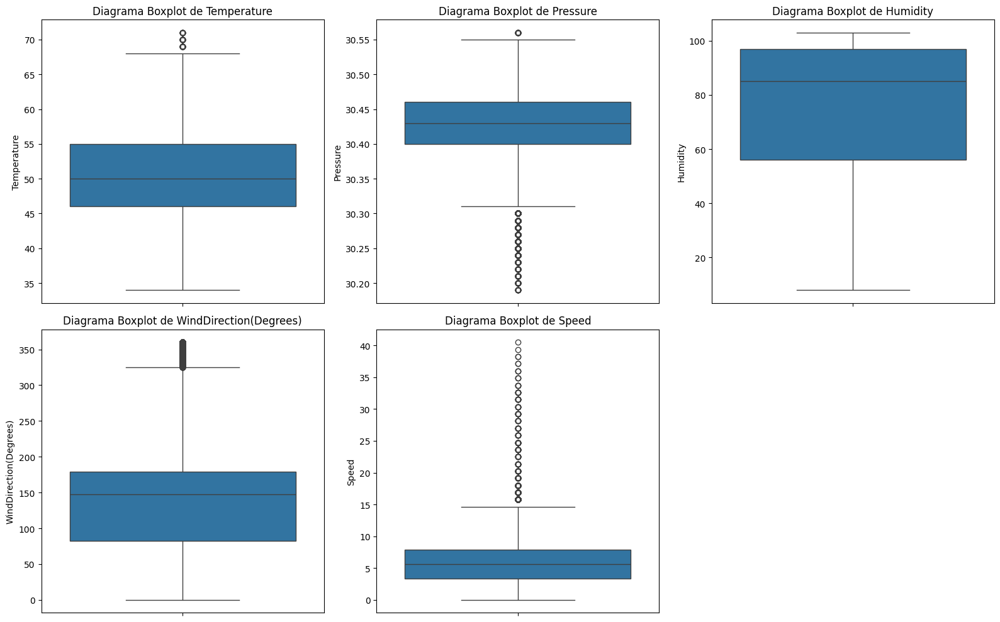

In [9]:
# Gráficas de boxplot para cada columna

plt.figure(figsize=(16, 10))

variables = ['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']

for i, var in enumerate(variables, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(data=df_all_Var, y=var)
    plt.title(f'Diagrama Boxplot de {var}')

plt.tight_layout()
plt.show()

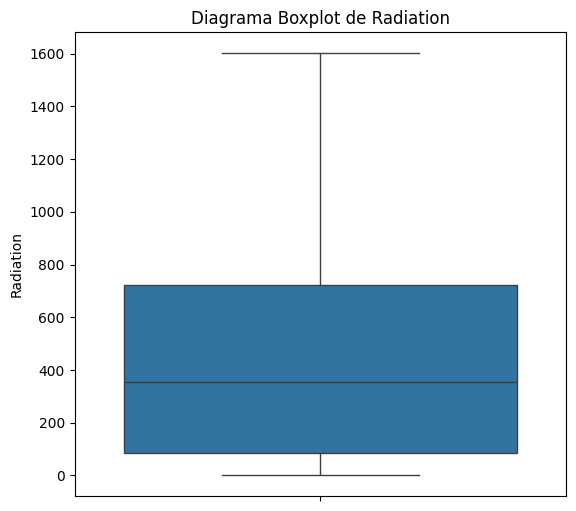

In [10]:
# Gráficas de boxplot para cada radiación filtrada

plt.figure(figsize=(16, 10))

variables2 = ['Radiation']

for i, var in enumerate(variables2, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(data=df_rad_filter, y=var)
    plt.title(f'Diagrama Boxplot de {var}')

plt.tight_layout()
plt.show()

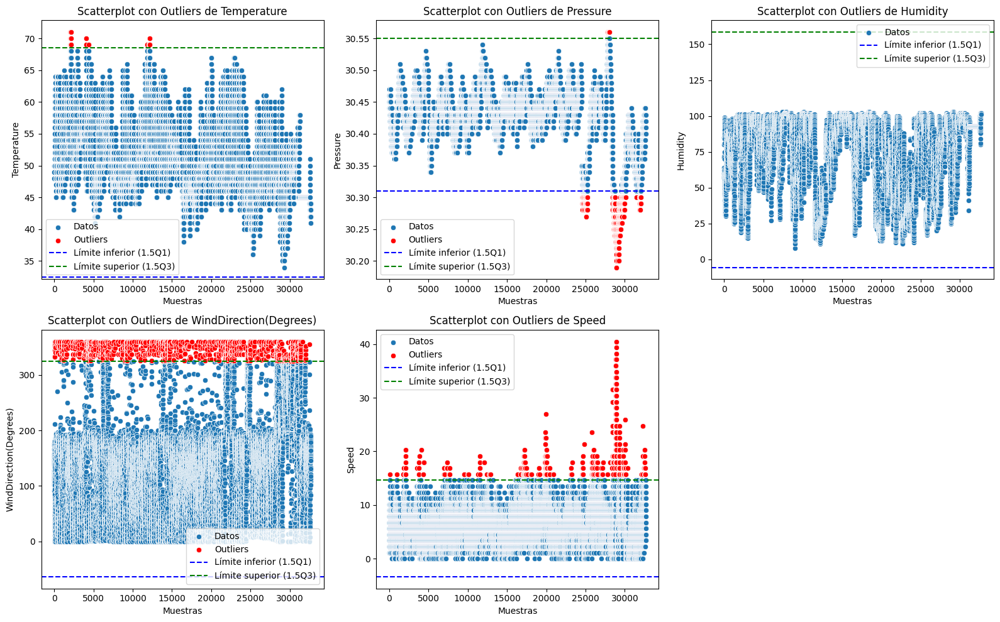

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Lista de variables a graficar
variables = ['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']

plt.figure(figsize=(16, 10))

for i, var in enumerate(variables, 1):
    # Calcular Q1, Q3 y los límites de los outliers
    Q1 = df_all_Var[var].quantile(0.25)
    Q3 = df_all_Var[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identificar outliers
    outliers = df_all_Var[(df_all_Var[var] < lower_bound) | (df_all_Var[var] > upper_bound)]

    # Graficar scatterplot con puntos de outliers en otro color
    plt.subplot(2, 3, i)
    sns.scatterplot(data=df_all_Var, x=np.arange(len(df_all_Var)), y=var, label="Datos")
    sns.scatterplot(data=outliers, x=outliers.index, y=var, color="red", label="Outliers")

    # Trazar líneas punteadas para los límites
    plt.axhline(y=lower_bound, color="blue", linestyle="--", label="Límite inferior (1.5Q1)")
    plt.axhline(y=upper_bound, color="green", linestyle="--", label="Límite superior (1.5Q3)")

    plt.title(f'Scatterplot con Outliers de {var}')
    plt.xlabel("Muestras")
    plt.legend()

plt.tight_layout()
plt.show()

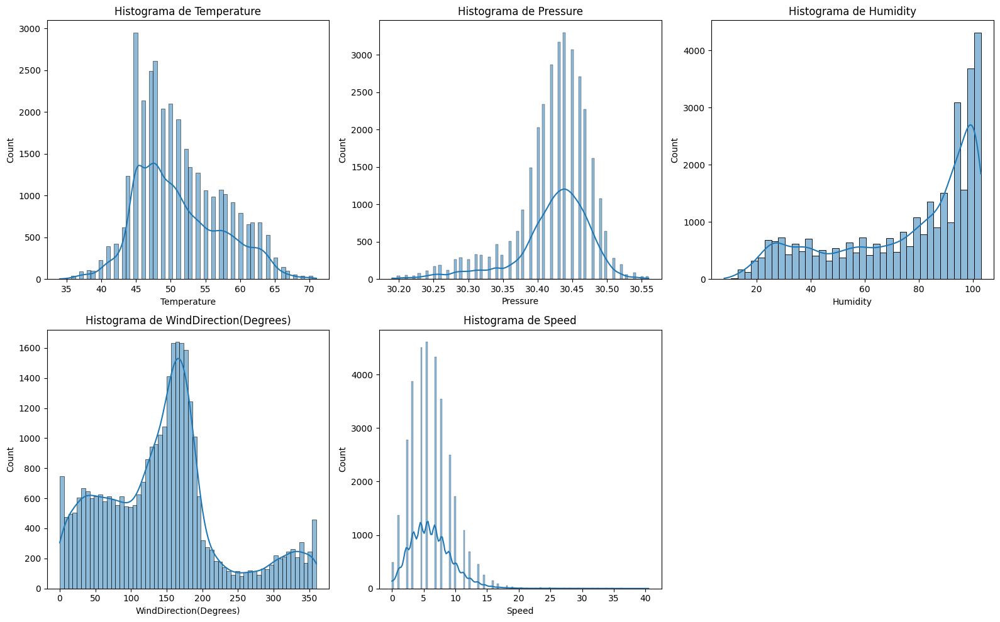

In [12]:
# Crear gráficas de histogramas para cada columna o variable

plt.figure(figsize=(16, 10))

for i, var in enumerate(variables, 1):
    plt.subplot(2, 3, i)
    sns.histplot(df_all_Var[var], kde=True)
    plt.title(f'Histograma de {var}')

plt.tight_layout()
plt.show()

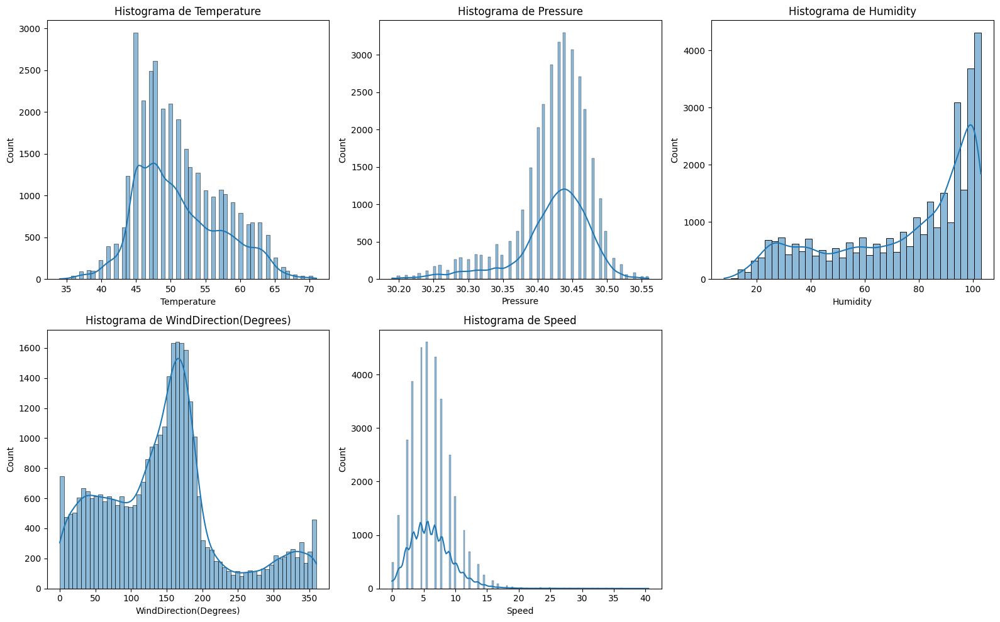

Tabla de Distribuciones:
                 Variable          Distribución  Asimetría  Curtosis
0             Temperature    Sesgo a la derecha   0.522059 -0.316207
1                Pressure  Sesgo a la izquierda  -1.226916  2.119787
2                Humidity  Sesgo a la izquierda  -0.776331 -0.750644
3  WindDirection(Degrees)    Sesgo a la derecha   0.568643  0.231091
4                   Speed            Log-normal   1.469778  6.631838


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import shapiro

# Lista de variables a analizar
variables = ['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']

# Diccionario para almacenar los resultados de la distribución
distribution_results = {'Variable': [], 'Distribución': [], 'Asimetría': [], 'Curtosis': []}

plt.figure(figsize=(16, 10))

for i, var in enumerate(variables, 1):
    # Graficar el histograma con KDE
    plt.subplot(2, 3, i)
    sns.histplot(df_all_Var[var], kde=True)
    plt.title(f'Histograma de {var}')

    # Calcular asimetría y curtosis
    skewness = df_all_Var[var].skew()
    kurtosis = df_all_Var[var].kurtosis()

    # Determinar el tipo de distribución
    if abs(skewness) < 0.5 and abs(kurtosis) < 3:
        distribution_type = 'Normal'
    elif skewness > 1 and kurtosis > 3:
        distribution_type = 'Log-normal'
    elif skewness > 0.5:
        distribution_type = 'Sesgo a la derecha'
    elif skewness < -0.5:
        distribution_type = 'Sesgo a la izquierda'
    elif skewness > 2 and abs(kurtosis) < 1:
        distribution_type = 'Distribución en J'
    else:
        distribution_type = 'Distribución Desconocida'

    # Guardar el resultado en el diccionario
    distribution_results['Variable'].append(var)
    distribution_results['Distribución'].append(distribution_type)
    distribution_results['Asimetría'].append(skewness)
    distribution_results['Curtosis'].append(kurtosis)

# Mostrar los gráficos
plt.tight_layout()
plt.show()

# Crear un DataFrame con los resultados de la distribución
distribution_df = pd.DataFrame(distribution_results)

# Imprimir la tabla de distribución
print("Tabla de Distribuciones:")
print(distribution_df)


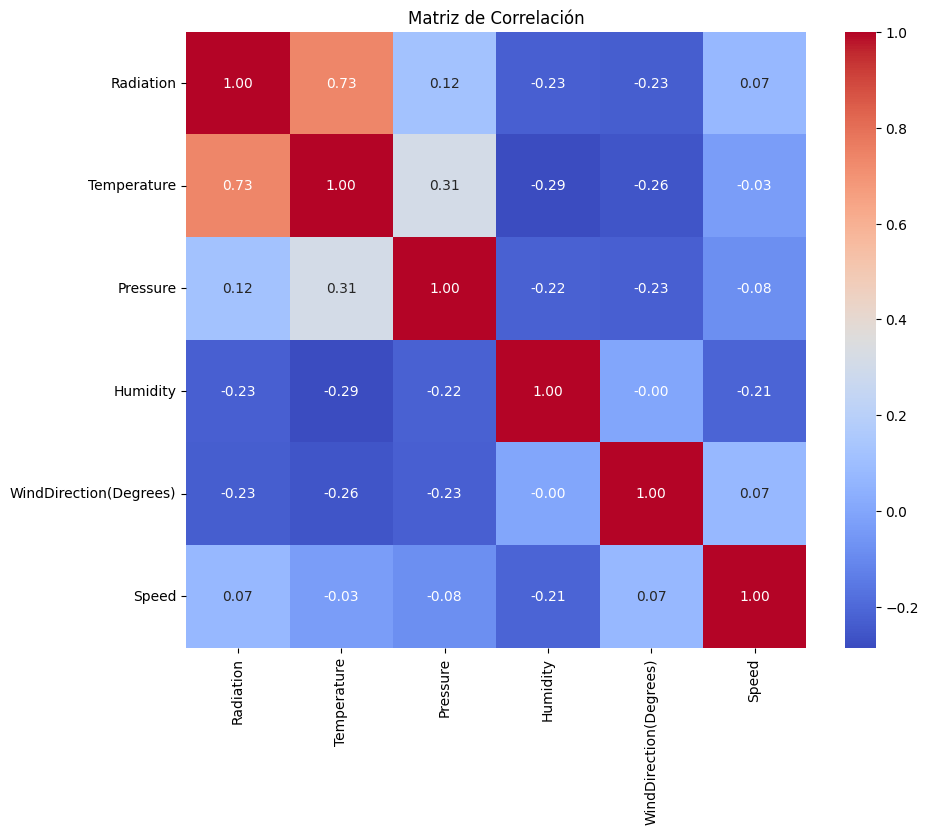

In [14]:
# Matriz de correlación

corr = df_all_Var.corr()

# Crear mapa de calor en la matriz de correlación

plt.figure(figsize=(10, 8))

sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title(f'Matriz de Correlación')
plt.show()

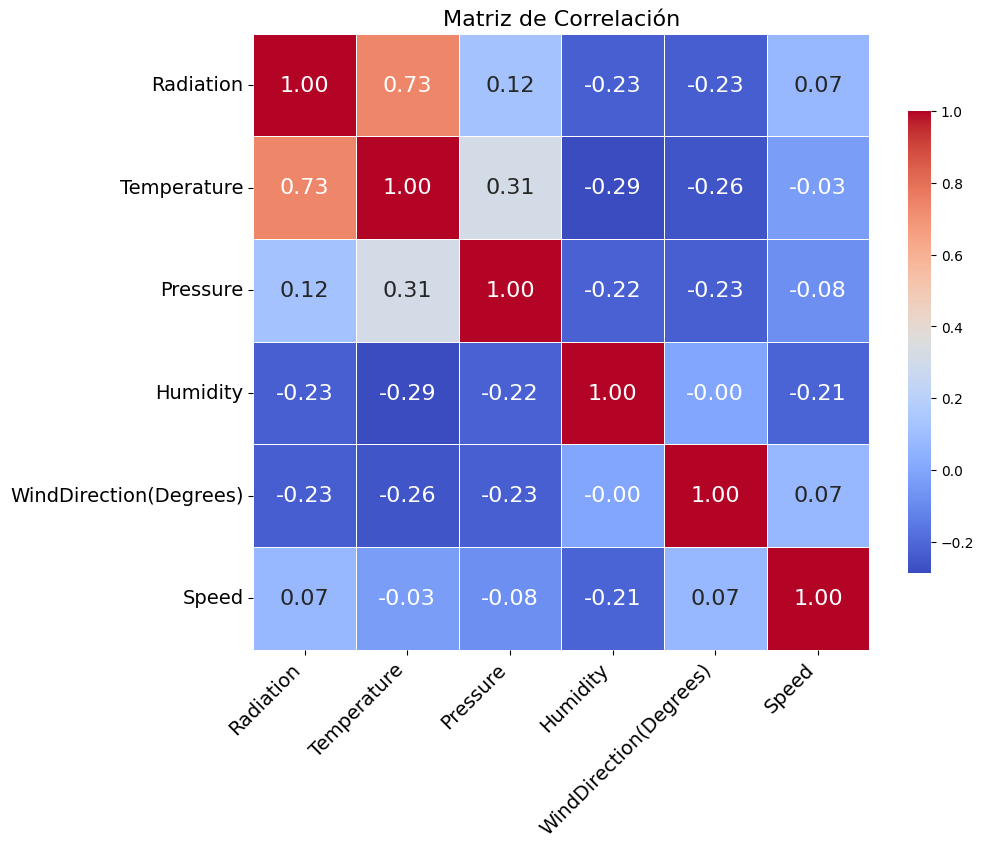

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Matriz de correlación
corr = df_all_Var.corr()

# Crear mapa de calor con mejoras en la visualización
plt.figure(figsize=(10, 8))  # Tamaño de la figura

# Crear el heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 16},  # Aumentar el tamaño de las letras
            linewidths=0.5, cbar_kws={"shrink": 0.75}, square=True,  # Alineación y barra de color más pequeña
            xticklabels=corr.columns, yticklabels=corr.columns)  # Asegurarse de que los nombres de las columnas estén bien alineados

# Rotar las etiquetas de los ejes para mejorar la legibilidad
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(rotation=0, fontsize=14)

# Título de la gráfica
plt.title('Matriz de Correlación', fontsize=16)

# Mostrar la gráfica
plt.show()


In [16]:
# Detectar outliers numéricamente
for var in variables:
    Q1 = df_all_Var[var].quantile(0.25)
    Q3 = df_all_Var[var].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df_all_Var[(df_all_Var[var] < (Q1 - 1.5 * IQR)) | (df_all_Var[var] > (Q3 + 1.5 * IQR))]

    print(f"Outliers en {var}:")
    print(outliers[var])
    print()

Outliers en Temperature:
2062     69
2063     69
2074     69
2075     69
2076     70
         ..
12140    70
12141    70
12142    70
12143    69
12144    69
Name: Temperature, Length: 89, dtype: int64

Outliers en Pressure:
24597    30.3
24598    30.3
24602    30.3
24603    30.3
24604    30.3
         ... 
32072    30.3
32073    30.3
32074    30.3
32075    30.3
32076    30.3
Name: Pressure, Length: 1662, dtype: float64

Outliers en Humidity:
Series([], Name: Humidity, dtype: int64)

Outliers en WindDirection(Degrees):
79       333.81
82       332.09
86       351.03
95       359.93
98       355.03
          ...  
31983    329.47
31984    345.27
31985    351.39
31986    336.52
32528    355.33
Name: WindDirection(Degrees), Length: 1617, dtype: float64

Outliers en Speed:
132      15.75
974      15.75
1821     15.75
1846     16.87
2022     15.75
         ...  
32545    15.75
32569    18.00
32592    16.87
32593    16.87
32594    15.75
Name: Speed, Length: 479, dtype: float64



In [17]:
variables_all = ['Radiation', 'Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed']


In [18]:
#  autocorrelación global
for var in variables_all:
    autocorr = df_all_Var[var].autocorr()  # Calcula la autocorrelación sin lag
    print(f"Autocorrelación de {var}: {autocorr}")

Autocorrelación de Radiation: 0.9597987325422068
Autocorrelación de Temperature: 0.9965278025205047
Autocorrelación de Pressure: 0.9973597318078385
Autocorrelación de Humidity: 0.993778995342883
Autocorrelación de WindDirection(Degrees): 0.5651046107066844
Autocorrelación de Speed: 0.5877600810404838


# **ENTRENAMIENTO ANN**

In [19]:
# Selección de las variables de interés
radiation = df_rad_filter[['Radiation']].values
temperature = df_all_Var[['Temperature']].values
pressure = df_all_Var[['Pressure']].values
humidity = df_all_Var[['Humidity']].values
windDirection = df_all_Var[['WindDirection(Degrees)']].values
speed = df_all_Var[['Speed']].values

In [20]:
# Escalado de los datos
# Definir los escaladores Min-Max
scaler_radiation = MinMaxScaler()
scaler_temperature = MinMaxScaler()
scaler_pressure = MinMaxScaler()
scaler_humidity = MinMaxScaler()
scaler_windDirection = MinMaxScaler()
scaler_speed = MinMaxScaler()

# Aplicar el escalado
radiation_scaled = scaler_radiation.fit_transform(radiation)
temperature_scaled = scaler_temperature.fit_transform(temperature)
pressure_scaled = scaler_pressure.fit_transform(pressure)
humidity_scaled = scaler_humidity.fit_transform(humidity)
windDirection_scaled = scaler_windDirection.fit_transform(windDirection)
speed_scaled = scaler_speed.fit_transform(speed)

# Función para crear secuencias de tiempo
def create_sequences(data, time_steps=48, prediction_steps=1):
    X, y = [], []
    for i in range(len(data) - time_steps - prediction_steps):
        X.append(data[i:(i + time_steps)])
        y.append(data[(i + time_steps):(i + time_steps + prediction_steps)])
    return np.array(X), np.array(y)

# Crear secuencias para cada variable
X_radiation, y_radiation = create_sequences(radiation_scaled)
X_temperature, y_temperature = create_sequences(temperature_scaled)
X_pressure, y_pressure = create_sequences(pressure_scaled)
X_humidity, y_humidity = create_sequences(humidity_scaled)
X_windDirection, y_windDirection = create_sequences(windDirection_scaled)
X_speed, y_speed = create_sequences(speed_scaled)

# División en conjuntos de entrenamiento y prueba para cada variable
X_train_rad, X_test_rad, y_train_rad, y_test_rad = train_test_split(X_radiation, y_radiation, test_size=0.3, random_state=42)
X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X_temperature, y_temperature, test_size=0.3, random_state=42)
X_train_press, X_test_press, y_train_press, y_test_press = train_test_split(X_pressure, y_pressure, test_size=0.3, random_state=42)
X_train_hum, X_test_hum, y_train_hum, y_test_hum = train_test_split(X_humidity, y_humidity, test_size=0.3, random_state=42)
X_train_wind, X_test_wind, y_train_wind, y_test_wind = train_test_split(X_windDirection, y_windDirection, test_size=0.3, random_state=42)
X_train_spd, X_test_spd, y_train_spd, y_test_spd = train_test_split(X_speed, y_speed, test_size=0.3, random_state=42)


In [21]:
import pandas as pd

# Crear un diccionario para almacenar los datos de cada variable
data_summary = {
    'Variable': ['Radiation', 'Temperature', 'Pressure', 'Humidity', 'WindDirection', 'Speed'],
    'Train Samples': [
        len(X_train_rad), len(X_train_temp), len(X_train_press),
        len(X_train_hum), len(X_train_wind), len(X_train_spd)
    ],
    'Test Samples': [
        len(X_test_rad), len(X_test_temp), len(X_test_press),
        len(X_test_hum), len(X_test_wind), len(X_test_spd)
    ]
}

# Convertir el diccionario en un DataFrame
df_summary = pd.DataFrame(data_summary)

# Calcular el total de muestras y el porcentaje
df_summary['Total Samples'] = df_summary['Train Samples'] + df_summary['Test Samples']
df_summary['Train %'] = (df_summary['Train Samples'] / df_summary['Total Samples']) * 100
df_summary['Test %'] = (df_summary['Test Samples'] / df_summary['Total Samples']) * 100

# Mostrar el DataFrame
print(df_summary)

        Variable  Train Samples  Test Samples  Total Samples    Train %  \
0      Radiation          11363          4870          16233  69.999384   
1    Temperature          22845          9791          32636  69.999387   
2       Pressure          22845          9791          32636  69.999387   
3       Humidity          22845          9791          32636  69.999387   
4  WindDirection          22845          9791          32636  69.999387   
5          Speed          22845          9791          32636  69.999387   

      Test %  
0  30.000616  
1  30.000613  
2  30.000613  
3  30.000613  
4  30.000613  
5  30.000613  


In [22]:
print(X_temperature)

[[[0.37837838]
  [0.37837838]
  [0.37837838]
  ...
  [0.43243243]
  [0.43243243]
  [0.43243243]]

 [[0.37837838]
  [0.37837838]
  [0.37837838]
  ...
  [0.43243243]
  [0.43243243]
  [0.43243243]]

 [[0.37837838]
  [0.37837838]
  [0.37837838]
  ...
  [0.43243243]
  [0.43243243]
  [0.43243243]]

 ...

 [[0.21621622]
  [0.21621622]
  [0.21621622]
  ...
  [0.27027027]
  [0.27027027]
  [0.27027027]]

 [[0.21621622]
  [0.21621622]
  [0.24324324]
  ...
  [0.27027027]
  [0.27027027]
  [0.27027027]]

 [[0.21621622]
  [0.24324324]
  [0.24324324]
  ...
  [0.27027027]
  [0.27027027]
  [0.27027027]]]


In [23]:
min_length = min(len(radiation_scaled), len(temperature_scaled), len(pressure_scaled),
                 len(humidity_scaled), len(windDirection_scaled), len(speed_scaled))

# Truncamos cada array a la longitud mínima
radiation_scaled = radiation_scaled[:min_length]
temperature_scaled = temperature_scaled[:min_length]
pressure_scaled = pressure_scaled[:min_length]
humidity_scaled = humidity_scaled[:min_length]
windDirection_scaled = windDirection_scaled[:min_length]
speed_scaled = speed_scaled[:min_length]

# Crear el DataFrame con los arrays truncados
df_scaled = pd.DataFrame({
    'Radiation': radiation_scaled.flatten(),
    'Temperature': temperature_scaled.flatten(),
    'Pressure': pressure_scaled.flatten(),
    'Humidity': humidity_scaled.flatten(),
    'WindDirection': windDirection_scaled.flatten(),
    'Speed': speed_scaled.flatten()
})

# Aplicar describe()
print(df_scaled.describe())

          Radiation   Temperature      Pressure      Humidity  WindDirection  \
count  16282.000000  16282.000000  16282.000000  16282.000000   16282.000000   
mean       0.258200      0.513706      0.663391      0.749950       0.362709   
std        0.211775      0.157231      0.091361      0.246976       0.224549   
min        0.000000      0.189189      0.405405      0.000000       0.000000   
25%        0.053098      0.378378      0.594595      0.600000       0.187385   
50%        0.221704      0.486486      0.648649      0.842105       0.377994   
75%        0.450169      0.621622      0.729730      0.957895       0.479152   
max        1.000000      1.000000      0.945946      1.000000       1.000000   

              Speed  
count  16282.000000  
mean       0.140481  
std        0.070339  
min        0.000000  
25%        0.083210  
50%        0.138765  
75%        0.194321  
max        0.500000  


In [24]:
# Definir un modelo MLP
def create_mlp_model(input_shape):
    model = Sequential()
    model.add(Dense(32, activation='relu', input_shape=(input_shape,)))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1))  # Predicción para los siguientes x valores
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Definir un modelo LSTM
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(32, return_sequences=True, input_shape=(input_shape[1], input_shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(32, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Definir un modelo CNN
def create_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(input_shape[1], input_shape[2])))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model


In [25]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Conv1D, MaxPooling1D, Flatten

# Definir un modelo MLP
def create_mlp_model(input_shape):
    model = Sequential()
    model.add(Dense(32, activation='relu', input_shape=(input_shape,)))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1))  # Predicción para los siguientes x valores
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Definir un modelo LSTM
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(32, return_sequences=True, input_shape=(input_shape[1], input_shape[2])))
    model.add(Dropout(0.2))
    model.add(LSTM(32, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Definir un modelo CNN
def create_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(input_shape[1], input_shape[2])))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Función para entrenar y graficar
def train_and_plot(model, X_train, y_train, X_test, y_test, epochs=10, batch_size=32, model_name=""):
    # Entrenar el modelo y guardar el historial
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test), verbose=0)

    # Graficar la pérdida
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Pérdida de Entrenamiento')
    plt.plot(history.history['val_loss'], label='Pérdida de Validación')
    plt.xlabel('Épocas')
    plt.ylabel('Pérdida (MSE)')
    plt.title(f'{model_name} - Pérdida durante el entrenamiento')
    plt.legend()

    # Graficar el MAE (Error Absoluto Medio)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['mae'], label='MAE de Entrenamiento')
    plt.plot(history.history['val_mae'], label='MAE de Validación')
    plt.xlabel('Épocas')
    plt.ylabel('MAE')
    plt.title(f'{model_name} - MAE durante el entrenamiento')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
# Entrenar modelos para Radiación
mlp_model_rad = create_mlp_model(X_train_rad.shape[1])
lstm_model_rad = create_lstm_model(X_train_rad.shape)
cnn_model_rad = create_cnn_model(X_train_rad.shape)

# Entrenamiento
mlp_model_rad.fit(X_train_rad, y_train_rad, epochs=10, batch_size=32, validation_data=(X_test_rad, y_test_rad))
lstm_model_rad.fit(X_train_rad, y_train_rad, epochs=10, batch_size=32, validation_data=(X_test_rad, y_test_rad))
cnn_model_rad.fit(X_train_rad, y_train_rad, epochs=10, batch_size=32, validation_data=(X_test_rad, y_test_rad))

# Entrenar modelos para Speed
mlp_model_spd = create_mlp_model(X_train_spd.shape[1])
lstm_model_spd = create_lstm_model(X_train_spd.shape)
cnn_model_spd = create_cnn_model(X_train_spd.shape)

# Entrenamiento
mlp_model_spd.fit(X_train_spd, y_train_spd, epochs=10, batch_size=32, validation_data=(X_test_spd, y_test_spd))
lstm_model_spd.fit(X_train_spd, y_train_spd, epochs=10, batch_size=32, validation_data=(X_test_spd, y_test_spd))
cnn_model_spd.fit(X_train_spd, y_train_spd, epochs=10, batch_size=32, validation_data=(X_test_spd, y_test_spd))

# Entrenar modelos para Temperature
mlp_model_temp = create_mlp_model(X_train_temp.shape[1])
lstm_model_temp = create_lstm_model(X_train_temp.shape)
cnn_model_temp = create_cnn_model(X_train_temp.shape)

# Entrenamiento
mlp_model_temp.fit(X_train_temp, y_train_temp, epochs=10, batch_size=32, validation_data=(X_test_temp, y_test_temp))
lstm_model_temp.fit(X_train_temp, y_train_temp, epochs=10, batch_size=32, validation_data=(X_test_temp, y_test_temp))
cnn_model_temp.fit(X_train_temp, y_train_temp, epochs=10, batch_size=32, validation_data=(X_test_temp, y_test_temp))

# Entrenar modelos para Pressure
mlp_model_press = create_mlp_model(X_train_press.shape[1])
lstm_model_press = create_lstm_model(X_train_press.shape)
cnn_model_press = create_cnn_model(X_train_press.shape)

# Entrenamiento
mlp_model_press.fit(X_train_press, y_train_press, epochs=10, batch_size=32, validation_data=(X_test_press, y_test_press))
lstm_model_press.fit(X_train_press, y_train_press, epochs=10, batch_size=32, validation_data=(X_test_press, y_test_press))
cnn_model_press.fit(X_train_press, y_train_press, epochs=10, batch_size=32, validation_data=(X_test_press, y_test_press))

# Entrenar modelos para Humidity
mlp_model_hum = create_mlp_model(X_train_hum.shape[1])
lstm_model_hum = create_lstm_model(X_train_hum.shape)
cnn_model_hum = create_cnn_model(X_train_hum.shape)

# Entrenamiento
mlp_model_hum.fit(X_train_hum, y_train_hum, epochs=10, batch_size=32, validation_data=(X_test_hum, y_test_hum))
lstm_model_hum.fit(X_train_hum, y_train_hum, epochs=10, batch_size=32, validation_data=(X_test_hum, y_test_hum))
cnn_model_hum.fit(X_train_hum, y_train_hum, epochs=10, batch_size=32, validation_data=(X_test_hum, y_test_hum))

# Entrenar modelos para WindDirection
mlp_model_wind = create_mlp_model(X_train_wind.shape[1])
lstm_model_wind = create_lstm_model(X_train_wind.shape)
cnn_model_wind = create_cnn_model(X_train_wind.shape)

# Entrenamiento
mlp_model_wind.fit(X_train_wind, y_train_wind, epochs=10, batch_size=32, validation_data=(X_test_wind, y_test_wind))
lstm_model_wind.fit(X_train_wind, y_train_wind, epochs=10, batch_size=32, validation_data=(X_test_wind, y_test_wind))
cnn_model_wind.fit(X_train_wind, y_train_wind, epochs=10, batch_size=32, validation_data=(X_test_wind, y_test_wind))


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0115 - mae: 0.0696 - val_loss: 0.0062 - val_mae: 0.0506
Epoch 2/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0055 - mae: 0.0442 - val_loss: 0.0057 - val_mae: 0.0452
Epoch 3/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0051 - mae: 0.0416 - val_loss: 0.0053 - val_mae: 0.0400
Epoch 4/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0048 - mae: 0.0396 - val_loss: 0.0052 - val_mae: 0.0396
Epoch 5/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0047 - mae: 0.0387 - val_loss: 0.0053 - val_mae: 0.0403
Epoch 6/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0051 - mae: 0.0402 - val_loss: 0.0055 - val_mae: 0.0426
Epoch 7/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0045 - mae: 0.0378 - val_loss: 0.0051 - val_mae: 0.0370
Epoch 8/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0045 - mae: 0.0378 - val_loss: 0.0051 - val_mae: 0.0377
Epoch 9/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0049 

In [ ]:
# Graficar predicciones
def plot_predictions(y_true, y_pred, title):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true.flatten(), label='Real')
    plt.plot(y_pred.flatten(), label='Predicción')
    plt.title(title)
    plt.legend()
    plt.show()

# Predicciones para Radiación
y_pred_mlp_rad = mlp_model_rad.predict(X_test_rad)
y_pred_lstm_rad = lstm_model_rad.predict(X_test_rad)
y_pred_cnn_rad = cnn_model_rad.predict(X_test_rad)

# Graficar predicciones para Radiación
plot_predictions(y_test_rad, y_pred_mlp_rad, 'MLP - Radiación')
plot_predictions(y_test_rad, y_pred_lstm_rad, 'LSTM - Radiación')
plot_predictions(y_test_rad, y_pred_cnn_rad, 'CNN - Radiación')

# Predicciones para Speed
y_pred_mlp_spd = mlp_model_spd.predict(X_test_spd)
y_pred_lstm_spd = lstm_model_spd.predict(X_test_spd)
y_pred_cnn_spd = cnn_model_spd.predict(X_test_spd)

# Graficar predicciones para Speed
plot_predictions(y_test_spd, y_pred_mlp_spd, 'MLP - Speed')
plot_predictions(y_test_spd, y_pred_lstm_spd, 'LSTM - Speed')
plot_predictions(y_test_spd, y_pred_cnn_spd, 'CNN - Speed')

# Predicciones para Temperature
y_pred_mlp_temp = mlp_model_temp.predict(X_test_temp)
y_pred_lstm_temp = lstm_model_temp.predict(X_test_temp)
y_pred_cnn_temp = cnn_model_temp.predict(X_test_temp)

# Graficar predicciones para Temperature
plot_predictions(y_test_temp, y_pred_mlp_temp, 'MLP - Temperature')
plot_predictions(y_test_temp, y_pred_lstm_temp, 'LSTM - Temperature')
plot_predictions(y_test_temp, y_pred_cnn_temp, 'CNN - Temperature')

# Predicciones para Pressure
y_pred_mlp_press = mlp_model_press.predict(X_test_press)
y_pred_lstm_press = lstm_model_press.predict(X_test_press)
y_pred_cnn_press = cnn_model_press.predict(X_test_press)

# Graficar predicciones para Pressure
plot_predictions(y_test_press, y_pred_mlp_press, 'MLP - Pressure')
plot_predictions(y_test_press, y_pred_lstm_press, 'LSTM - Pressure')
plot_predictions(y_test_press, y_pred_cnn_press, 'CNN - Pressure')

# Predicciones para Humidity
y_pred_mlp_hum = mlp_model_hum.predict(X_test_hum)
y_pred_lstm_hum = lstm_model_hum.predict(X_test_hum)
y_pred_cnn_hum = cnn_model_hum.predict(X_test_hum)

# Graficar predicciones para Humidity
plot_predictions(y_test_hum, y_pred_mlp_hum, 'MLP - Humidity')
plot_predictions(y_test_hum, y_pred_lstm_hum, 'LSTM - Humidity')
plot_predictions(y_test_hum, y_pred_cnn_hum, 'CNN - Humidity')

# Predicciones para WindDirection
y_pred_mlp_wind = mlp_model_wind.predict(X_test_wind)
y_pred_lstm_wind = lstm_model_wind.predict(X_test_wind)
y_pred_cnn_wind = cnn_model_wind.predict(X_test_wind)

# Graficar predicciones para WindDirection
plot_predictions(y_test_wind, y_pred_mlp_wind, 'MLP - WindDirection')
plot_predictions(y_test_wind, y_pred_lstm_wind, 'LSTM - WindDirection')
plot_predictions(y_test_wind, y_pred_cnn_wind, 'CNN - WindDirection')


NameError: name 'mlp_model_rad' is not defined

153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
153/153 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
153/153 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


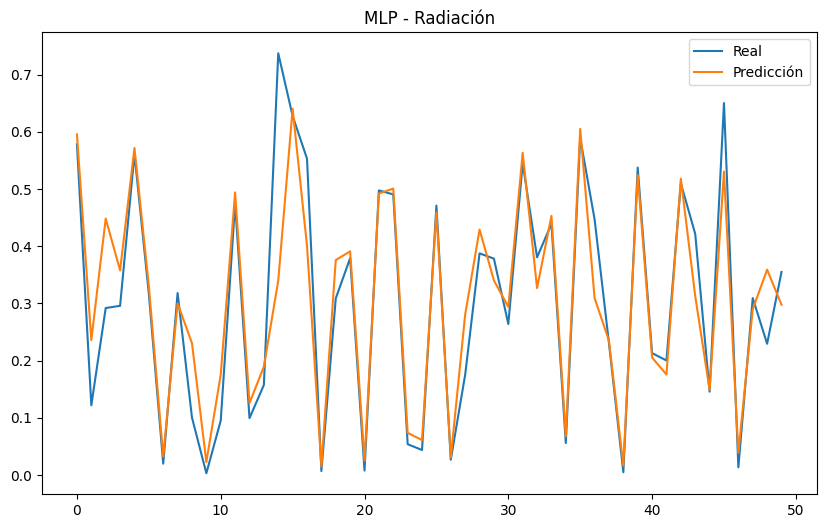

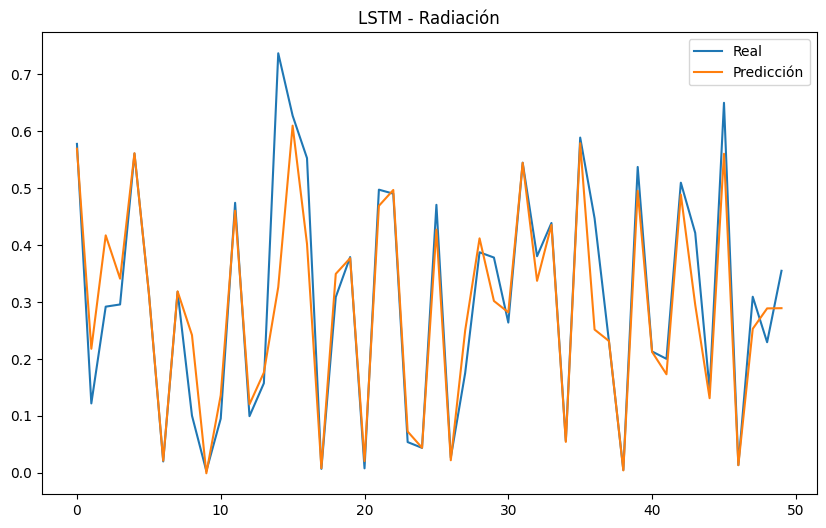

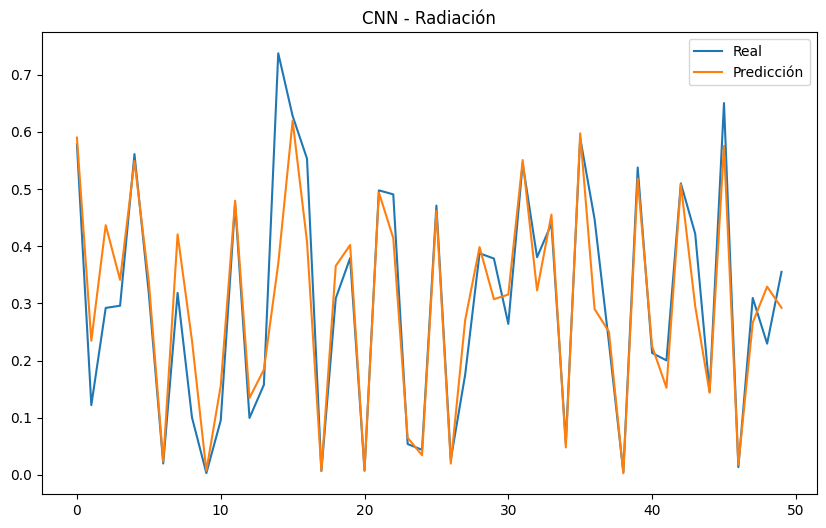

306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


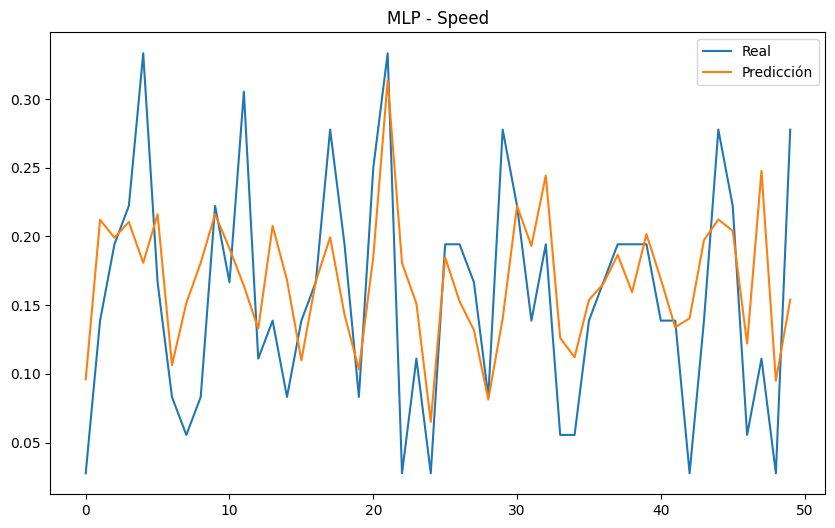

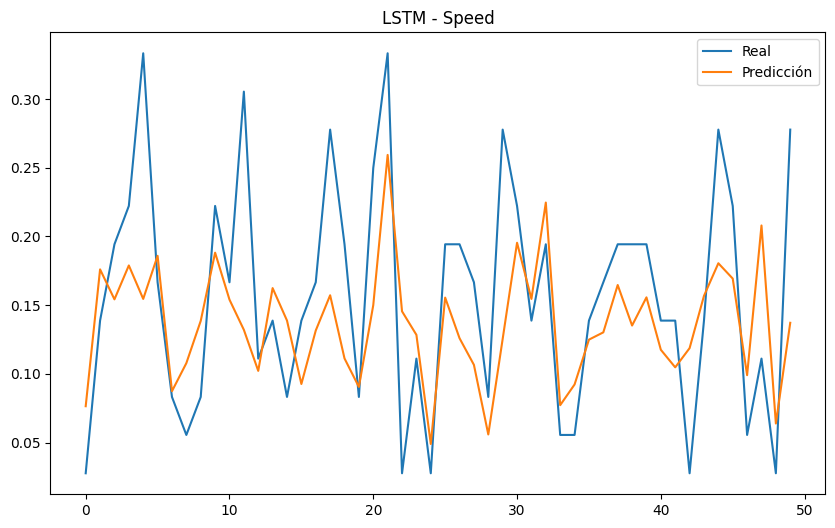

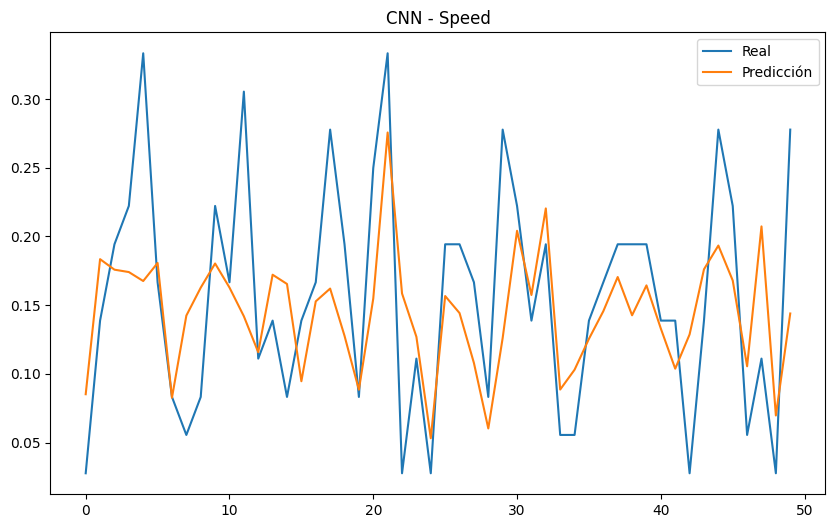

306/306 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


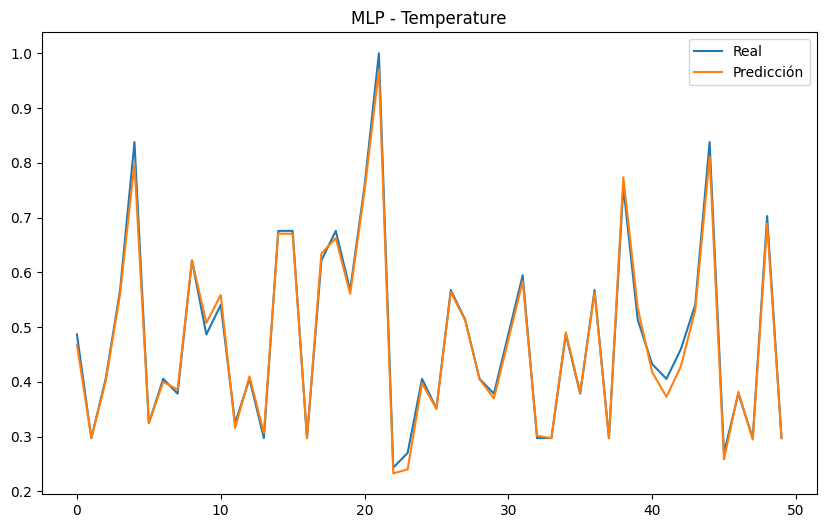

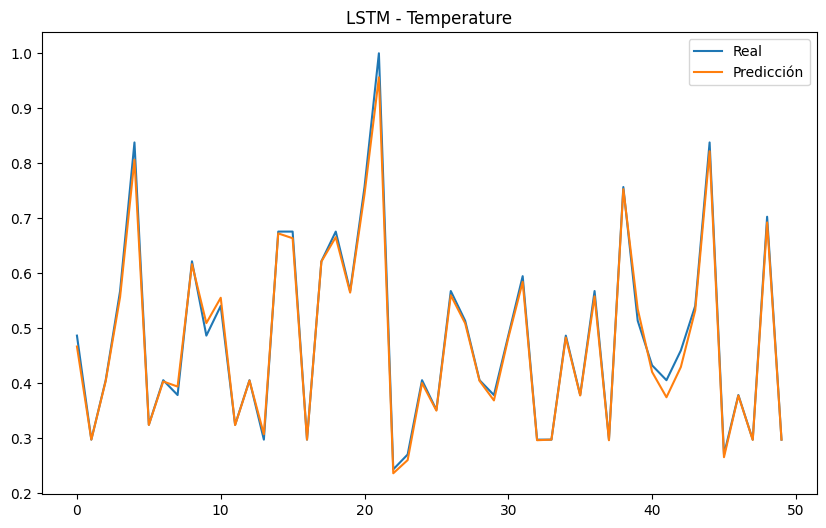

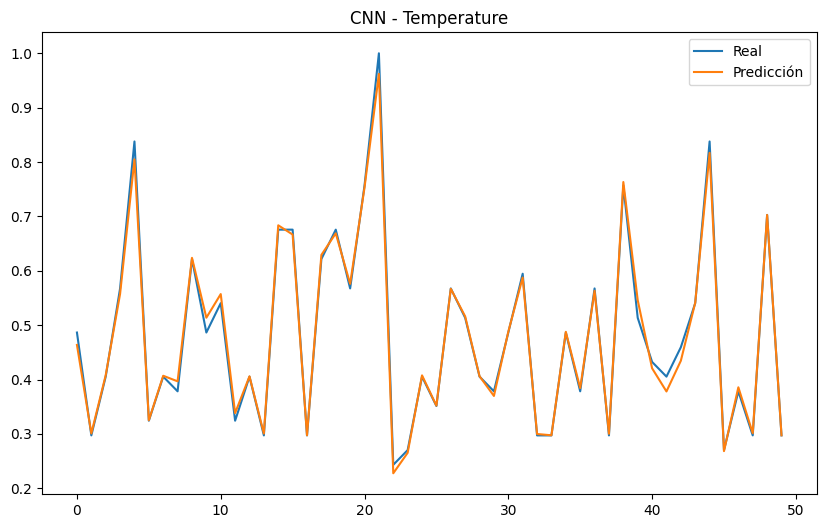

306/306 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


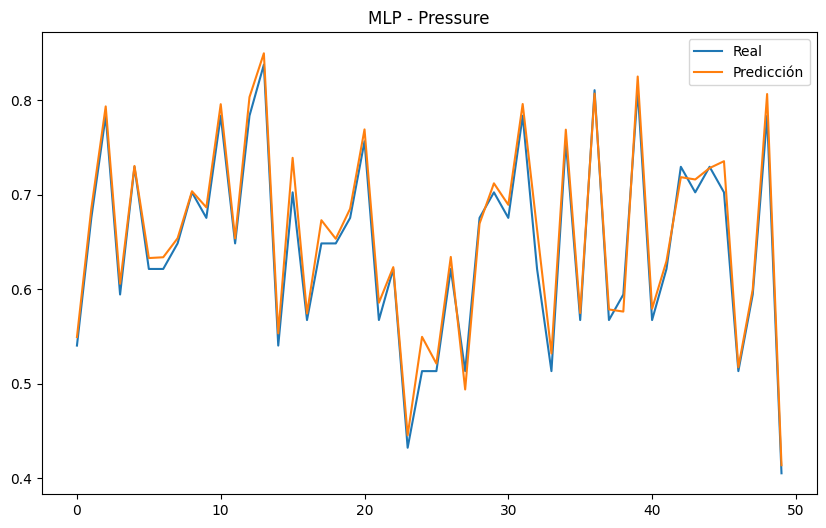

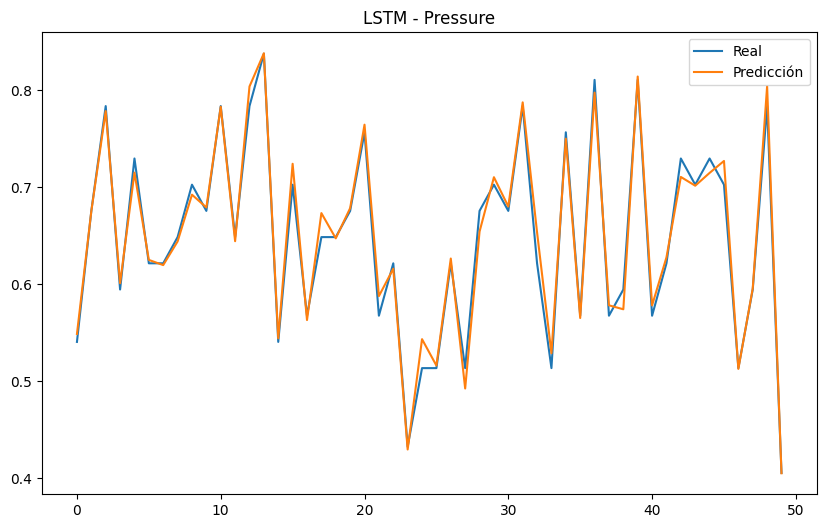

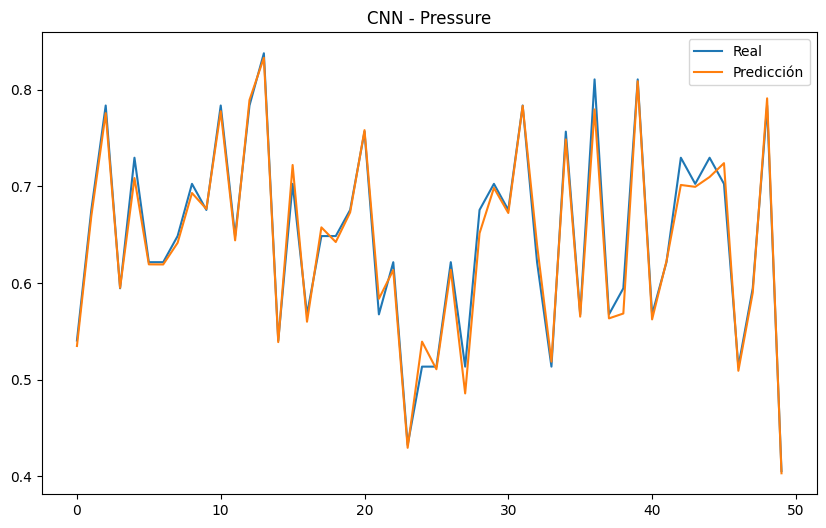

306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


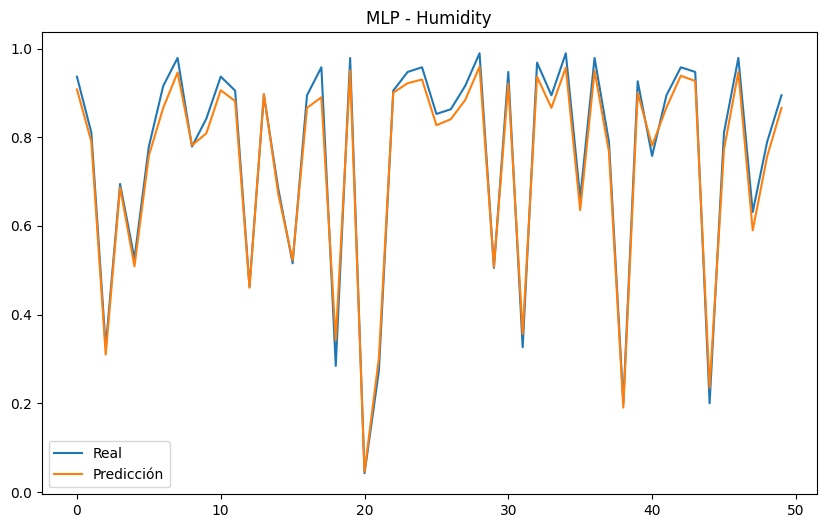

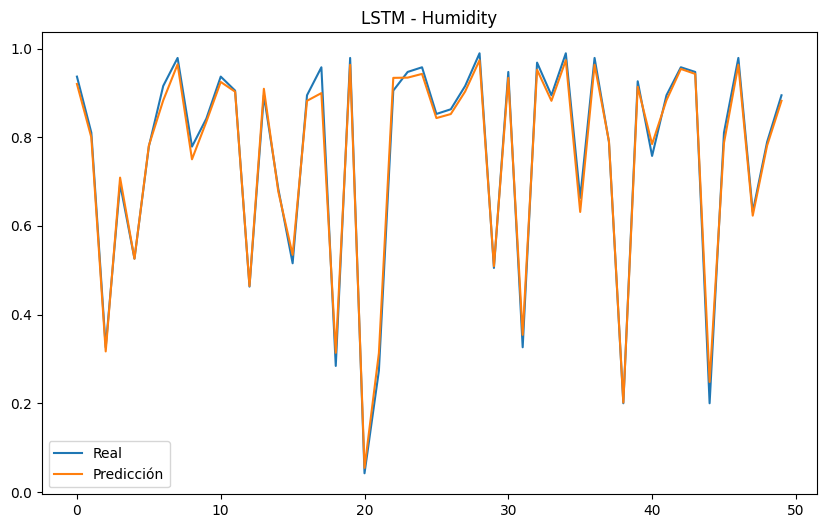

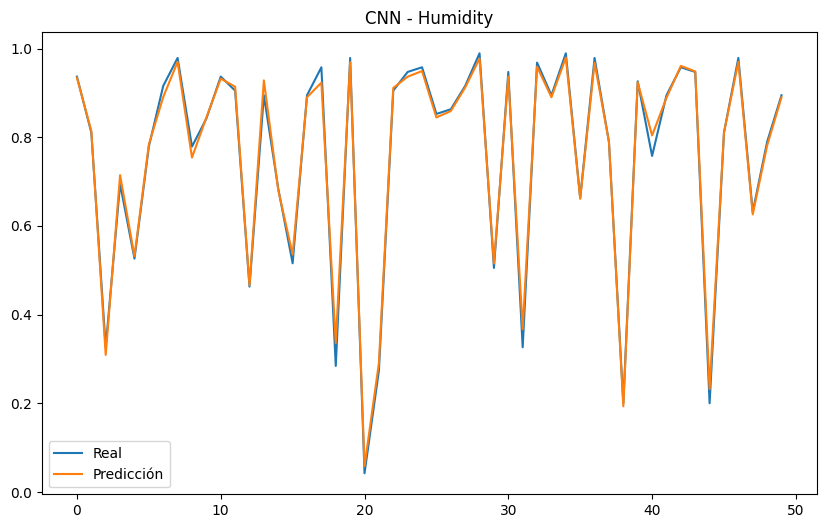

306/306 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
306/306 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


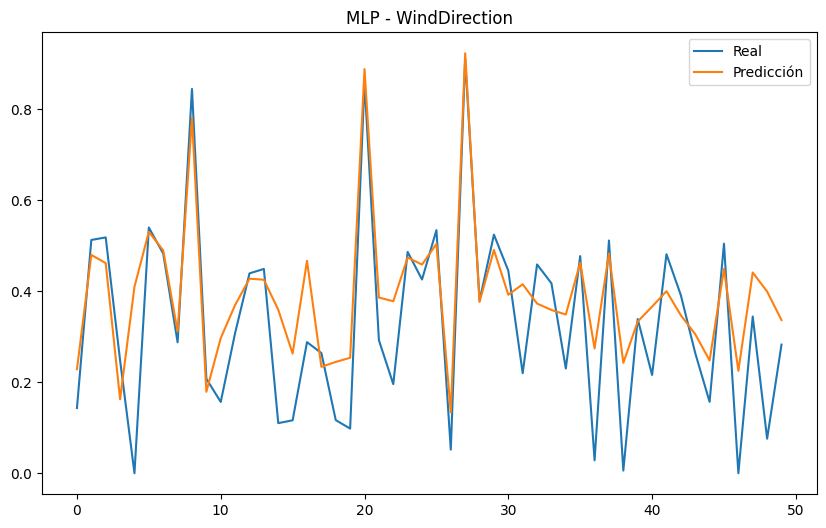

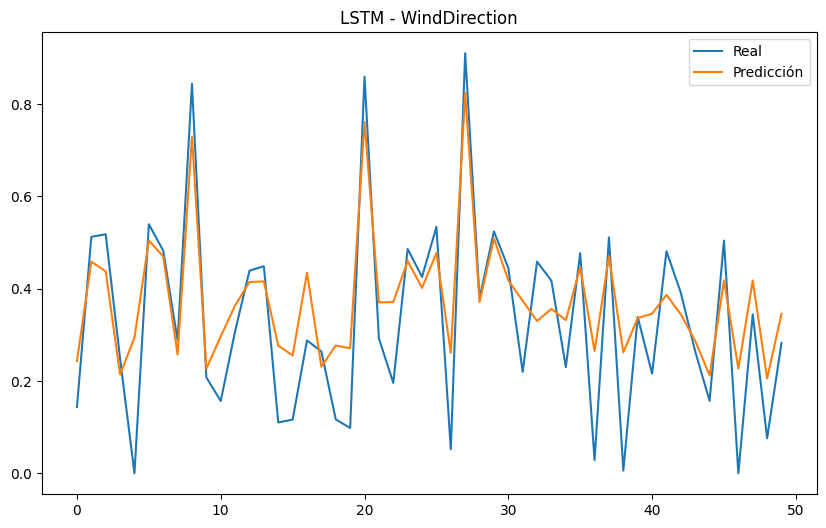

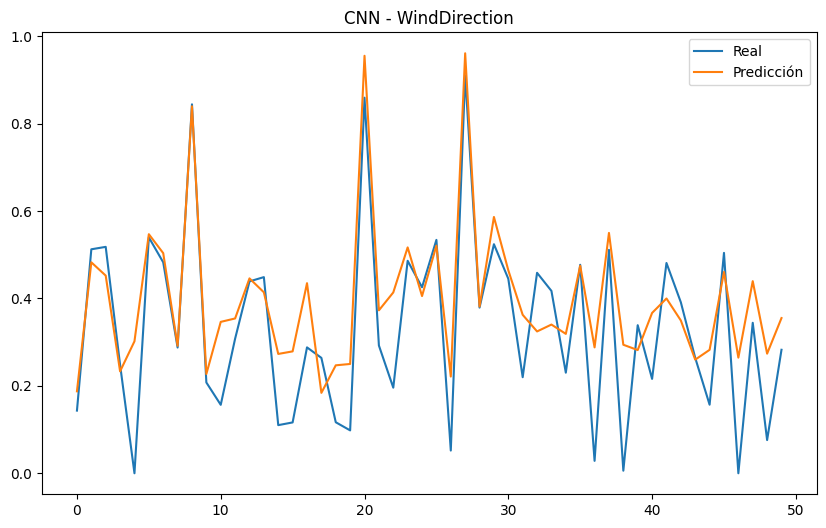

In [ ]:
num_p = 50

# Función para graficar predicciones
def plot_predictions(y_true, y_pred, title, num_points=num_p):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true.flatten()[:num_points], label='Real')
    plt.plot(y_pred.flatten()[:num_points], label='Predicción')
    plt.title(title)
    plt.legend()
    plt.show()

# Predicciones para Radiación
y_pred_mlp_rad = mlp_model_rad.predict(X_test_rad)
y_pred_lstm_rad = lstm_model_rad.predict(X_test_rad)
y_pred_cnn_rad = cnn_model_rad.predict(X_test_rad)

# Graficar predicciones para Radiación
plot_predictions(y_test_rad, y_pred_mlp_rad, 'MLP - Radiación', num_points=num_p)
plot_predictions(y_test_rad, y_pred_lstm_rad, 'LSTM - Radiación', num_points=num_p)
plot_predictions(y_test_rad, y_pred_cnn_rad, 'CNN - Radiación', num_points=num_p)

# Predicciones para Speed
y_pred_mlp_spd = mlp_model_spd.predict(X_test_spd)
y_pred_lstm_spd = lstm_model_spd.predict(X_test_spd)
y_pred_cnn_spd = cnn_model_spd.predict(X_test_spd)

# Graficar predicciones para Speed
plot_predictions(y_test_spd, y_pred_mlp_spd, 'MLP - Speed', num_points=num_p)
plot_predictions(y_test_spd, y_pred_lstm_spd, 'LSTM - Speed', num_points=num_p)
plot_predictions(y_test_spd, y_pred_cnn_spd, 'CNN - Speed', num_points=num_p)

# Predicciones para Temperature
y_pred_mlp_temp = mlp_model_temp.predict(X_test_temp)
y_pred_lstm_temp = lstm_model_temp.predict(X_test_temp)
y_pred_cnn_temp = cnn_model_temp.predict(X_test_temp)

# Graficar predicciones para Temperature
plot_predictions(y_test_temp, y_pred_mlp_temp, 'MLP - Temperature', num_points=num_p)
plot_predictions(y_test_temp, y_pred_lstm_temp, 'LSTM - Temperature', num_points=num_p)
plot_predictions(y_test_temp, y_pred_cnn_temp, 'CNN - Temperature', num_points=num_p)

# Predicciones para Pressure
y_pred_mlp_press = mlp_model_press.predict(X_test_press)
y_pred_lstm_press = lstm_model_press.predict(X_test_press)
y_pred_cnn_press = cnn_model_press.predict(X_test_press)

# Graficar predicciones para Pressure
plot_predictions(y_test_press, y_pred_mlp_press, 'MLP - Pressure', num_points=num_p)
plot_predictions(y_test_press, y_pred_lstm_press, 'LSTM - Pressure', num_points=num_p)
plot_predictions(y_test_press, y_pred_cnn_press, 'CNN - Pressure', num_points=num_p)

# Predicciones para Humidity
y_pred_mlp_hum = mlp_model_hum.predict(X_test_hum)
y_pred_lstm_hum = lstm_model_hum.predict(X_test_hum)
y_pred_cnn_hum = cnn_model_hum.predict(X_test_hum)

# Graficar predicciones para Humidity
plot_predictions(y_test_hum, y_pred_mlp_hum, 'MLP - Humidity', num_points=num_p)
plot_predictions(y_test_hum, y_pred_lstm_hum, 'LSTM - Humidity', num_points=num_p)
plot_predictions(y_test_hum, y_pred_cnn_hum, 'CNN - Humidity', num_points=num_p)

# Predicciones para WindDirection
y_pred_mlp_wind = mlp_model_wind.predict(X_test_wind)
y_pred_lstm_wind = lstm_model_wind.predict(X_test_wind)
y_pred_cnn_wind = cnn_model_wind.predict(X_test_wind)

# Graficar predicciones para WindDirection
plot_predictions(y_test_wind, y_pred_mlp_wind, 'MLP - WindDirection', num_points=num_p)
plot_predictions(y_test_wind, y_pred_lstm_wind, 'LSTM - WindDirection', num_points=num_p)
plot_predictions(y_test_wind, y_pred_cnn_wind, 'CNN - WindDirection', num_points=num_p)


In [ ]:
# Aplanar los arrays para que sean 2D o 1D

# Radiación
y_test_rad_flat = y_test_rad.flatten()
y_pred_mlp_rad_flat = y_pred_mlp_rad.flatten()
y_pred_lstm_rad_flat = y_pred_lstm_rad.flatten()
y_pred_cnn_rad_flat = y_pred_cnn_rad.flatten()

# Speed
y_test_spd_flat = y_test_spd.flatten()
y_pred_mlp_spd_flat = y_pred_mlp_spd.flatten()
y_pred_lstm_spd_flat = y_pred_lstm_spd.flatten()
y_pred_cnn_spd_flat = y_pred_cnn_spd.flatten()

# Temperature
y_test_temp_flat = y_test_temp.flatten()
y_pred_mlp_temp_flat = y_pred_mlp_temp.flatten()
y_pred_lstm_temp_flat = y_pred_lstm_temp.flatten()
y_pred_cnn_temp_flat = y_pred_cnn_temp.flatten()

# Pressure
y_test_press_flat = y_test_press.flatten()
y_pred_mlp_press_flat = y_pred_mlp_press.flatten()
y_pred_lstm_press_flat = y_pred_lstm_press.flatten()
y_pred_cnn_press_flat = y_pred_cnn_press.flatten()

# Humidity
y_test_hum_flat = y_test_hum.flatten()
y_pred_mlp_hum_flat = y_pred_mlp_hum.flatten()
y_pred_lstm_hum_flat = y_pred_lstm_hum.flatten()
y_pred_cnn_hum_flat = y_pred_cnn_hum.flatten()

# WindDirection
y_test_wind_flat = y_test_wind.flatten()
y_pred_mlp_wind_flat = y_pred_mlp_wind.flatten()
y_pred_lstm_wind_flat = y_pred_lstm_wind.flatten()
y_pred_cnn_wind_flat = y_pred_cnn_wind.flatten()


In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    # RMSE
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    # MAE
    mae = mean_absolute_error(y_true, y_pred)
    # R² Score
    r2 = r2_score(y_true, y_pred)

    return rmse, mae, r2

In [ ]:
# Métricas para Radiación
rmse_mlp_rad, mae_mlp_rad, r2_mlp_rad = calculate_metrics(y_test_rad_flat, y_pred_mlp_rad_flat)
rmse_lstm_rad, mae_lstm_rad, r2_lstm_rad = calculate_metrics(y_test_rad_flat, y_pred_lstm_rad_flat)
rmse_cnn_rad, mae_cnn_rad, r2_cnn_rad = calculate_metrics(y_test_rad_flat, y_pred_cnn_rad_flat)

# Métricas para Speed
rmse_mlp_spd, mae_mlp_spd, r2_mlp_spd = calculate_metrics(y_test_spd_flat, y_pred_mlp_spd_flat)
rmse_lstm_spd, mae_lstm_spd, r2_lstm_spd = calculate_metrics(y_test_spd_flat, y_pred_lstm_spd_flat)
rmse_cnn_spd, mae_cnn_spd, r2_cnn_spd = calculate_metrics(y_test_spd_flat, y_pred_cnn_spd_flat)

# Métricas para Temperatura
rmse_mlp_temp, mae_mlp_temp, r2_mlp_temp = calculate_metrics(y_test_temp_flat, y_pred_mlp_temp_flat)
rmse_lstm_temp, mae_lstm_temp, r2_lstm_temp = calculate_metrics(y_test_temp_flat, y_pred_lstm_temp_flat)
rmse_cnn_temp, mae_cnn_temp, r2_cnn_temp = calculate_metrics(y_test_temp_flat, y_pred_cnn_temp_flat)

# Métricas para Presión
rmse_mlp_pres, mae_mlp_pres, r2_mlp_pres = calculate_metrics(y_test_press_flat, y_pred_mlp_press_flat)
rmse_lstm_pres, mae_lstm_pres, r2_lstm_pres = calculate_metrics(y_test_press_flat, y_pred_lstm_press_flat)
rmse_cnn_pres, mae_cnn_pres, r2_cnn_pres = calculate_metrics(y_test_press_flat, y_pred_cnn_press_flat)

# Métricas para Humedad
rmse_mlp_hum, mae_mlp_hum, r2_mlp_hum = calculate_metrics(y_test_hum_flat, y_pred_mlp_hum_flat)
rmse_lstm_hum, mae_lstm_hum, r2_lstm_hum = calculate_metrics(y_test_hum_flat, y_pred_lstm_hum_flat)
rmse_cnn_hum, mae_cnn_hum, r2_cnn_hum = calculate_metrics(y_test_hum_flat, y_pred_cnn_hum_flat)

# Métricas para Dirección del Viento
rmse_mlp_wind, mae_mlp_wind, r2_mlp_wind = calculate_metrics(y_test_wind_flat, y_pred_mlp_wind_flat)
rmse_lstm_wind, mae_lstm_wind, r2_lstm_wind = calculate_metrics(y_test_wind_flat, y_pred_lstm_wind_flat)
rmse_cnn_wind, mae_cnn_wind, r2_cnn_wind = calculate_metrics(y_test_wind_flat, y_pred_cnn_wind_flat)


In [ ]:
# Crear un DataFrame con las métricas
metrics_data = {
    'Model': [
        'MLP - Radiation', 'LSTM - Radiation', 'CNN - Radiation',
        'MLP - Speed', 'LSTM - Speed', 'CNN - Speed',
        'MLP - Temperature', 'LSTM - Temperature', 'CNN - Temperature',
        'MLP - Pressure', 'LSTM - Pressure', 'CNN - Pressure',
        'MLP - Humidity', 'LSTM - Humidity', 'CNN - Humidity',
        'MLP - Wind Direction', 'LSTM - Wind Direction', 'CNN - Wind Direction'
    ],
    'RMSE': [
        rmse_mlp_rad, rmse_lstm_rad, rmse_cnn_rad,
        rmse_mlp_spd, rmse_lstm_spd, rmse_cnn_spd,
        rmse_mlp_temp, rmse_lstm_temp, rmse_cnn_temp,
        rmse_mlp_pres, rmse_lstm_pres, rmse_cnn_pres,
        rmse_mlp_hum, rmse_lstm_hum, rmse_cnn_hum,
        rmse_mlp_wind, rmse_lstm_wind, rmse_cnn_wind
    ],
    'MAE': [
        mae_mlp_rad, mae_lstm_rad, mae_cnn_rad,
        mae_mlp_spd, mae_lstm_spd, mae_cnn_spd,
        mae_mlp_temp, mae_lstm_temp, mae_cnn_temp,
        mae_mlp_pres, mae_lstm_pres, mae_cnn_pres,
        mae_mlp_hum, mae_lstm_hum, mae_cnn_hum,
        mae_mlp_wind, mae_lstm_wind, mae_cnn_wind
    ],
    'R²': [
        r2_mlp_rad, r2_lstm_rad, r2_cnn_rad,
        r2_mlp_spd, r2_lstm_spd, r2_cnn_spd,
        r2_mlp_temp, r2_lstm_temp, r2_cnn_temp,
        r2_mlp_pres, r2_lstm_pres, r2_cnn_pres,
        r2_mlp_hum, r2_lstm_hum, r2_cnn_hum,
        r2_mlp_wind, r2_lstm_wind, r2_cnn_wind
    ]
}

df_metrics = pd.DataFrame(metrics_data)

# Mostrar el DataFrame con formato
df_metrics.style.set_caption("Metrics for MLP, LSTM, and CNN Models").format({"RMSE": "{:.4f}", "MAE": "{:.4f}", "R²": "{:.4f}"})


,Model,RMSE,MAE,R²
0,MLP - Radiation,0.0723,0.0399,0.8816
1,LSTM - Radiation,0.0724,0.0382,0.8813
2,CNN - Radiation,0.0721,0.0392,0.8823
3,MLP - Speed,0.0670,0.0525,0.3943
4,LSTM - Speed,0.0635,0.0485,0.4559
5,CNN - Speed,0.0631,0.0486,0.4626
6,MLP - Temperature,0.0170,0.0107,0.9898
7,LSTM - Temperature,0.0161,0.0098,0.9908
8,CNN - Temperature,0.0156,0.0093,0.9914
9,MLP - Pressure,0.0137,0.0111,0.9914


In [ ]:
# Crear excel para metricas que van en documento

# Guardar el DataFrame en un archivo Excel
excel_file_path = 'metrics_models.xlsx'
df_metrics.to_excel(excel_file_path, index=False)


# **Optimización Fase 3**

In [27]:
import numpy as np
from scipy.optimize import linprog

# Coeficientes de eficiencia relativos para la función objetivo (ajustar según el impacto de cada sistema)
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Predicciones de los modelos LSTM para variables climáticas (valores simulados; deben provenir del modelo LSTM)
predicted_radiation = np.array([800, 820, 790])  # Radiación solar en W/m²
predicted_temperature = np.array([25, 26, 27])   # Temperatura en °C
predicted_humidity = np.array([60, 58, 59])      # Humedad en %

predicted_wind_speed = np.array([15, 14, 16])    # Velocidad del viento en m/s
predicted_wind_direction = np.array([180, 190, 170])  # Dirección en grados
predicted_pressure = np.array([1010, 1008, 1012])     # Presión en hPa

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    # Ejemplo de modelo de eficiencia solar (ajustar según datos específicos)
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    # Ejemplo de modelo de eficiencia eólica (ajustar según datos específicos)
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Generación de energía en función de las variables climáticas para cada intervalo
P_solar = [solar_production(r, t, h) for r, t, h in zip(predicted_radiation, predicted_temperature, predicted_humidity)]
P_wind = [wind_production(s, d, p) for s, d, p in zip(predicted_wind_speed, predicted_wind_direction, predicted_pressure)]

# Maximizar: P_total = alpha * P_solar + beta * P_wind
# Calculamos la producción total y la función objetivo para optimizar
P_total = [alpha * ps + beta * pw for ps, pw in zip(P_solar, P_wind)]

# Restricciones de capacidad y demanda (ajustar según limitaciones del sistema)
demand = 250  # Demanda energética en kW (puede variar por intervalo)
wind_max_capacity = 200
solar_max_capacity = 180

# Matriz y vector de restricciones
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Resolver el problema de optimización para cada intervalo
for interval, (ps, pw, pt) in enumerate(zip(P_solar, P_wind, P_total)):
    print(f"\nIntervalo {interval + 1}:")
    c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza

    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        print(f"   Energía óptima eólica: {P_wind_opt:.2f} kW")
        print(f"   Energía óptima solar: {P_solar_opt:.2f} kW")
        print(f"   Energía total producida: {P_wind_opt + P_solar_opt:.2f} kW")
    else:
        print("   La optimización no encontró una solución para este intervalo.")



Intervalo 1:
   Energía óptima eólica: 70.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 250.00 kW

Intervalo 2:
   Energía óptima eólica: 70.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 250.00 kW

Intervalo 3:
   Energía óptima eólica: 70.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 250.00 kW



Intervalo 1:
   Energía óptima eólica: 120.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 300.00 kW


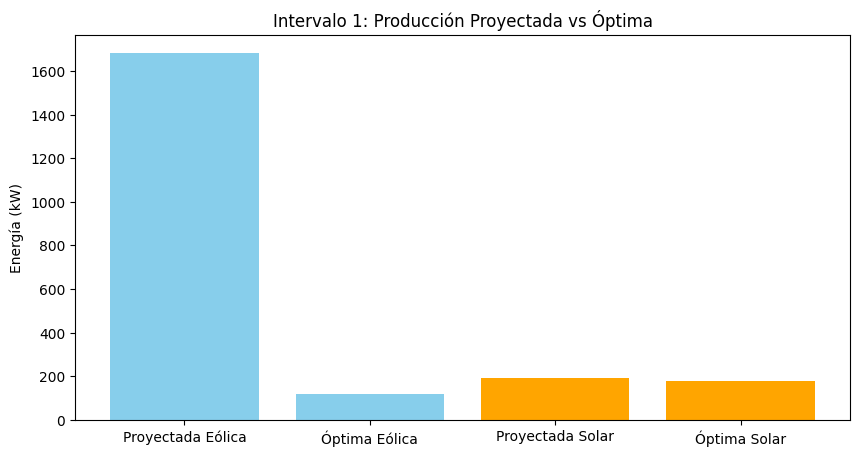


Intervalo 2:
   Energía óptima eólica: 120.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 300.00 kW


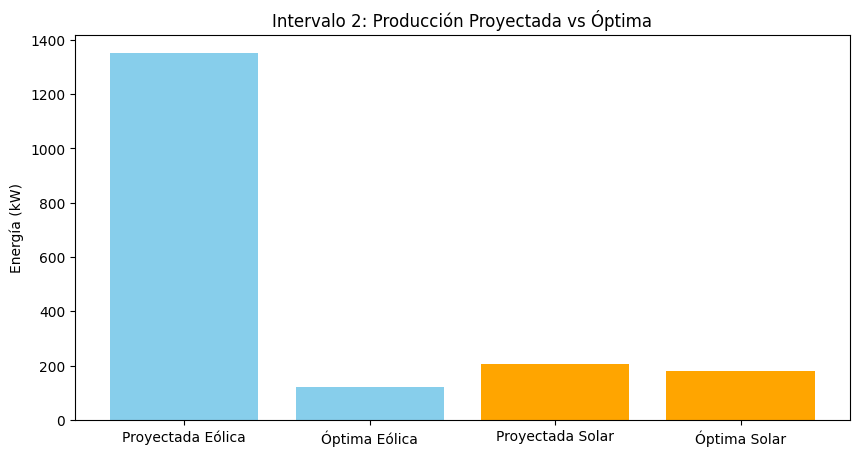


Intervalo 3:
   Energía óptima eólica: 120.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 300.00 kW


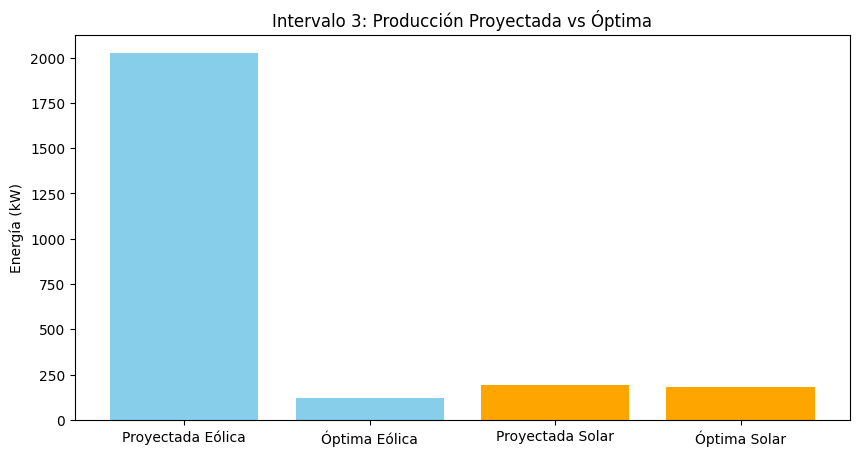

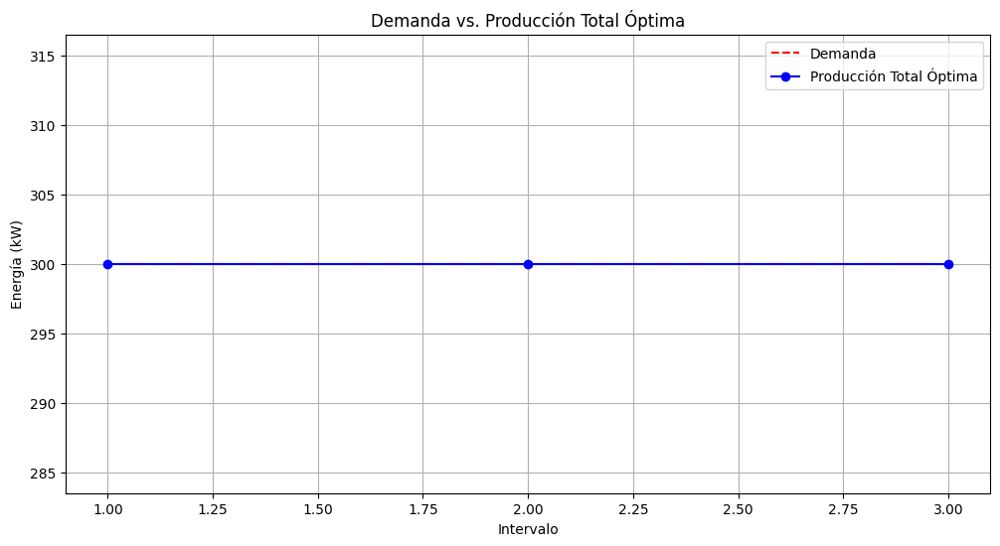

In [28]:
import numpy as np
from scipy.optimize import linprog
import matplotlib.pyplot as plt

# Coeficientes de eficiencia relativos para la función objetivo
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Predicciones de los modelos LSTM para variables climáticas
predicted_radiation = np.array([800, 820, 790])  # Radiación solar en W/m²
predicted_temperature = np.array([25, 26, 27])   # Temperatura en °C
predicted_humidity = np.array([60, 58, 59])      # Humedad en %

predicted_wind_speed = np.array([15, 14, 16])    # Velocidad del viento en m/s
predicted_wind_direction = np.array([180, 190, 170])  # Dirección en grados
predicted_pressure = np.array([1010, 1008, 1012])     # Presión en hPa

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Generación de energía en función de las variables climáticas para cada intervalo
P_solar = [solar_production(r, t, h) for r, t, h in zip(predicted_radiation, predicted_temperature, predicted_humidity)]
P_wind = [wind_production(s, d, p) for s, d, p in zip(predicted_wind_speed, predicted_wind_direction, predicted_pressure)]
P_total = [alpha * ps + beta * pw for ps, pw in zip(P_solar, P_wind)]

# Restricciones de capacidad y demanda
demand = 300  # Demanda energética en kW
wind_max_capacity = 200
solar_max_capacity = 180
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Listas para almacenar resultados de optimización
opt_wind = []
opt_solar = []
opt_total = []

# Resolver el problema de optimización para cada intervalo
for interval, (ps, pw, pt) in enumerate(zip(P_solar, P_wind, P_total)):
    print(f"\nIntervalo {interval + 1}:")
    c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza

    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        P_total_opt = P_wind_opt + P_solar_opt
        opt_wind.append(P_wind_opt)
        opt_solar.append(P_solar_opt)
        opt_total.append(P_total_opt)

        print(f"   Energía óptima eólica: {P_wind_opt:.2f} kW")
        print(f"   Energía óptima solar: {P_solar_opt:.2f} kW")
        print(f"   Energía total producida: {P_total_opt:.2f} kW")

        # Gráfico de producción proyectada vs. producción óptima
        plt.figure(figsize=(10, 5))
        plt.bar(['Proyectada Eólica', 'Óptima Eólica'], [pw, P_wind_opt], color='skyblue')
        plt.bar(['Proyectada Solar', 'Óptima Solar'], [ps, P_solar_opt], color='orange')
        plt.title(f'Intervalo {interval + 1}: Producción Proyectada vs Óptima')
        plt.ylabel('Energía (kW)')
        plt.show()
    else:
        print("   La optimización no encontró una solución para este intervalo.")
        opt_wind.append(0)
        opt_solar.append(0)
        opt_total.append(0)

# Gráfico final de la demanda vs. producción total optimizada
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(P_total) + 1), [demand] * len(P_total), label='Demanda', linestyle='--', color='red')
plt.plot(range(1, len(P_total) + 1), opt_total, label='Producción Total Óptima', marker='o', color='blue')
plt.xlabel('Intervalo')
plt.ylabel('Energía (kW)')
plt.title('Demanda vs. Producción Total Óptima')
plt.legend()
plt.grid(True)
plt.show()


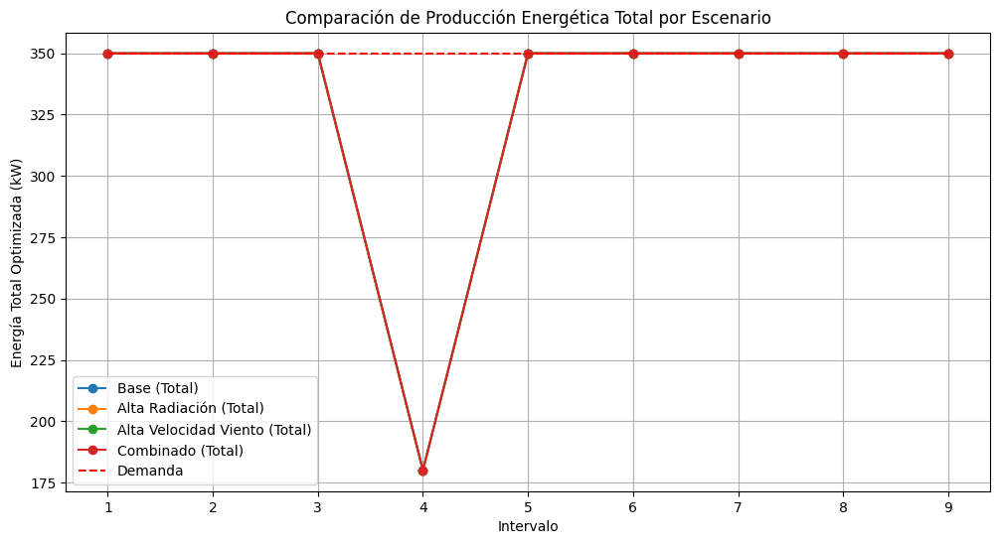

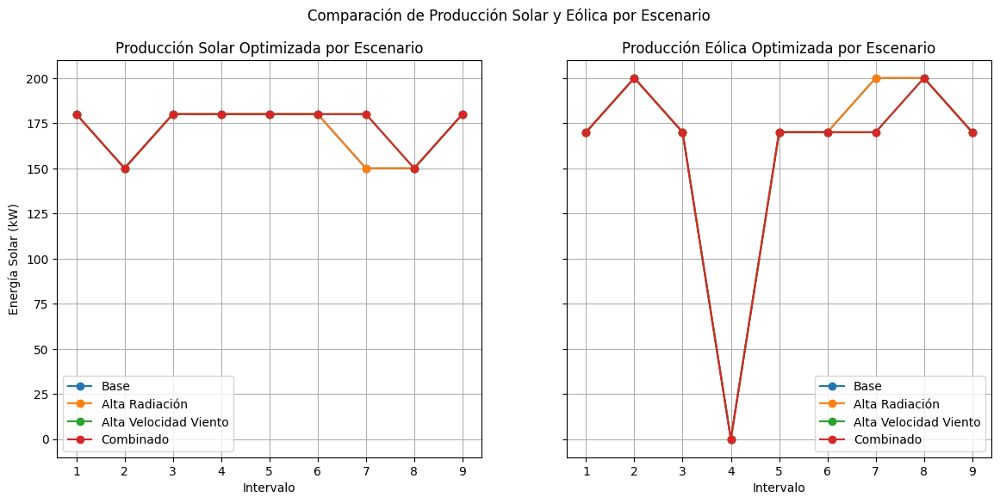


Intervalo 1:
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW

Intervalo 2:
   Energía óptima eólica: 200.00 kW
   Energía óptima solar: 150.00 kW
   Energía total producida: 350.00 kW

Intervalo 3:
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW

Intervalo 4:
   Energía óptima eólica: 0.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 180.00 kW

Intervalo 5:
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW

Intervalo 6:
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW

Intervalo 7:
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW

Intervalo 8:
   Energía óptima eólica: 200.00 kW
   Energía óptima solar: 150.00 kW
   Energía total producida: 350.00 kW

Intervalo 9:
   E

In [29]:
import numpy as np
from scipy.optimize import linprog
import matplotlib.pyplot as plt

# Coeficientes de eficiencia relativos para la función objetivo
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Predicciones de los modelos LSTM para variables climáticas (escenario difícil)
predicted_radiation = np.array([950, 1100, 200, 50, 300, 900, 1500, 600, 100])  # Radiación solar en W/m² (valores extremos)
predicted_temperature = np.array([35, -5, 50, 10, 0, 30, 27, 40, 22])        # Temperatura en °C (valores extremos)
predicted_humidity = np.array([10, 95, 30, 100, 15, 80, 20, 70, 90])        # Humedad en % (valores extremos)

predicted_wind_speed = np.array([25, 3, 20, 1, 30, 10, 15, 5, 12])         # Velocidad del viento en m/s (valores extremos)
predicted_wind_direction = np.array([360, 45, 180, 270, 90, 135, 225, 315, 60])  # Dirección en grados (cambio brusco)
predicted_pressure = np.array([1020, 980, 1040, 1000, 970, 1050, 1030, 990, 1015])  # Presión en hPa (valores extremos)

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Escenarios de simulación: base, alta radiación, alta velocidad de viento, combinado
scenarios = {
    "Base": (predicted_radiation, predicted_wind_speed),
    "Alta Radiación": (predicted_radiation * 1.2, predicted_wind_speed),
    "Alta Velocidad Viento": (predicted_radiation, predicted_wind_speed * 1.2),
    "Combinado": (predicted_radiation * 1.2, predicted_wind_speed * 1.2)
}

# Restricciones de capacidad y demanda
demand = 350  # Demanda energética en kW
wind_max_capacity = 200
solar_max_capacity = 180
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Resultados de optimización para cada escenario
results = {}

# Simulación de escenarios
for scenario_name, (radiation, wind_speed) in scenarios.items():
    # Generación de energía para cada intervalo en el escenario actual
    P_solar = [solar_production(r, t, h) for r, t, h in zip(radiation, predicted_temperature, predicted_humidity)]
    P_wind = [wind_production(s, d, p) for s, d, p in zip(wind_speed, predicted_wind_direction, predicted_pressure)]
    P_total = [alpha * ps + beta * pw for ps, pw in zip(P_solar, P_wind)]

    # Almacenamiento de resultados del escenario
    opt_wind = []
    opt_solar = []
    opt_total = []

    # Optimización por intervalo
    for ps, pw, pt in zip(P_solar, P_wind, P_total):
        c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza
        result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
        if result.success:
            P_wind_opt = result.x[0]
            P_solar_opt = result.x[1]
            opt_wind.append(P_wind_opt)
            opt_solar.append(P_solar_opt)
            opt_total.append(P_wind_opt + P_solar_opt)
        else:
            opt_wind.append(0)
            opt_solar.append(0)
            opt_total.append(0)

    results[scenario_name] = {"wind": opt_wind, "solar": opt_solar, "total": opt_total}

# Gráfico comparativo de producción por escenario
intervals = range(1, len(predicted_radiation) + 1)

plt.figure(figsize=(12, 6))

for scenario_name, scenario_data in results.items():
    plt.plot(intervals, scenario_data["total"], marker='o', label=f'{scenario_name} (Total)')

plt.plot(intervals, [demand] * len(intervals), 'r--', label='Demanda')
plt.xlabel('Intervalo')
plt.ylabel('Energía Total Optimizada (kW)')
plt.title('Comparación de Producción Energética Total por Escenario')
plt.legend()
plt.grid(True)
plt.show()

# Gráfico de producción solar y eólica por escenario
fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

for scenario_name, scenario_data in results.items():
    axs[0].plot(intervals, scenario_data["solar"], marker='o', label=f'{scenario_name}')
    axs[1].plot(intervals, scenario_data["wind"], marker='o', label=f'{scenario_name}')

axs[0].set_title('Producción Solar Optimizada por Escenario')
axs[0].set_xlabel('Intervalo')
axs[0].set_ylabel('Energía Solar (kW)')
axs[0].legend()
axs[0].grid(True)

axs[1].set_title('Producción Eólica Optimizada por Escenario')
axs[1].set_xlabel('Intervalo')
axs[1].legend()
axs[1].grid(True)

plt.suptitle('Comparación de Producción Solar y Eólica por Escenario')
plt.show()

# Resolver el problema de optimización para cada intervalo
for interval, (ps, pw, pt) in enumerate(zip(P_solar, P_wind, P_total)):
    print(f"\nIntervalo {interval + 1}:")
    c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza

    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        print(f"   Energía óptima eólica: {P_wind_opt:.2f} kW")
        print(f"   Energía óptima solar: {P_solar_opt:.2f} kW")
        print(f"   Energía total producida: {P_wind_opt + P_solar_opt:.2f} kW")
    else:
        print("   La optimización no encontró una solución para este intervalo.")


# **Diseño de Experimentos**

In [30]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Definir los valores de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Mostrar el diseño completo
print("Diseño completo de experimentos:")
print(design_df)


Diseño completo de experimentos:
    Radiación solar Temperatura Humedad Velocidad del viento  \
0              Baja        Baja    Baja                 Baja   
1              Baja        Baja    Baja                 Baja   
2              Baja        Baja    Baja                 Baja   
3              Baja        Baja    Baja                 Baja   
4              Baja        Baja    Baja                 Baja   
..              ...         ...     ...                  ...   
724            Alta        Alta    Alta                 Alta   
725            Alta        Alta    Alta                 Alta   
726            Alta        Alta    Alta                 Alta   
727            Alta        Alta    Alta                 Alta   
728            Alta        Alta    Alta                 Alta   

    Dirección del viento Presión  
0                   Baja    Baja  
1                   Baja   Media  
2                   Baja    Alta  
3                  Media    Baja  
4                  Medi

In [31]:
# Selección aleatoria de una fracción del diseño completo (por ejemplo, 50% de los experimentos)
frac_design_df = design_df.sample(frac=0.25, random_state=42).reset_index(drop=True)

# Mostrar el diseño fraccional seleccionado
print("\nDiseño fraccional de experimentos (50% de los experimentos):")
print(frac_design_df)



Diseño fraccional de experimentos (50% de los experimentos):
    Radiación solar Temperatura Humedad Velocidad del viento  \
0             Media        Alta    Alta                Media   
1              Baja       Media    Alta                Media   
2             Media        Baja    Alta                 Baja   
3             Media       Media   Media                 Baja   
4              Alta        Baja   Media                 Baja   
..              ...         ...     ...                  ...   
177            Baja       Media    Baja                 Baja   
178            Baja        Baja   Media                 Alta   
179           Media       Media    Alta                 Alta   
180            Alta       Media    Baja                Media   
181            Alta        Baja    Baja                Media   

    Dirección del viento Presión  
0                   Baja    Baja  
1                  Media   Media  
2                  Media    Alta  
3                  Media   Me

In [32]:
import numpy as np
import itertools
import pandas as pd
import matplotlib.pyplot as plt

# Definir los valores de entrada para las simulaciones
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Definir los niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Crear un diseño fraccional 1/4 (tomar el 25% de los experimentos)
frac_design = design_df.sample(frac=1, random_state=42).reset_index(drop=True)

In [33]:
# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Definir las matrices para guardar los resultados
results = []

# Realizar los experimentos basados en el diseño fraccional
for index, row in frac_design.iterrows():
    # Extraer los valores del diseño fraccional
    radiation_level = row['Radiación solar']
    temperature_level = row['Temperatura']
    humidity_level = row['Humedad']
    wind_speed_level = row['Velocidad del viento']
    wind_direction_level = row['Dirección del viento']
    pressure_level = row['Presión']

    # Mapear los niveles a valores numéricos (ajustar estos valores según tus necesidades)
    radiation = {'Baja': 100, 'Media': 600, 'Alta': 1000}[radiation_level]
    temperature = {'Baja': 10, 'Media': 25, 'Alta': 35}[temperature_level]
    humidity = {'Baja': 40, 'Media': 60, 'Alta': 80}[humidity_level]
    wind_speed = {'Baja': 2, 'Media': 5, 'Alta': 10}[wind_speed_level]
    wind_direction = {'Baja': 30, 'Media': 90, 'Alta': 210}[wind_direction_level]
    pressure = {'Baja': 950, 'Media': 1010, 'Alta': 1025}[pressure_level]

    # Generar la producción solar y eólica con los valores correspondientes
    P_solar = solar_production(radiation, temperature, humidity)
    P_wind = wind_production(wind_speed, wind_direction, pressure)

    # Calcular la producción total
    P_total = alpha * P_solar + beta * P_wind

    # Resuelve la optimización para este conjunto de condiciones
    A = [[1, 0], [0, 1], [1, 1]]  # Restricciones de capacidad
    b = [500, 400, 900]  # Demanda y capacidades máximas

    c = -np.array([alpha * P_solar, beta * P_wind])  # Negativo porque linprog minimiza
    from scipy.optimize import linprog
    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))

    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        results.append([index + 1, radiation_level, temperature_level, humidity_level,
                        wind_speed_level, wind_direction_level, pressure_level,
                        P_wind_opt, P_solar_opt, P_wind_opt + P_solar_opt])
    else:
        results.append([index + 1, radiation_level, temperature_level, humidity_level,
                        wind_speed_level, wind_direction_level, pressure_level,
                        np.nan, np.nan, np.nan])

# Crear un DataFrame con los resultados
columns = ['Experimento', 'Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento',
           'Dirección del viento', 'Presión', 'Energía óptima eólica (kW)', 'Energía óptima solar (kW)',
           'Energía total (kW)']

results_df = pd.DataFrame(results, columns=columns)



In [34]:
# Mostrar la tabla de resultados
print(results_df)

     Experimento Radiación solar Temperatura Humedad Velocidad del viento  \
0              1           Media        Alta    Alta                Media   
1              2            Baja       Media    Alta                Media   
2              3           Media        Baja    Alta                 Baja   
3              4           Media       Media   Media                 Baja   
4              5            Alta        Baja   Media                 Baja   
..           ...             ...         ...     ...                  ...   
724          725            Baja        Baja    Alta                Media   
725          726            Baja       Media    Baja                 Alta   
726          727           Media        Baja   Media                 Baja   
727          728           Media        Alta   Media                 Baja   
728          729            Baja       Media    Baja                 Alta   

    Dirección del viento Presión  Energía óptima eólica (kW)  \
0          

Cantidad de experimentos donde la optimización cumple: 729
Cantidad de experimentos donde la optimización no cumple: 0


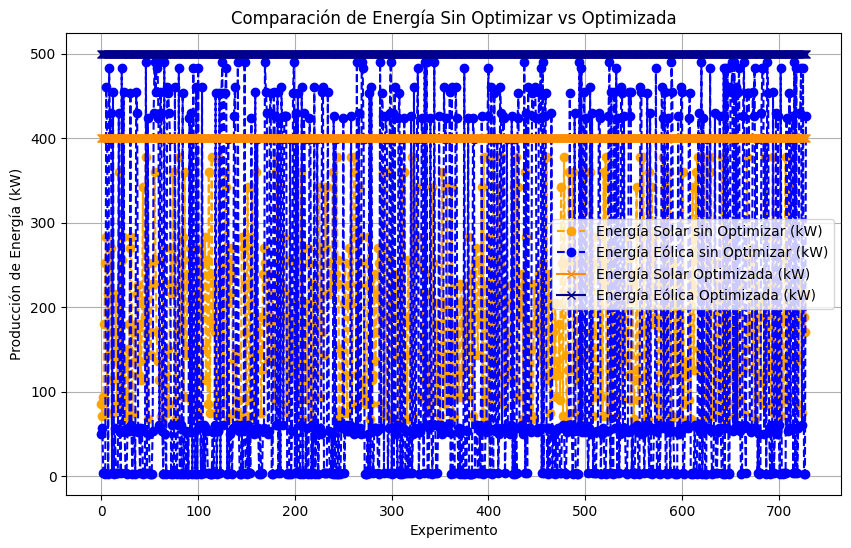

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Contar cuántos experimentos cumplen la optimización y cuántos no
experimentos_cumplen = results_df[['Energía óptima eólica (kW)', 'Energía óptima solar (kW)']].notna().all(axis=1).sum()
experimentos_no_cumplen = results_df[['Energía óptima eólica (kW)', 'Energía óptima solar (kW)']].isna().any(axis=1).sum()

print(f"Cantidad de experimentos donde la optimización cumple: {experimentos_cumplen}")
print(f"Cantidad de experimentos donde la optimización no cumple: {experimentos_no_cumplen}")

# Graficar valores sin optimizar y optimizados
fig, ax = plt.subplots(figsize=(10, 6))

# Extraer los valores sin optimizar de P_solar y P_wind
P_solar_original = [solar_production(
    {'Baja': 600, 'Media': 750, 'Alta': 1000}[row['Radiación solar']],
    {'Baja': 15, 'Media': 25, 'Alta': 35}[row['Temperatura']],
    {'Baja': 40, 'Media': 60, 'Alta': 80}[row['Humedad']]
) for _, row in frac_design.iterrows()]

P_wind_original = [wind_production(
    {'Baja': 2, 'Media': 5, 'Alta': 10}[row['Velocidad del viento']],
    {'Baja': 30, 'Media': 90, 'Alta': 210}[row['Dirección del viento']],
    {'Baja': 950, 'Media': 1010, 'Alta': 1025}[row['Presión']]
) for _, row in frac_design.iterrows()]

# Valores sin optimizar
ax.plot(P_solar_original, label='Energía Solar sin Optimizar (kW)', linestyle='--', marker='o', color='orange')
ax.plot(P_wind_original, label='Energía Eólica sin Optimizar (kW)', linestyle='--', marker='o', color='blue')

# Valores optimizados
ax.plot(results_df['Energía óptima solar (kW)'], label='Energía Solar Optimizada (kW)', marker='x', color='darkorange')
ax.plot(results_df['Energía óptima eólica (kW)'], label='Energía Eólica Optimizada (kW)', marker='x', color='darkblue')

# Configurar el gráfico
ax.set_xlabel('Experimento')
ax.set_ylabel('Producción de Energía (kW)')
ax.set_title('Comparación de Energía Sin Optimizar vs Optimizada')
ax.legend()
ax.grid(True)

plt.show()


Cantidad de experimentos donde la optimización cumple la demanda: 18
Cantidad de experimentos donde la optimización no cumple la demanda: 711


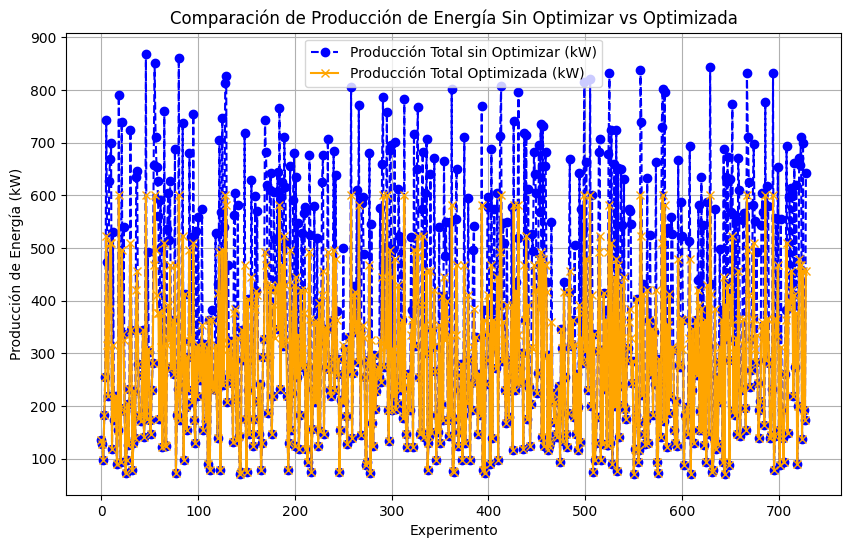

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Parámetros de la demanda de carga
demanda_carga = 600  # Demanda total en kW

# Simulación de producción sin optimizar (basado en las condiciones ambientales)
P_solar_original = [solar_production(
    {'Baja': 600, 'Media': 750, 'Alta': 1000}[row['Radiación solar']],
    {'Baja': 15, 'Media': 25, 'Alta': 35}[row['Temperatura']],
    {'Baja': 40, 'Media': 60, 'Alta': 80}[row['Humedad']]
) for _, row in frac_design.iterrows()]

P_wind_original = [wind_production(
    {'Baja': 2, 'Media': 5, 'Alta': 10}[row['Velocidad del viento']],
    {'Baja': 30, 'Media': 90, 'Alta': 210}[row['Dirección del viento']],
    {'Baja': 950, 'Media': 1010, 'Alta': 1025}[row['Presión']]
) for _, row in frac_design.iterrows()]

# Calcular la producción total sin optimizar para cada experimento
produccion_total_sin_optimizar = np.array(P_solar_original) + np.array(P_wind_original)

# Supongamos que la optimización maximiza la producción acercándola a la demanda
# Aquí podríamos simular que, en cada experimento, el sistema optimiza la producción para cubrir la demanda lo mejor posible
# Esto puede hacerse ajustando dinámicamente la producción solar y eólica (esto sería una simplificación de la optimización)

# Simulación de producción optimizada
P_solar_optimizada = np.minimum(P_solar_original, demanda_carga * 0.6)  # Se limita a 60% de la demanda como ejemplo
P_wind_optimizada = np.minimum(P_wind_original, demanda_carga * 0.4)   # Se limita a 40% de la demanda como ejemplo

# Calcular la producción total optimizada para cada experimento
produccion_total_optimizada = np.array(P_solar_optimizada) + np.array(P_wind_optimizada)

# Evaluar cuántos experimentos cumplen con la demanda
experimentos_cumplen = (produccion_total_optimizada >= demanda_carga).sum()
experimentos_no_cumplen = (produccion_total_optimizada < demanda_carga).sum()

print(f"Cantidad de experimentos donde la optimización cumple la demanda: {experimentos_cumplen}")
print(f"Cantidad de experimentos donde la optimización no cumple la demanda: {experimentos_no_cumplen}")

# Graficar producción sin optimizar y optimizada
fig, ax = plt.subplots(figsize=(10, 6))

# Valores sin optimizar
ax.plot(produccion_total_sin_optimizar, label='Producción Total sin Optimizar (kW)', linestyle='--', marker='o', color='blue')

# Valores optimizados
ax.plot(produccion_total_optimizada, label='Producción Total Optimizada (kW)', marker='x', color='orange')

# Configurar el gráfico
ax.set_xlabel('Experimento')
ax.set_ylabel('Producción de Energía (kW)')
ax.set_title('Comparación de Producción de Energía Sin Optimizar vs Optimizada')
ax.legend()
ax.grid(True)

plt.show()


Cantidad de experimentos donde la optimización cumple la demanda: 0
Cantidad de experimentos donde la optimización no cumple la demanda: 729


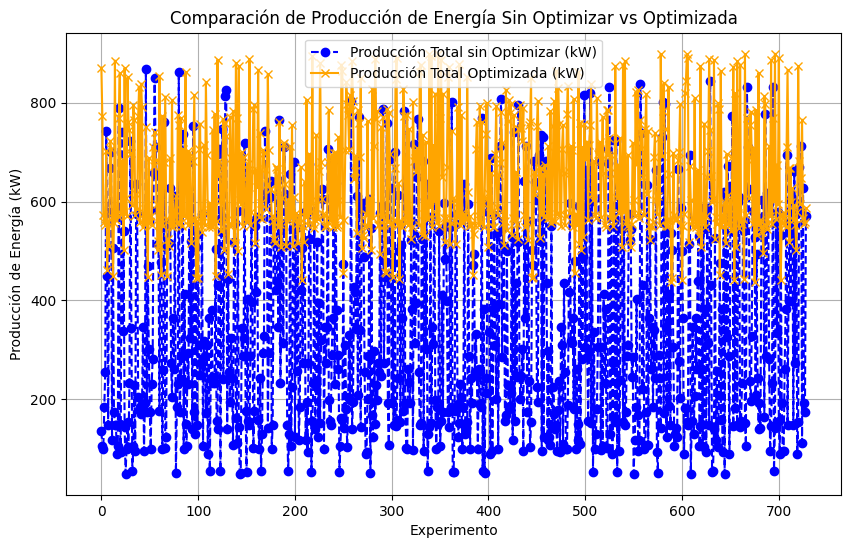

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Parámetros de la demanda de carga
demanda_carga = 900  # Demanda total en kW

# Simulación de producción sin optimizar (basado en las condiciones ambientales)
P_solar_original = [solar_production(
    {'Baja': 400, 'Media': 750, 'Alta': 1000}[row['Radiación solar']],
    {'Baja': 15, 'Media': 25, 'Alta': 35}[row['Temperatura']],
    {'Baja': 40, 'Media': 60, 'Alta': 80}[row['Humedad']]
) for _, row in frac_design.iterrows()]

P_wind_original = [wind_production(
    {'Baja': 2, 'Media': 5, 'Alta': 10}[row['Velocidad del viento']],
    {'Baja': 30, 'Media': 90, 'Alta': 210}[row['Dirección del viento']],
    {'Baja': 950, 'Media': 1010, 'Alta': 1025}[row['Presión']]
) for _, row in frac_design.iterrows()]

# Calcular la producción total sin optimizar para cada experimento
produccion_total_sin_optimizar = np.array(P_solar_original) + np.array(P_wind_original)

# Nueva optimización: maximizar la producción dentro de los límites de la demanda
P_solar_optimizada = []
P_wind_optimizada = []

for i in range(len(P_solar_original)):
    # Producción total actual sin optimizar
    produccion_actual = P_solar_original[i] + P_wind_original[i]

    if produccion_actual < demanda_carga:
        # Escalar para maximizar y acercar a la demanda
        factor_escala = demanda_carga / produccion_actual if produccion_actual > 0 else 1
        P_solar_opt = min(P_solar_original[i] * factor_escala, demanda_carga * 0.6)  # Limita a un máximo del 60% de la demanda
        P_wind_opt = min(P_wind_original[i] * factor_escala, demanda_carga * 0.4)   # Limita a un máximo del 40% de la demanda
    else:
        # Si ya cumple o excede la demanda, no escalar
        P_solar_opt = min(P_solar_original[i], demanda_carga * 0.6)
        P_wind_opt = min(P_wind_original[i], demanda_carga * 0.4)

    P_solar_optimizada.append(P_solar_opt)
    P_wind_optimizada.append(P_wind_opt)

# Calcular la producción total optimizada para cada experimento
produccion_total_optimizada = np.array(P_solar_optimizada) + np.array(P_wind_optimizada)

# Evaluar cuántos experimentos cumplen con la demanda
experimentos_cumplen = (produccion_total_optimizada >= demanda_carga).sum()
experimentos_no_cumplen = (produccion_total_optimizada < demanda_carga).sum()

print(f"Cantidad de experimentos donde la optimización cumple la demanda: {experimentos_cumplen}")
print(f"Cantidad de experimentos donde la optimización no cumple la demanda: {experimentos_no_cumplen}")

# Graficar producción sin optimizar y optimizada
fig, ax = plt.subplots(figsize=(10, 6))

# Valores sin optimizar
ax.plot(produccion_total_sin_optimizar, label='Producción Total sin Optimizar (kW)', linestyle='--', marker='o', color='blue')

# Valores optimizados
ax.plot(produccion_total_optimizada, label='Producción Total Optimizada (kW)', marker='x', color='orange')

# Configurar el gráfico
ax.set_xlabel('Experimento')
ax.set_ylabel('Producción de Energía (kW)')
ax.set_title('Comparación de Producción de Energía Sin Optimizar vs Optimizada')
ax.legend()
ax.grid(True)

plt.show()


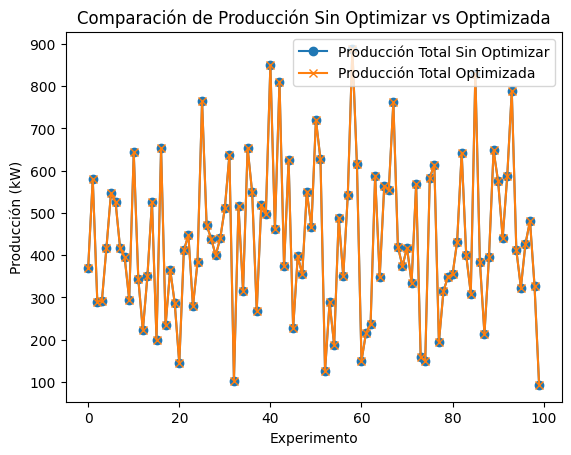

In [38]:
import numpy as np
from scipy.optimize import linprog

# Parámetros del sistema
demanda_total = 900
limite_solar = 540
limite_eolica = 360

# Valores de producción solar y eólica sin optimizar (por experimento)
produccion_solar = np.random.uniform(0, limite_solar, 100)  # Valores de ejemplo
produccion_eolica = np.random.uniform(0, limite_eolica, 100)

# Inicializar lista para almacenar producción optimizada
produccion_total_optimizada = []

for i in range(len(produccion_solar)):
    # Coeficientes de la función objetivo (queremos minimizar la diferencia con la demanda)
    c = [-1, -1]  # Negativo porque queremos maximizar la cobertura

    # Restricciones de desigualdad (Ax <= b)
    A = [
        [1, 0],       # No superar el límite de producción solar
        [0, 1],       # No superar el límite de producción eólica
        [-1, -1]      # La suma no debe exceder la demanda total
    ]
    b = [limite_solar, limite_eolica, -demanda_total]

    # Restricciones de límites para las variables
    bounds = [(0, produccion_solar[i]), (0, produccion_eolica[i])]

    # Resolver el problema de programación lineal
    result = linprog(c, A_ub=A, b_ub=b, bounds=bounds, method='highs')

    # Producción optimizada
    if result.success:
        produccion_optimizada = result.x[0] + result.x[1]
        produccion_total_optimizada.append(produccion_optimizada)
    else:
        produccion_total_optimizada.append(produccion_solar[i] + produccion_eolica[i])

# Comparación entre producción sin optimizar y optimizada
import matplotlib.pyplot as plt

plt.plot(range(len(produccion_total_optimizada)), produccion_solar + produccion_eolica, 'o-', label="Producción Total Sin Optimizar")
plt.plot(range(len(produccion_total_optimizada)), produccion_total_optimizada, 'x-', label="Producción Total Optimizada")
plt.xlabel("Experimento")
plt.ylabel("Producción (kW)")
plt.legend()
plt.title("Comparación de Producción Sin Optimizar vs Optimizada")
plt.show()

Cantidad de experimentos donde la optimización cumple la demanda: 54
Cantidad de experimentos donde la optimización no cumple la demanda: 675
Cantidad de experimentos donde la optimización es mejor que el valor real: 0


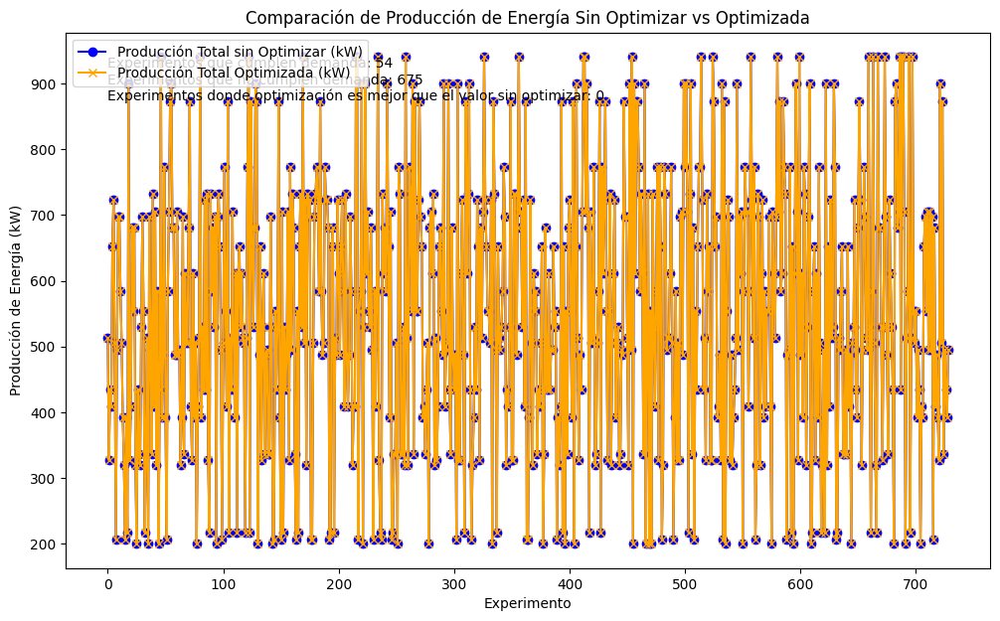

In [40]:
import numpy as np
import pandas as pd
from scipy.optimize import linprog
import matplotlib.pyplot as plt
import itertools

# Definir los niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Crear un diseño fraccional 1/4 (tomar el 25% de los experimentos)
frac_design = design_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Asignar valores numéricos a cada nivel para el cálculo
def asignar_valor_nivel(nivel, factor):
    if factor == 'Radiación solar':
        return {'Baja': 200, 'Media': 500, 'Alta': 800}[nivel]
    elif factor == 'Temperatura':
        return {'Baja': 10, 'Media': 25, 'Alta': 35}[nivel]
    elif factor == 'Humedad':
        return {'Baja': 0.3, 'Media': 0.6, 'Alta': 0.9}[nivel]
    elif factor == 'Velocidad del viento':
        return {'Baja': 3, 'Media': 8, 'Alta': 15}[nivel]
    elif factor == 'Dirección del viento':
        return {'Baja': 0, 'Media': 180, 'Alta': 360}[nivel]
    elif factor == 'Presión':
        return {'Baja': 1000, 'Media': 1013, 'Alta': 1025}[nivel]
    return 0

# Convertir los niveles a valores numéricos en el DataFrame
for factor in factores:
    frac_design[factor] = frac_design[factor].apply(lambda x: asignar_valor_nivel(x, factor))

# Parámetro de demanda
demanda = 900  # en kW

# Funciones de producción solar y eólica basadas en los valores asignados
def produccion_solar(row):
    # Producción en función de radiación y temperatura
    irradiancia = row['Radiación solar']
    temperatura = row['Temperatura']
    return irradiancia * max(0, (1 - 0.005 * (temperatura - 25))) * 540 / 800

def produccion_eolica(row):
    # Producción en función de velocidad del viento
    velocidad_viento = row['Velocidad del viento']
    if velocidad_viento < 3 or velocidad_viento > 25:
        return 0
    elif velocidad_viento <= 15:
        return velocidad_viento / 15 * 360
    else:
        return 360

# Calcular la producción sin optimizar para cada experimento
frac_design["produccion_solar"] = frac_design.apply(produccion_solar, axis=1)
frac_design["produccion_eolica"] = frac_design.apply(produccion_eolica, axis=1)
frac_design["produccion_total_sin_optimizar"] = frac_design["produccion_solar"] + frac_design["produccion_eolica"]

# Optimización para cada experimento
produccion_total_optimizada = []
cumple_demanda = 0
no_cumple_demanda = 0
mejora_optimizada = 0

for index, row in frac_design.iterrows():
    c = [-1, -1]  # Maximizar la producción total
    A = [
        [1, 0],       # Límite solar
        [0, 1],       # Límite eólico
        [-1, -1]      # La producción total no debe exceder la demanda
    ]
    b = [row["produccion_solar"], row["produccion_eolica"], -demanda]

    bounds = [(0, row["produccion_solar"]), (0, row["produccion_eolica"])]

    result = linprog(c, A_ub=A, b_ub=b, bounds=bounds, method='highs')
    if result.success:
        produccion_optimizada = result.x[0] + result.x[1]
        produccion_total_optimizada.append(produccion_optimizada)
        if produccion_optimizada >= demanda:
            cumple_demanda += 1
        else:
            no_cumple_demanda += 1

        if produccion_optimizada > row["produccion_total_sin_optimizar"]:
            mejora_optimizada += 1
    else:
        produccion_total_optimizada.append(row["produccion_total_sin_optimizar"])
        no_cumple_demanda += 1

# Añadir resultados de producción optimizada a la DataFrame
frac_design["produccion_total_optimizada"] = produccion_total_optimizada

# Imprimir resultados resumen
print(f"Cantidad de experimentos donde la optimización cumple la demanda: {cumple_demanda}")
print(f"Cantidad de experimentos donde la optimización no cumple la demanda: {no_cumple_demanda}")
print(f"Cantidad de experimentos donde la optimización es mejor que el valor real: {mejora_optimizada}")

# Graficar los resultados
plt.figure(figsize=(12, 7))
plt.plot(frac_design.index, frac_design["produccion_total_sin_optimizar"], 'o-', color='blue', label="Producción Total sin Optimizar (kW)")
plt.plot(frac_design.index, frac_design["produccion_total_optimizada"], 'x-', color='orange', label="Producción Total Optimizada (kW)")
plt.xlabel("Experimento")
plt.ylabel("Producción de Energía (kW)")
plt.legend()
plt.title("Comparación de Producción de Energía Sin Optimizar vs Optimizada")
plt.text(0, max(frac_design["produccion_total_sin_optimizar"]),
         f"Experimentos que cumplen demanda: {cumple_demanda}\n"
         f"Experimentos que no cumplen demanda: {no_cumple_demanda}\n"
         f"Experimentos donde optimización es mejor que el valor sin optimizar: {mejora_optimizada}",
         fontsize=10, verticalalignment='top')
plt.show()


Total intervalos: 729
Cumplimiento de demanda sin optimización: 473
Cumplimiento de demanda con optimización: 729
Intervalos donde la optimización mejoró la producción: 256


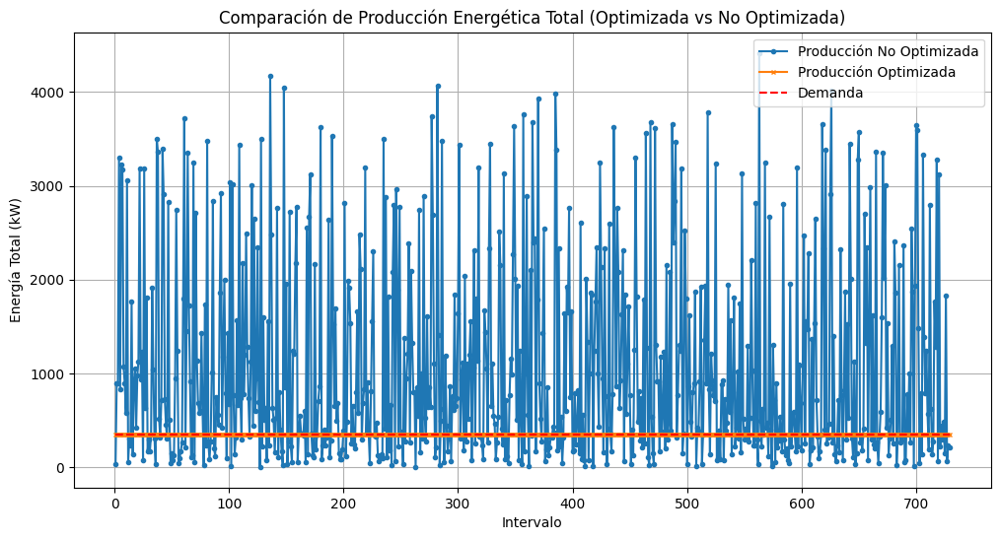

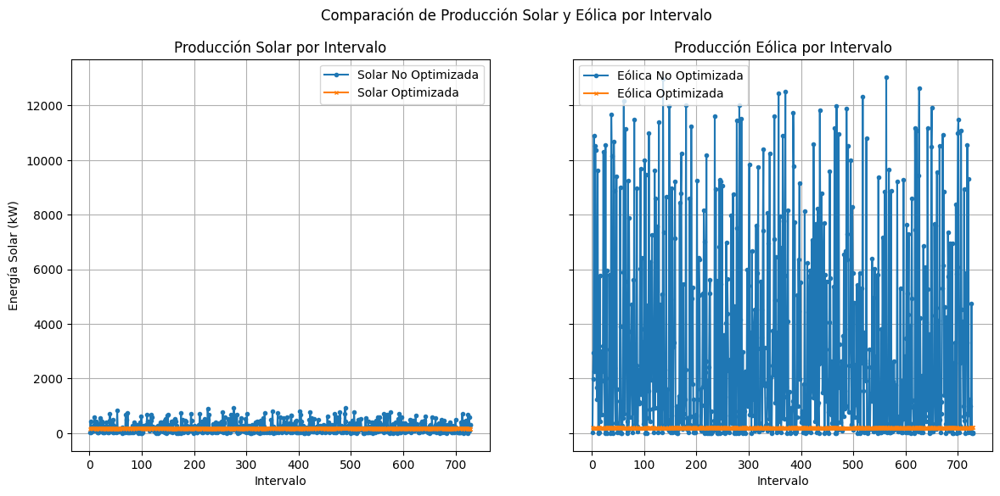

In [43]:
import numpy as np
from scipy.optimize import linprog
import matplotlib.pyplot as plt

# Parámetros de la función objetivo
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Escenarios de predicciones para 729 intervalos de experimentación
np.random.seed(0)  # Fijar semilla para reproducibilidad
predicted_radiation = np.random.uniform(0, 1500, 729)
predicted_temperature = np.random.uniform(-10, 50, 729)
predicted_humidity = np.random.uniform(5, 100, 729)
predicted_wind_speed = np.random.uniform(0, 30, 729)
predicted_wind_direction = np.random.uniform(0, 360, 729)
predicted_pressure = np.random.uniform(970, 1050, 729)

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Restricciones de capacidad y demanda
demand = 350  # Demanda energética en kW
wind_max_capacity = 200
solar_max_capacity = 180
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Almacenamiento de resultados
P_solar_no_opt = []
P_wind_no_opt = []
P_total_no_opt = []
opt_wind = []
opt_solar = []
opt_total = []

# Optimización por cada intervalo
for interval in range(729):
    # Generación de energía sin optimizar
    ps = solar_production(predicted_radiation[interval], predicted_temperature[interval], predicted_humidity[interval])
    pw = wind_production(predicted_wind_speed[interval], predicted_wind_direction[interval], predicted_pressure[interval])
    pt = alpha * ps + beta * pw

    P_solar_no_opt.append(ps)
    P_wind_no_opt.append(pw)
    P_total_no_opt.append(pt)

    # Optimización
    c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza
    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        opt_wind.append(P_wind_opt)
        opt_solar.append(P_solar_opt)
        opt_total.append(P_wind_opt + P_solar_opt)
    else:
        opt_wind.append(0)
        opt_solar.append(0)
        opt_total.append(0)

# Análisis de resultados
cumple_demanda_no_opt = sum(np.array(P_total_no_opt) >= demand)
cumple_demanda_opt = sum(np.array(opt_total) >= demand)
mejora_en_produccion = sum(np.array(opt_total) > np.array(P_total_no_opt))

print("Total intervalos:", 729)
print("Cumplimiento de demanda sin optimización:", cumple_demanda_no_opt)
print("Cumplimiento de demanda con optimización:", cumple_demanda_opt)
print("Intervalos donde la optimización mejoró la producción:", mejora_en_produccion)

# Graficación de resultados
intervals = range(1, 730)

plt.figure(figsize=(12, 6))
plt.plot(intervals, P_total_no_opt, label='Producción No Optimizada', marker='o', markersize=3)
plt.plot(intervals, opt_total, label='Producción Optimizada', marker='x', markersize=3)
plt.plot(intervals, [demand] * len(intervals), 'r--', label='Demanda')
plt.xlabel('Intervalo')
plt.ylabel('Energía Total (kW)')
plt.title('Comparación de Producción Energética Total (Optimizada vs No Optimizada)')
plt.legend()
plt.grid(True)
plt.show()

# Gráficas de producción solar y eólica
fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

axs[0].plot(intervals, P_solar_no_opt, marker='o', markersize=3, label='Solar No Optimizada')
axs[0].plot(intervals, opt_solar, marker='x', markersize=3, label='Solar Optimizada')
axs[0].set_title('Producción Solar por Intervalo')
axs[0].set_xlabel('Intervalo')
axs[0].set_ylabel('Energía Solar (kW)')
axs[0].legend()
axs[0].grid(True)

axs[1].plot(intervals, P_wind_no_opt, marker='o', markersize=3, label='Eólica No Optimizada')
axs[1].plot(intervals, opt_wind, marker='x', markersize=3, label='Eólica Optimizada')
axs[1].set_title('Producción Eólica por Intervalo')
axs[1].set_xlabel('Intervalo')
axs[1].legend()
axs[1].grid(True)

plt.suptitle('Comparación de Producción Solar y Eólica por Intervalo')
plt.show()


Total de casos: 729
Casos donde la demanda fue cumplida tras la optimización: 729
Casos donde la optimización mejoró el resultado no optimizado: 207


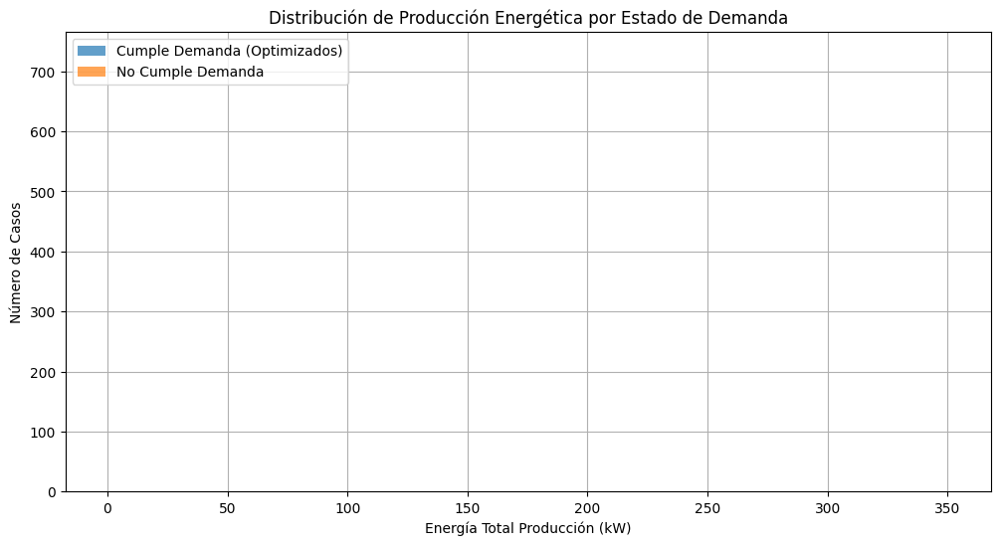

In [42]:
import numpy as np
from scipy.optimize import linprog
import matplotlib.pyplot as plt
import pandas as pd
import itertools

# Definir los niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Asignar valores numéricos a cada nivel para cada variable
niveles_valores = {
    'Radiación solar': {'Baja': 200, 'Media': 800, 'Alta': 1200},
    'Temperatura': {'Baja': -5, 'Media': 20, 'Alta': 35},
    'Humedad': {'Baja': 10, 'Media': 50, 'Alta': 90},
    'Velocidad del viento': {'Baja': 5, 'Media': 15, 'Alta': 25},
    'Dirección del viento': {'Baja': 0, 'Media': 180, 'Alta': 360},
    'Presión': {'Baja': 980, 'Media': 1013, 'Alta': 1050}
}

# Convertir los niveles a valores numéricos en el DataFrame
for factor, valores in niveles_valores.items():
    design_df[factor] = design_df[factor].map(valores)

# Coeficientes de eficiencia relativos para la función objetivo
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Restricciones de capacidad y demanda
demand = 350  # Demanda energética en kW
wind_max_capacity = 200
solar_max_capacity = 180
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Inicialización de contadores
total_cases = len(design_df)
cases_meeting_demand = 0
cases_improved_by_optimization = 0

# Resultados de optimización
opt_results = []

# Optimización para cada combinación experimental
for idx, row in design_df.iterrows():
    radiation = row['Radiación solar']
    temperature = row['Temperatura']
    humidity = row['Humedad']
    wind_speed = row['Velocidad del viento']
    wind_direction = row['Dirección del viento']
    pressure = row['Presión']

    # Generación de energía solar y eólica
    P_solar = solar_production(radiation, temperature, humidity)
    P_wind = wind_production(wind_speed, wind_direction, pressure)
    P_total = alpha * P_solar + beta * P_wind

    # Optimización
    c = -np.array([alpha * P_solar, beta * P_wind])  # Negativo porque linprog minimiza
    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))

    # Almacenamiento de resultados
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        P_total_opt = P_wind_opt + P_solar_opt

        # Verificar si se cumple con la demanda y si la optimización mejoró
        demand_met_initially = P_total >= demand
        demand_met_optimized = P_total_opt >= demand
        improved = P_total_opt > P_total

        opt_results.append((idx, P_total, P_total_opt, demand_met_initially, demand_met_optimized, improved))

        if demand_met_optimized:
            cases_meeting_demand += 1
        if improved:
            cases_improved_by_optimization += 1
    else:
        opt_results.append((idx, P_total, 0, False, False, False))

# Imprimir resultados
print(f"Total de casos: {total_cases}")
print(f"Casos donde la demanda fue cumplida tras la optimización: {cases_meeting_demand}")
print(f"Casos donde la optimización mejoró el resultado no optimizado: {cases_improved_by_optimization}")

# Crear gráficos de resultados
plt.figure(figsize=(12, 6))
plt.hist([res[2] for res in opt_results if res[4]], bins=20, alpha=0.7, label="Cumple Demanda (Optimizados)")
plt.hist([res[1] for res in opt_results if not res[4]], bins=20, alpha=0.7, label="No Cumple Demanda")
plt.xlabel("Energía Total Producción (kW)")
plt.ylabel("Número de Casos")
plt.legend()
plt.title("Distribución de Producción Energética por Estado de Demanda")
plt.grid(True)
plt.show()


<ipython-input-44-2b1fff5f7555>:24: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  frac_design_num = frac_design.replace(level_mapping)


Total intervalos: 729
Cumplimiento de demanda sin optimización: 534
Cumplimiento de demanda con optimización: 486
Intervalos donde la optimización mejoró la producción: 195


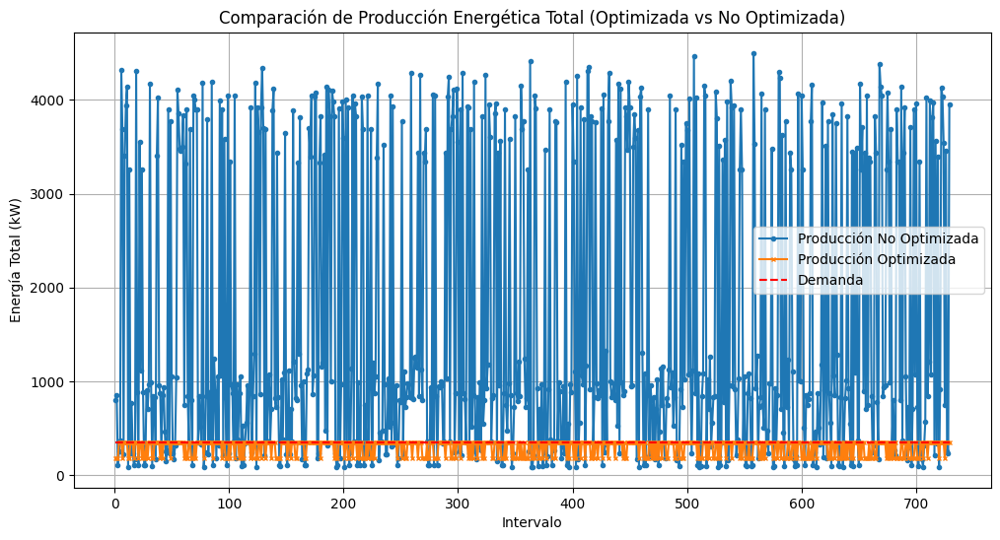

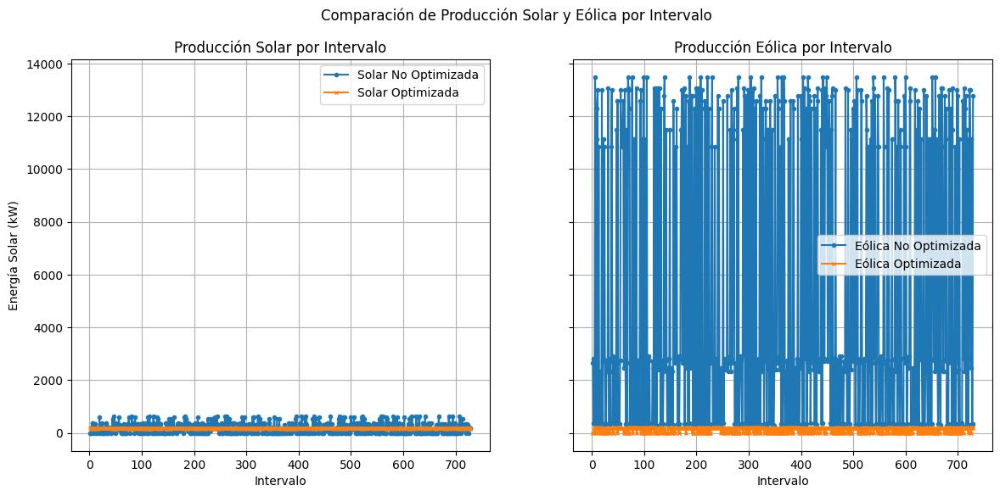

In [44]:
import numpy as np
from scipy.optimize import linprog
import matplotlib.pyplot as plt
import itertools
import pandas as pd

# Definir los niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Crear un diseño fraccional 1/4 (tomar el 25% de los experimentos)
frac_design = design_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Convertir los niveles de los factores a valores numéricos
level_mapping = {'Baja': 0.3, 'Media': 0.6, 'Alta': 1.0}
frac_design_num = frac_design.replace(level_mapping)

# Parámetros de la función objetivo
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Escenarios de predicciones basados en el diseño experimental
predicted_radiation = frac_design_num['Radiación solar'] * 1500
predicted_temperature = frac_design_num['Temperatura'] * 60 - 10  # Escalar entre -10 y 50
predicted_humidity = frac_design_num['Humedad'] * 95 + 5          # Escalar entre 5 y 100
predicted_wind_speed = frac_design_num['Velocidad del viento'] * 30
predicted_wind_direction = frac_design_num['Dirección del viento'] * 360
predicted_pressure = frac_design_num['Presión'] * 80 + 970        # Escalar entre 970 y 1050

# Funciones de producción basadas en variables climáticas
def solar_production(radiation, temperature, humidity):
    return 0.6 * radiation * (1 - 0.005 * (temperature - 25)) * (1 - 0.01 * humidity)

def wind_production(speed, direction, pressure):
    return 0.5 * speed**3 * (1 - 0.001 * abs(direction - 180)) * (pressure / 1013)

# Restricciones de capacidad y demanda
demand = 350  # Demanda energética en kW
wind_max_capacity = 200
solar_max_capacity = 180
A = [[1, 0], [0, 1], [1, 1]]
b = [wind_max_capacity, solar_max_capacity, demand]

# Almacenamiento de resultados
P_solar_no_opt = []
P_wind_no_opt = []
P_total_no_opt = []
opt_wind = []
opt_solar = []
opt_total = []

# Optimización por cada intervalo
for interval in range(len(frac_design_num)):
    # Generación de energía sin optimizar
    ps = solar_production(predicted_radiation.iloc[interval], predicted_temperature.iloc[interval], predicted_humidity.iloc[interval])
    pw = wind_production(predicted_wind_speed.iloc[interval], predicted_wind_direction.iloc[interval], predicted_pressure.iloc[interval])
    pt = alpha * ps + beta * pw

    P_solar_no_opt.append(ps)
    P_wind_no_opt.append(pw)
    P_total_no_opt.append(pt)

    # Optimización
    c = -np.array([alpha * ps, beta * pw])  # Negativo porque linprog minimiza
    result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))
    if result.success:
        P_wind_opt = result.x[0]
        P_solar_opt = result.x[1]
        opt_wind.append(P_wind_opt)
        opt_solar.append(P_solar_opt)
        opt_total.append(P_wind_opt + P_solar_opt)
    else:
        opt_wind.append(0)
        opt_solar.append(0)
        opt_total.append(0)

# Análisis de resultados
cumple_demanda_no_opt = sum(np.array(P_total_no_opt) >= demand)
cumple_demanda_opt = sum(np.array(opt_total) >= demand)
mejora_en_produccion = sum(np.array(opt_total) > np.array(P_total_no_opt))

print("Total intervalos:", len(frac_design_num))
print("Cumplimiento de demanda sin optimización:", cumple_demanda_no_opt)
print("Cumplimiento de demanda con optimización:", cumple_demanda_opt)
print("Intervalos donde la optimización mejoró la producción:", mejora_en_produccion)

# Graficación de resultados
intervals = range(1, len(frac_design_num) + 1)

plt.figure(figsize=(12, 6))
plt.plot(intervals, P_total_no_opt, label='Producción No Optimizada', marker='o', markersize=3)
plt.plot(intervals, opt_total, label='Producción Optimizada', marker='x', markersize=3)
plt.plot(intervals, [demand] * len(intervals), 'r--', label='Demanda')
plt.xlabel('Intervalo')
plt.ylabel('Energía Total (kW)')
plt.title('Comparación de Producción Energética Total (Optimizada vs No Optimizada)')
plt.legend()
plt.grid(True)
plt.show()

# Gráficas de producción solar y eólica
fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

axs[0].plot(intervals, P_solar_no_opt, marker='o', markersize=3, label='Solar No Optimizada')
axs[0].plot(intervals, opt_solar, marker='x', markersize=3, label='Solar Optimizada')
axs[0].set_title('Producción Solar por Intervalo')
axs[0].set_xlabel('Intervalo')
axs[0].set_ylabel('Energía Solar (kW)')
axs[0].legend()
axs[0].grid(True)

axs[1].plot(intervals, P_wind_no_opt, marker='o', markersize=3, label='Eólica No Optimizada')
axs[1].plot(intervals, opt_wind, marker='x', markersize=3, label='Eólica Optimizada')
axs[1].set_title('Producción Eólica por Intervalo')
axs[1].set_xlabel('Intervalo')
axs[1].legend()
axs[1].grid(True)

plt.suptitle('Comparación de Producción Solar y Eólica por Intervalo')
plt.show()


Número de experimentos que cumplen con la demanda: 729
Número de experimentos que no cumplen con la demanda: 0
Mejora máxima de la optimización: -299.99999999999994


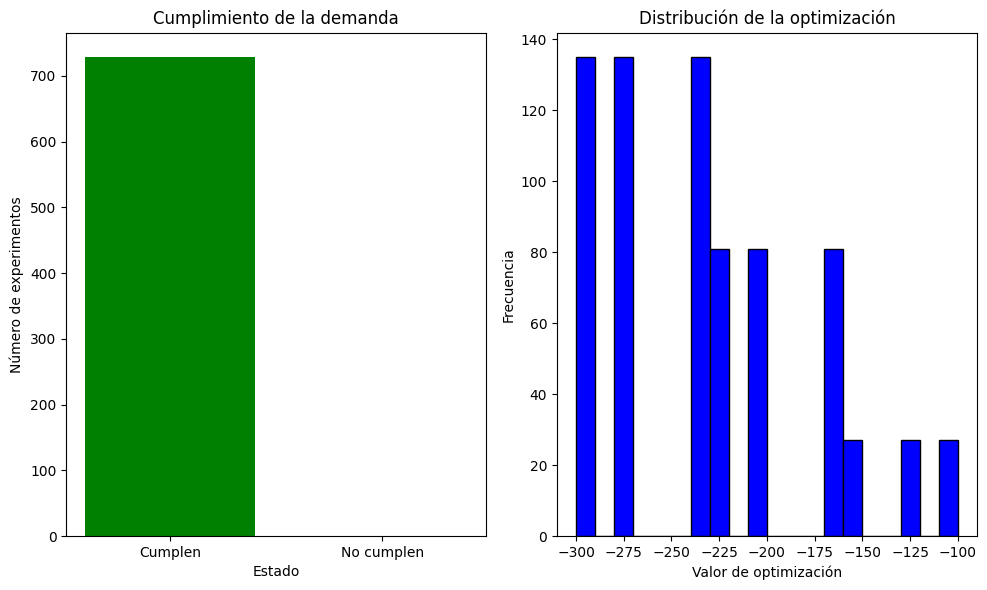

In [46]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import linprog

# Definir los valores de entrada
alpha = 0.7  # Peso de la energía solar
beta = 0.3   # Peso de la energía eólica

# Niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Factores: Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento, Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar combinaciones de los niveles de los factores
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Crear un diseño fraccional 1/4 (tomar el 25% de los experimentos)
frac_design = design_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Función de optimización lineal simple (para cada combinación de factores)
def optimizar_experimento(factor_values):
    # Simulación de cómo influyen los factores en la producción (debes definir esta relación)
    solar_prod = alpha * factor_values[0] + beta * factor_values[3]  # Solo un ejemplo
    eolic_prod = beta * factor_values[3] + alpha * factor_values[5]  # Solo un ejemplo
    demanda = 100  # Supón que la demanda es fija

    # Modelo de optimización lineal para maximizar la producción, sujeto a la demanda
    c = [-solar_prod, -eolic_prod]  # Queremos maximizar la producción, por eso los valores son negativos
    A = [[1, 1]]  # Restricción de demanda
    b = [demanda]

    # Llamada a linprog para optimizar la producción solar y eólica
    res = linprog(c, A_ub=A, b_ub=b, bounds=[(0, None), (0, None)], method='highs')
    return res.fun, res.success  # Devolvemos la función objetivo y si la optimización fue exitosa

# Aplicar la optimización a cada combinación de factores
resultados = []
for i, row in frac_design.iterrows():
    # Convertimos los valores de cada combinación a números (por ejemplo, de 'Baja' a 1, 'Media' a 2, 'Alta' a 3)
    factor_values = [1 if val == 'Baja' else 2 if val == 'Media' else 3 for val in row]
    optim_res, exito = optimizar_experimento(factor_values)
    resultados.append((optim_res, exito))

# Convertimos los resultados en un DataFrame
resultados_df = pd.DataFrame(resultados, columns=['Optimización', 'Éxito'])

# Evaluación de los experimentos
cumplen = resultados_df['Éxito'].sum()
no_cumplen = len(resultados_df) - cumplen
mejor_optimización = resultados_df['Optimización'].min()

# Imprimir los resultados
print(f'Número de experimentos que cumplen con la demanda: {cumplen}')
print(f'Número de experimentos que no cumplen con la demanda: {no_cumplen}')
print(f'Mejora máxima de la optimización: {mejor_optimización}')

# Graficar los resultados
plt.figure(figsize=(10, 6))

# Gráfico de cumplimiento
plt.subplot(1, 2, 1)
plt.bar(['Cumplen', 'No cumplen'], [cumplen, no_cumplen], color=['green', 'red'])
plt.title('Cumplimiento de la demanda')
plt.xlabel('Estado')
plt.ylabel('Número de experimentos')

# Gráfico de optimización
plt.subplot(1, 2, 2)
plt.hist(resultados_df['Optimización'], bins=20, color='blue', edgecolor='black')
plt.title('Distribución de la optimización')
plt.xlabel('Valor de optimización')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()


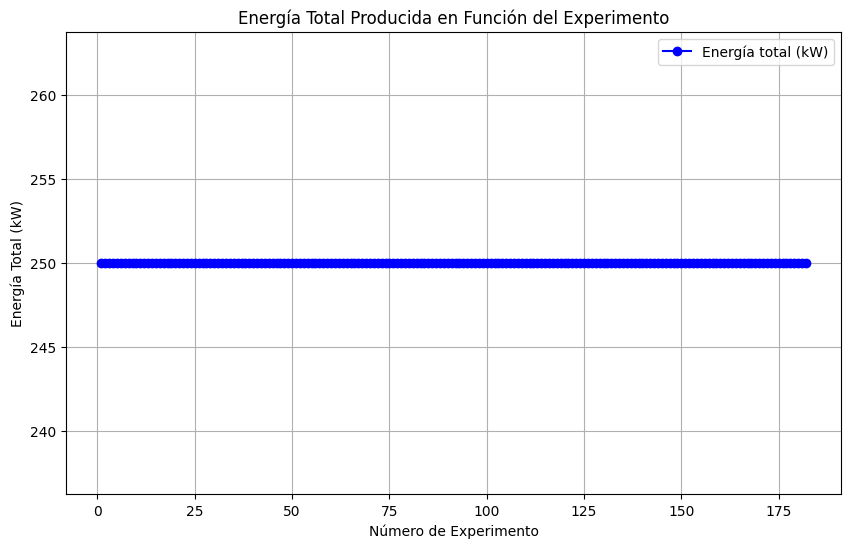

In [ ]:
# Graficamos la energía total producida en función de los experimentos
plt.figure(figsize=(10, 6))
plt.plot(results_df['Experimento'], results_df['Energía total (kW)'], marker='o', linestyle='-', color='b', label='Energía total (kW)')
plt.title('Energía Total Producida en Función del Experimento')
plt.xlabel('Número de Experimento')
plt.ylabel('Energía Total (kW)')
plt.grid(True)
plt.legend()
plt.show()

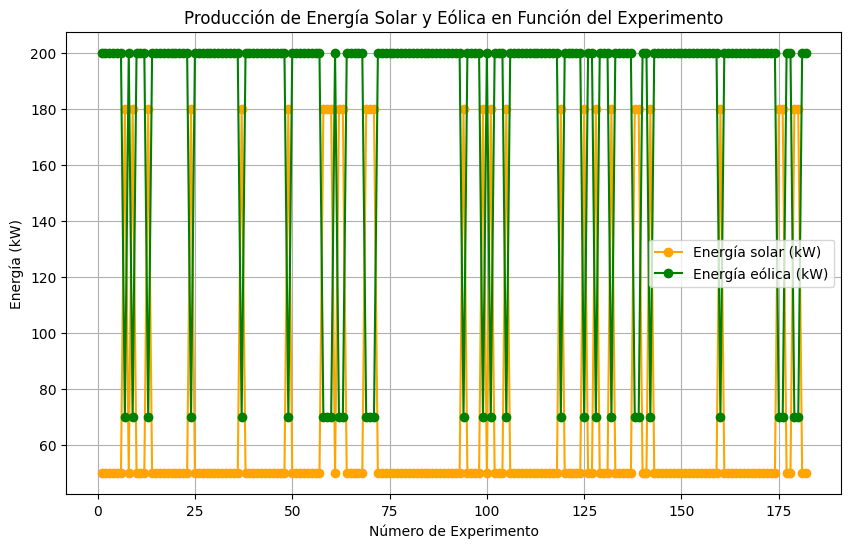

In [ ]:
# Graficar la producción de energía solar y eólica
plt.figure(figsize=(10, 6))
plt.plot(results_df['Experimento'], results_df['Energía óptima solar (kW)'], marker='o', linestyle='-', color='orange', label='Energía solar (kW)')
plt.plot(results_df['Experimento'], results_df['Energía óptima eólica (kW)'], marker='o', linestyle='-', color='green', label='Energía eólica (kW)')
plt.title('Producción de Energía Solar y Eólica en Función del Experimento')
plt.xlabel('Número de Experimento')
plt.ylabel('Energía (kW)')
plt.grid(True)
plt.legend()
plt.show()

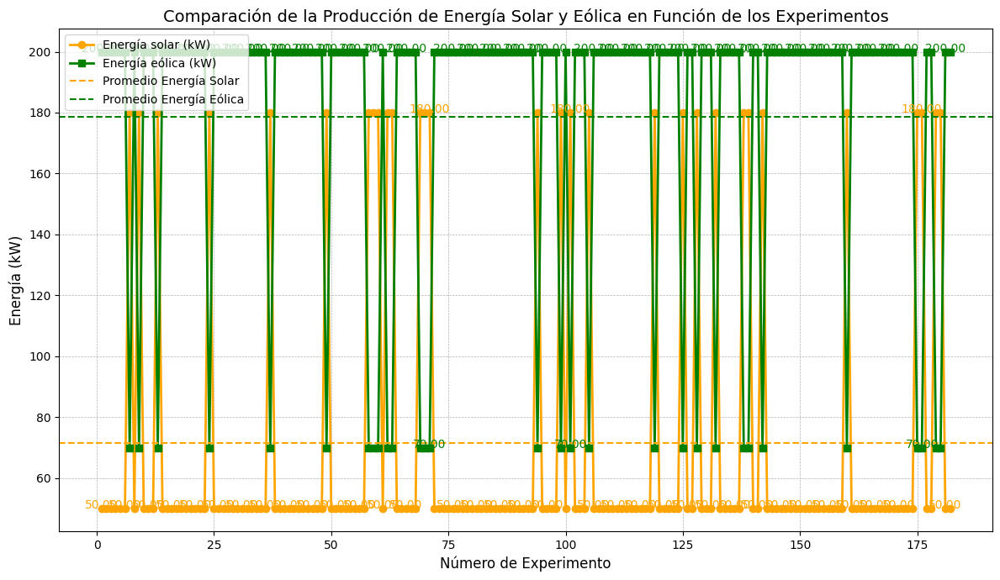

In [ ]:
# Graficar la producción de energía solar y eólica
plt.figure(figsize=(12, 7))

# Producción solar
plt.plot(results_df['Experimento'], results_df['Energía óptima solar (kW)'], marker='o', linestyle='-', color='orange', label='Energía solar (kW)', linewidth=2)
# Producción eólica
plt.plot(results_df['Experimento'], results_df['Energía óptima eólica (kW)'], marker='s', linestyle='-', color='green', label='Energía eólica (kW)', linewidth=2)

# Anotar algunos puntos de interés
for i, row in results_df.iterrows():
    if i % 5 == 0:  # Anotar cada 5 experimentos
        plt.text(row['Experimento'], row['Energía óptima solar (kW)'], f'{row["Energía óptima solar (kW)"]:.2f}', color='orange', fontsize=10, ha='center')
        plt.text(row['Experimento'], row['Energía óptima eólica (kW)'], f'{row["Energía óptima eólica (kW)"]:.2f}', color='green', fontsize=10, ha='center')

# Mejorar título y etiquetas
plt.title('Comparación de la Producción de Energía Solar y Eólica en Función de los Experimentos', fontsize=14)
plt.xlabel('Número de Experimento', fontsize=12)
plt.ylabel('Energía (kW)', fontsize=12)

# Líneas de referencia (promedio)
plt.axhline(y=results_df['Energía óptima solar (kW)'].mean(), color='orange', linestyle='--', label='Promedio Energía Solar')
plt.axhline(y=results_df['Energía óptima eólica (kW)'].mean(), color='green', linestyle='--', label='Promedio Energía Eólica')

# Mostrar la cuadrícula y leyenda
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(loc='upper left')

# Mostrar la gráfica
plt.tight_layout()
plt.show()


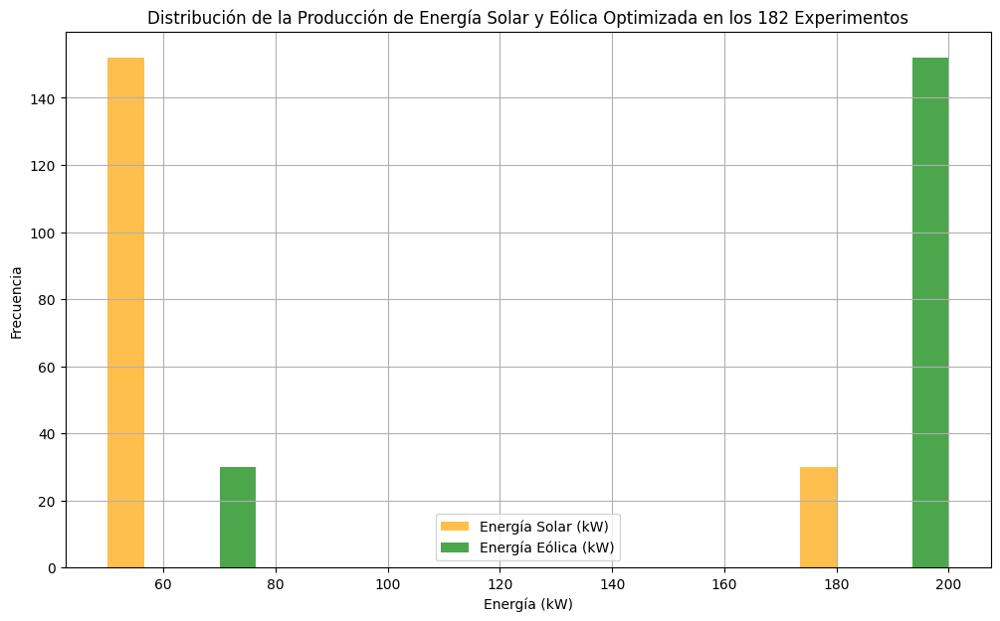

In [ ]:
# Graficar un histograma de la producción de energía solar y eólica
plt.figure(figsize=(12, 7))
plt.hist(results_df['Energía óptima solar (kW)'], bins=20, alpha=0.7, label='Energía Solar (kW)', color='orange')
plt.hist(results_df['Energía óptima eólica (kW)'], bins=20, alpha=0.7, label='Energía Eólica (kW)', color='green')
plt.title('Distribución de la Producción de Energía Solar y Eólica Optimizada en los 182 Experimentos')
plt.xlabel('Energía (kW)')
plt.ylabel('Frecuencia')
plt.legend()
plt.grid(True)
plt.show()


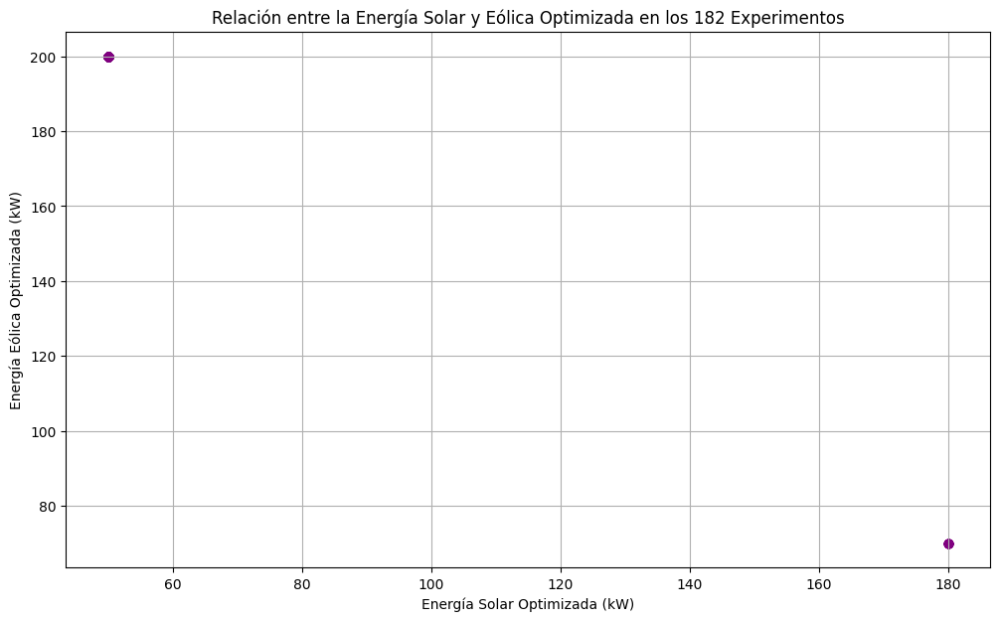

In [ ]:
# Graficar la relación entre energía solar y eólica
plt.figure(figsize=(12, 7))
plt.scatter(results_df['Energía óptima solar (kW)'], results_df['Energía óptima eólica (kW)'], alpha=0.7, color='purple')
plt.title('Relación entre la Energía Solar y Eólica Optimizada en los 182 Experimentos')
plt.xlabel('Energía Solar Optimizada (kW)')
plt.ylabel('Energía Eólica Optimizada (kW)')
plt.grid(True)
plt.show()


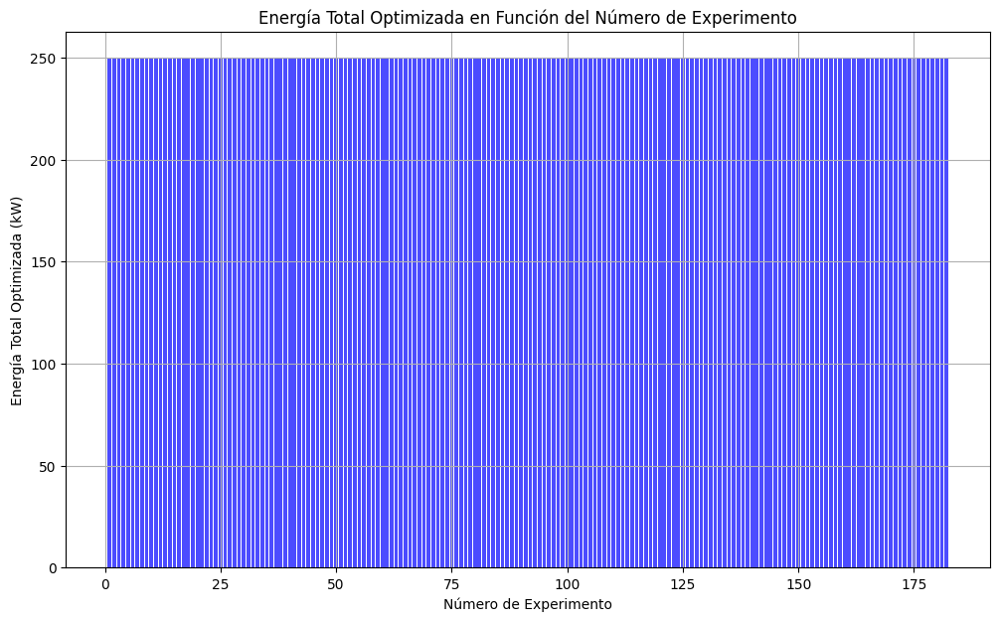

In [ ]:
# Graficar la energía total optimizada para cada experimento
plt.figure(figsize=(12, 7))
plt.bar(results_df['Experimento'], results_df['Energía total (kW)'], color='blue', alpha=0.7)
plt.title('Energía Total Optimizada en Función del Número de Experimento')
plt.xlabel('Número de Experimento')
plt.ylabel('Energía Total Optimizada (kW)')
plt.grid(True)
plt.show()


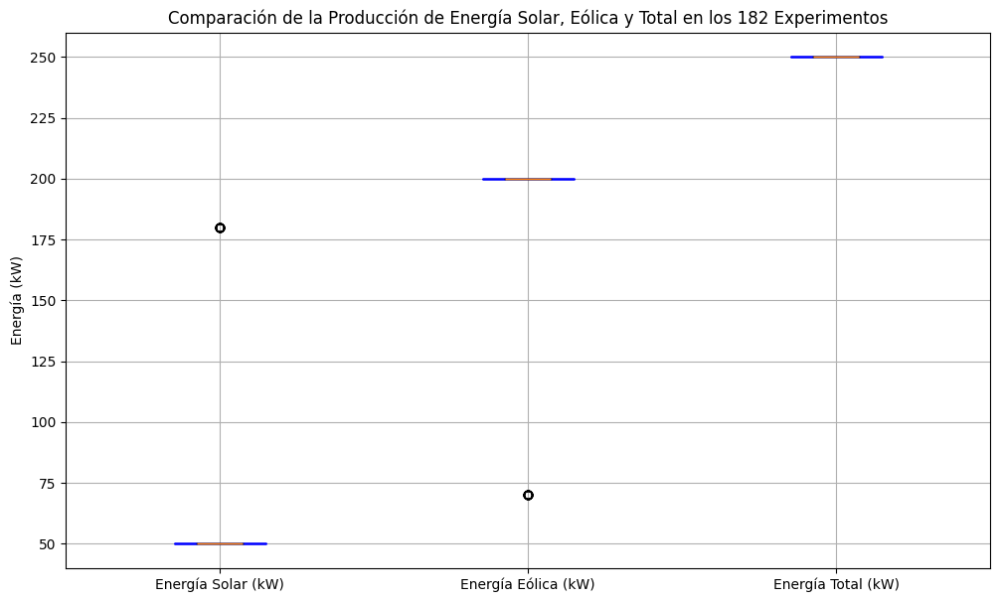

In [ ]:
# Graficar un boxplot para comparar la energía solar, eólica y total
plt.figure(figsize=(12, 7))
plt.boxplot([results_df['Energía óptima solar (kW)'], results_df['Energía óptima eólica (kW)'], results_df['Energía total (kW)']],
            labels=['Energía Solar (kW)', 'Energía Eólica (kW)', 'Energía Total (kW)'],
            notch=True, patch_artist=True, boxprops=dict(facecolor='skyblue', color='blue'))
plt.title('Comparación de la Producción de Energía Solar, Eólica y Total en los 182 Experimentos')
plt.ylabel('Energía (kW)')
plt.grid(True)
plt.show()


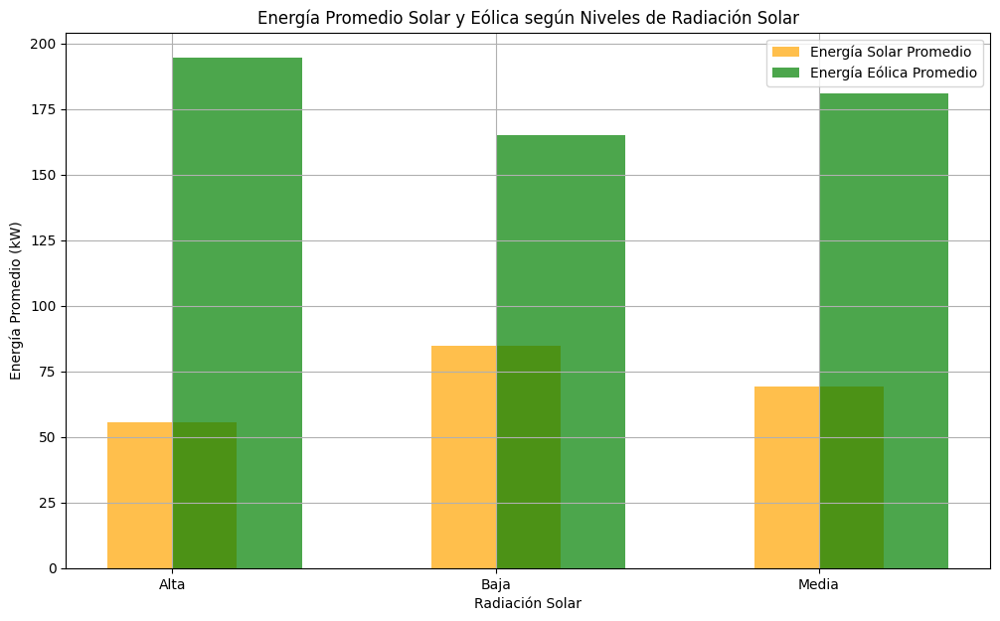

In [ ]:
# Agrupar por nivel de radiación solar y graficar la energía solar y eólica promedio
grouped_by_radiation = results_df.groupby('Radiación solar').agg(
    {'Energía óptima solar (kW)': 'mean', 'Energía óptima eólica (kW)': 'mean'}).reset_index()

# Graficar
plt.figure(figsize=(12, 7))
plt.bar(grouped_by_radiation['Radiación solar'], grouped_by_radiation['Energía óptima solar (kW)'],
        label='Energía Solar Promedio', alpha=0.7, width=0.4, color='orange', align='center')
plt.bar(grouped_by_radiation['Radiación solar'], grouped_by_radiation['Energía óptima eólica (kW)'],
        label='Energía Eólica Promedio', alpha=0.7, width=0.4, color='green', align='edge')

# Mejorar título y etiquetas
plt.title('Energía Promedio Solar y Eólica según Niveles de Radiación Solar')
plt.xlabel('Radiación Solar')
plt.ylabel('Energía Promedio (kW)')
plt.legend()
plt.grid(True)
plt.show()


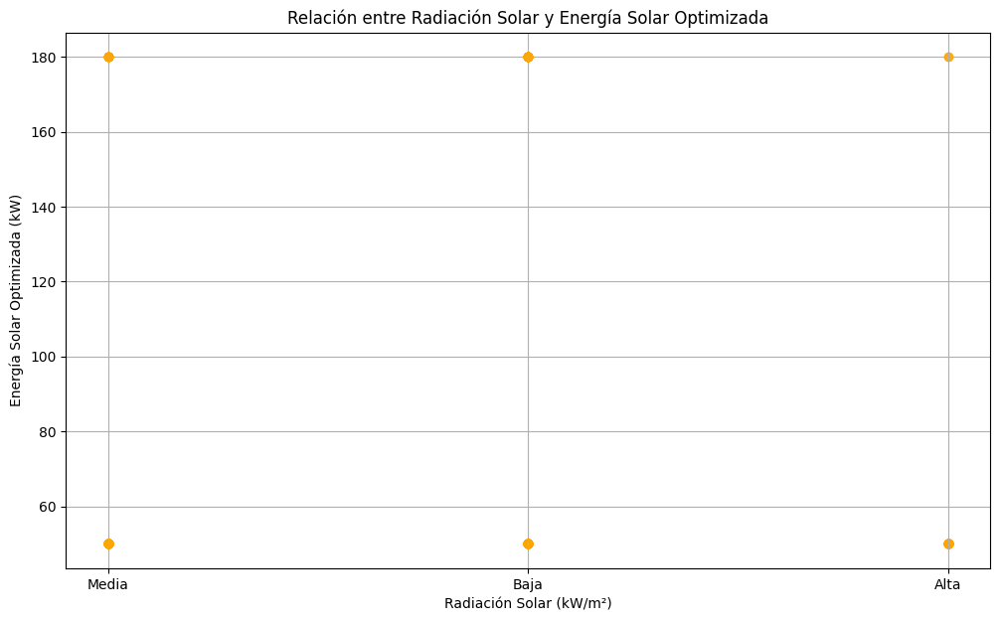

In [ ]:
# Graficar la relación entre la radiación solar y la energía solar optimizada
plt.figure(figsize=(12, 7))
plt.scatter(results_df['Radiación solar'], results_df['Energía óptima solar (kW)'], color='orange', alpha=0.7)
plt.title('Relación entre Radiación Solar y Energía Solar Optimizada')
plt.xlabel('Radiación Solar (kW/m²)')
plt.ylabel('Energía Solar Optimizada (kW)')
plt.grid(True)
plt.show()


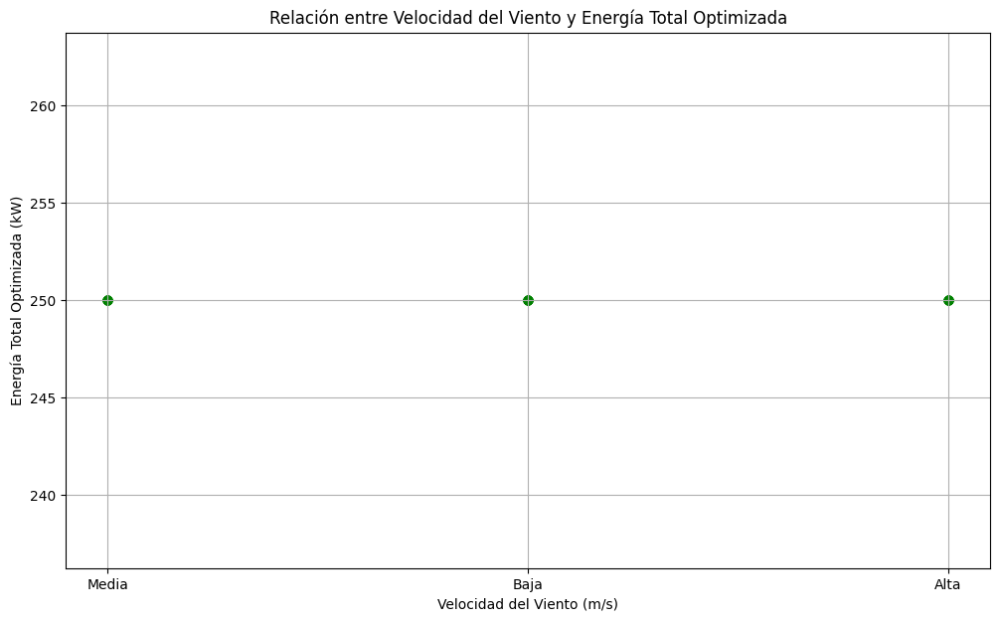

In [ ]:
# Graficar la relación entre la velocidad del viento y la energía total optimizada
plt.figure(figsize=(12, 7))
plt.scatter(results_df['Velocidad del viento'], results_df['Energía total (kW)'], color='green', alpha=0.7)
plt.title('Relación entre Velocidad del Viento y Energía Total Optimizada')
plt.xlabel('Velocidad del Viento (m/s)')
plt.ylabel('Energía Total Optimizada (kW)')
plt.grid(True)
plt.show()


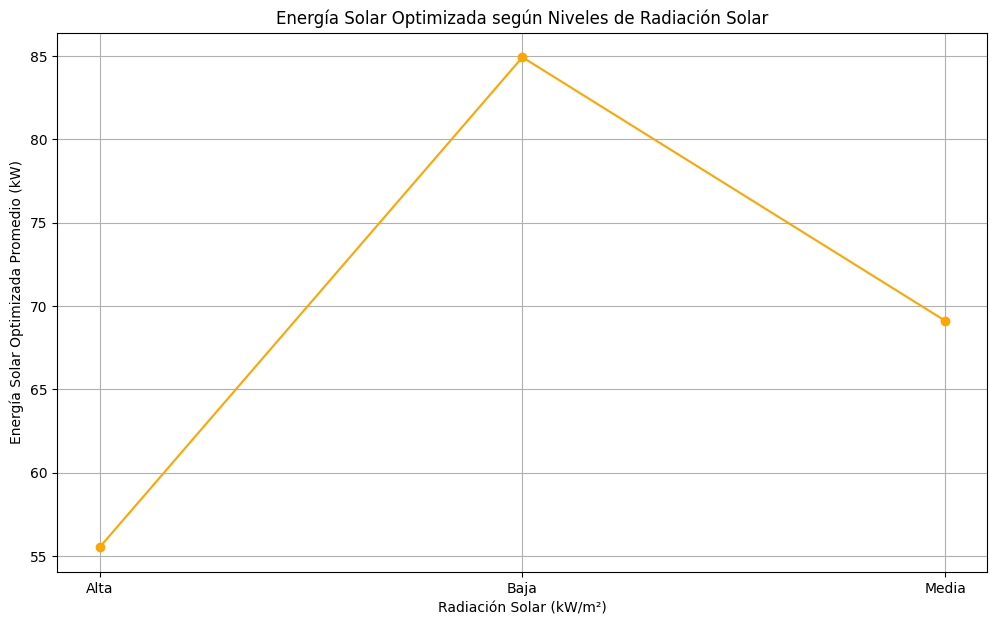

In [ ]:
# Agrupar por nivel de radiación solar y calcular el promedio de energía solar optimizada
grouped_by_radiation = results_df.groupby('Radiación solar').agg({'Energía óptima solar (kW)': 'mean'}).reset_index()

# Graficar
plt.figure(figsize=(12, 7))
plt.plot(grouped_by_radiation['Radiación solar'], grouped_by_radiation['Energía óptima solar (kW)'], marker='o', color='orange')
plt.title('Energía Solar Optimizada según Niveles de Radiación Solar')
plt.xlabel('Radiación Solar (kW/m²)')
plt.ylabel('Energía Solar Optimizada Promedio (kW)')
plt.grid(True)
plt.show()


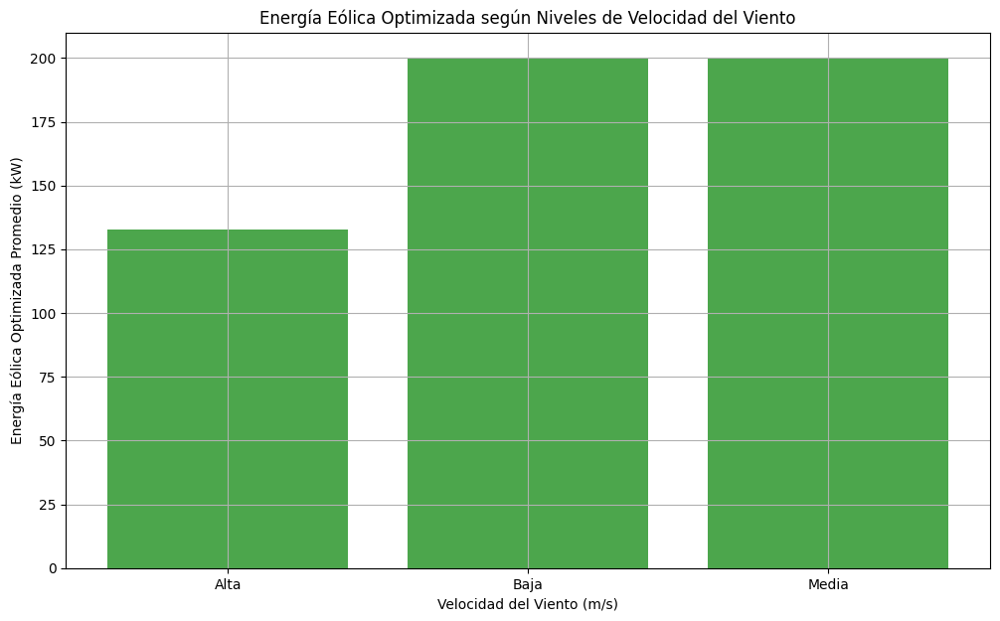

In [ ]:
# Agrupar por nivel de velocidad del viento y calcular el promedio de energía eólica optimizada
grouped_by_wind_speed = results_df.groupby('Velocidad del viento').agg({'Energía óptima eólica (kW)': 'mean'}).reset_index()

# Graficar
plt.figure(figsize=(12, 7))
plt.bar(grouped_by_wind_speed['Velocidad del viento'], grouped_by_wind_speed['Energía óptima eólica (kW)'], color='green', alpha=0.7)
plt.title('Energía Eólica Optimizada según Niveles de Velocidad del Viento')
plt.xlabel('Velocidad del Viento (m/s)')
plt.ylabel('Energía Eólica Optimizada Promedio (kW)')
plt.grid(True)
plt.show()


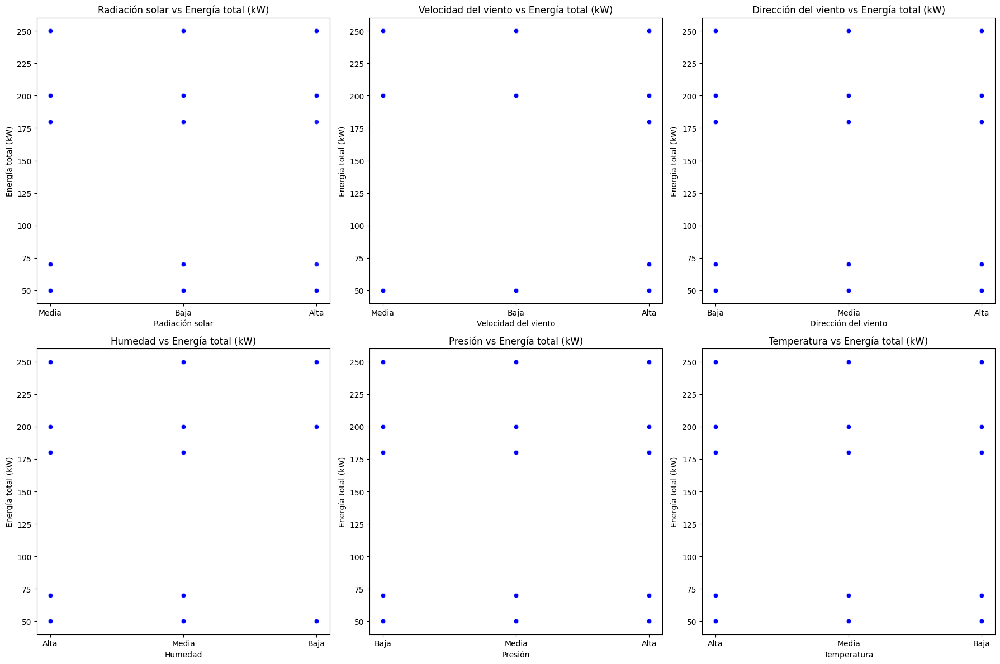

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Variables de entrada
input_variables = ['Radiación solar', 'Velocidad del viento', 'Dirección del viento', 'Humedad', 'Presión', 'Temperatura']

# Energías optimizadas
output_variables = ['Energía óptima solar (kW)', 'Energía óptima eólica (kW)', 'Energía total (kW)']

# Crear una figura con subgráficas
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))

# Iterar sobre las variables de entrada y las salidas
for i, input_var in enumerate(input_variables):
    for j, output_var in enumerate(output_variables):
        ax = axes[i // 3, i % 3]  # Distribuir en una cuadrícula de subgráficas
        sns.scatterplot(data=results_df, x=input_var, y=output_var, ax=ax, color='blue', alpha=0.7)
        ax.set_title(f'{input_var} vs {output_var}')
        ax.set_xlabel(input_var)
        ax.set_ylabel(output_var)

# Ajustar el espacio entre las subgráficas
plt.tight_layout()
plt.show()


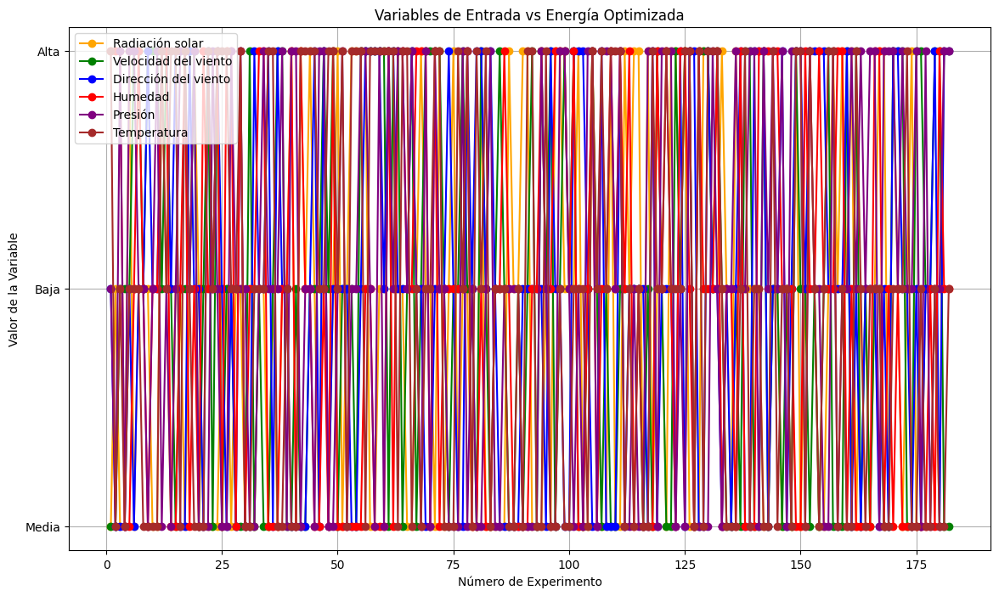

In [ ]:
plt.figure(figsize=(14, 8))

# Colores y estilos para las líneas
colors = ['orange', 'green', 'blue', 'red', 'purple', 'brown']
labels = ['Radiación solar', 'Velocidad del viento', 'Dirección del viento', 'Humedad', 'Presión', 'Temperatura']

# Graficar las líneas para cada entrada y su relación con las energías optimizadas
for i, input_var in enumerate(input_variables):
    plt.plot(results_df['Experimento'], results_df[input_var], marker='o', linestyle='-', color=colors[i], label=f'{input_var}')

# Agregar títulos y leyenda
plt.title('Variables de Entrada vs Energía Optimizada')
plt.xlabel('Número de Experimento')
plt.ylabel('Valor de la Variable')
plt.grid(True)
plt.legend(loc='upper left')

plt.show()


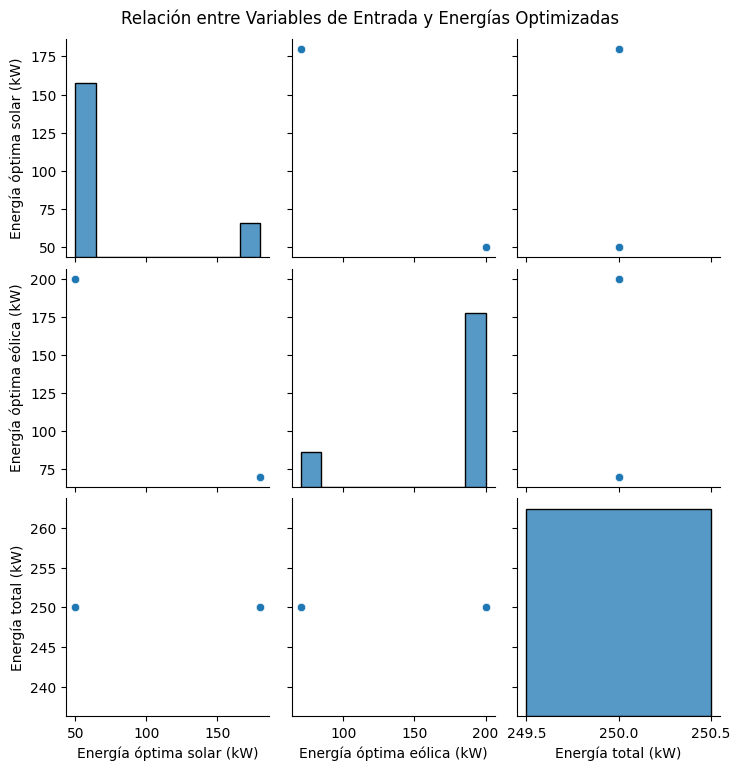

In [ ]:
import seaborn as sns

# Crear un dataframe solo con las variables de entrada y las salidas optimizadas
plot_df = results_df[['Radiación solar', 'Velocidad del viento', 'Dirección del viento',
                      'Humedad', 'Presión', 'Temperatura',
                      'Energía óptima solar (kW)', 'Energía óptima eólica (kW)', 'Energía total (kW)']]

# Crear un pairplot para visualizar todas las relaciones
sns.pairplot(plot_df)
plt.suptitle('Relación entre Variables de Entrada y Energías Optimizadas', y=1.02)
plt.show()



--- Estadísticas Descriptivas ---
       Experimento  Energía óptima eólica (kW)  Energía óptima solar (kW)  \
count   182.000000                  182.000000                 182.000000   
mean     91.500000                  178.571429                  71.428571   
std      52.683014                   48.367183                  48.367183   
min       1.000000                   70.000000                  50.000000   
25%      46.250000                  200.000000                  50.000000   
50%      91.500000                  200.000000                  50.000000   
75%     136.750000                  200.000000                  50.000000   
max     182.000000                  200.000000                 180.000000   

       Energía total (kW)  
count               182.0  
mean                250.0  
std                   0.0  
min                 250.0  
25%                 250.0  
50%                 250.0  
75%                 250.0  
max                 250.0  

--- Distribución d

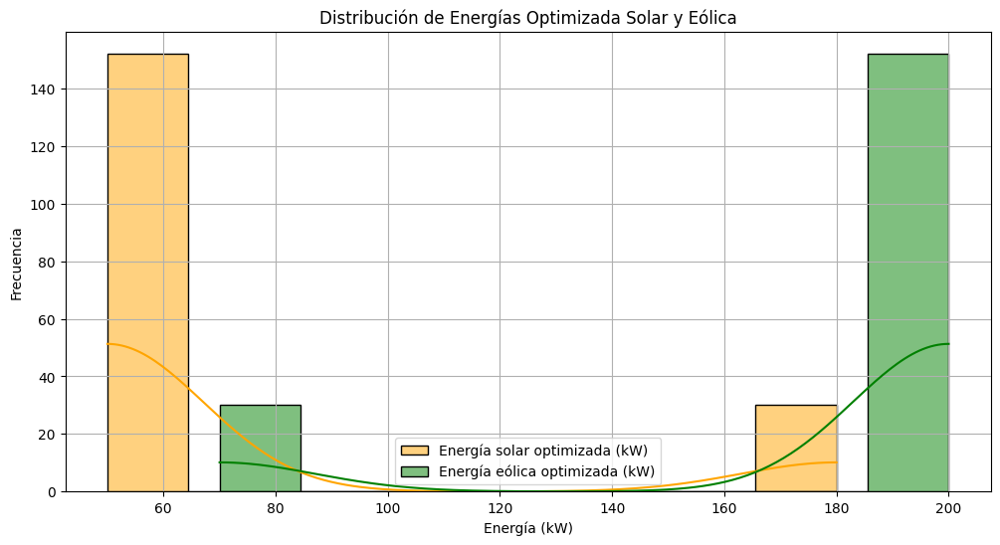


--- Comparación de medias entre las energías optimizadas solar y eólica ---
Promedio de energía solar optimizada: 71.43 kW
Promedio de energía eólica optimizada: 178.57 kW
Valor de t para la comparación entre energía solar y eólica: -21.13
Valor p: 0.00000

--- Evaluación de dispersión entre variables de entrada y energía solar optimizada ---


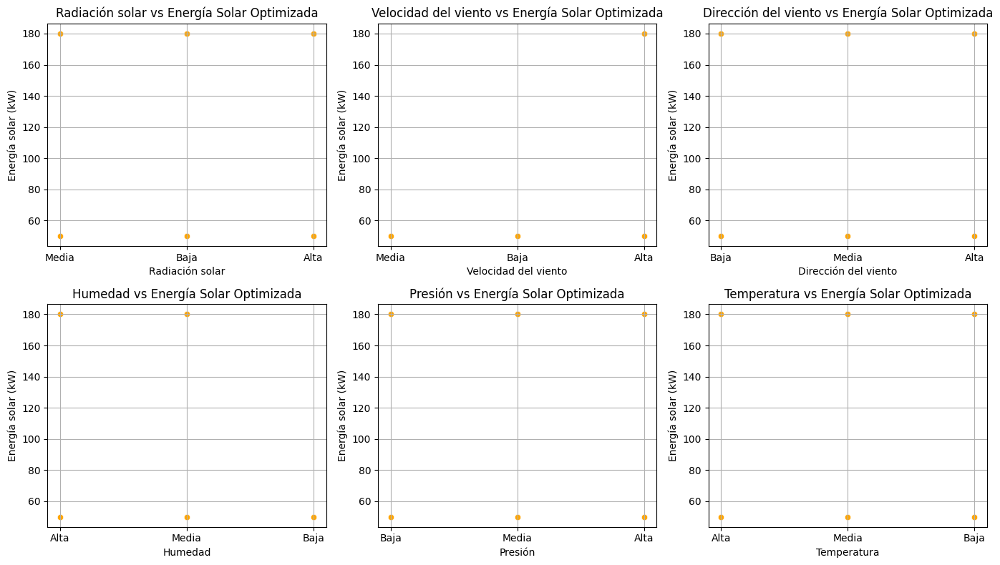


--- Evaluación de dispersión entre variables de entrada y energía eólica optimizada ---


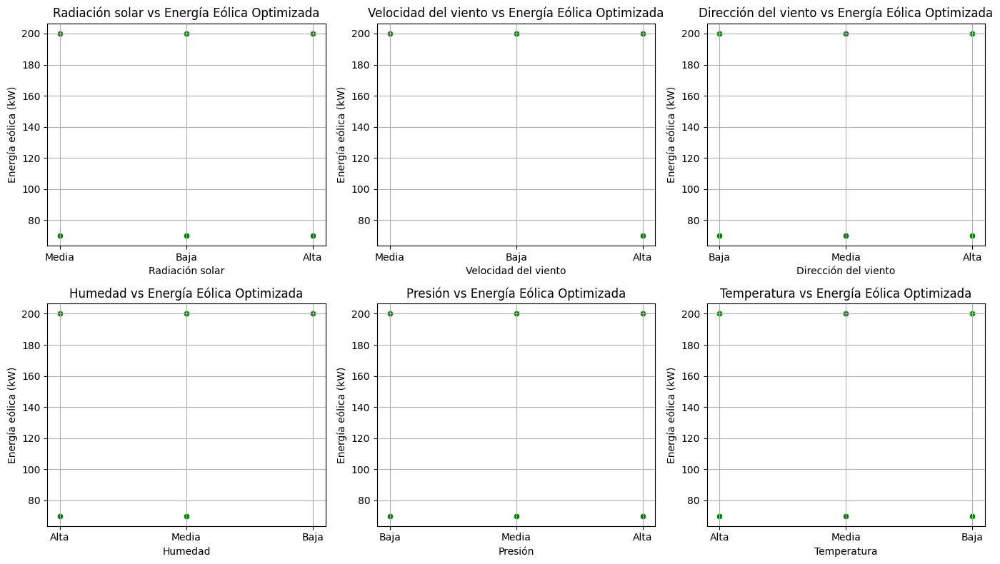

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Asumimos que results_df es tu DataFrame con los resultados

# 1. Estadísticas Descriptivas
print("\n--- Estadísticas Descriptivas ---")
desc_stats = results_df.describe()
print(desc_stats)

# 3. Distribución de la energía optimizada solar y eólica
print("\n--- Distribución de la energía optimizada solar y eólica ---")
plt.figure(figsize=(12, 6))
sns.histplot(results_df['Energía óptima solar (kW)'], color='orange', kde=True, label='Energía solar optimizada (kW)')
sns.histplot(results_df['Energía óptima eólica (kW)'], color='green', kde=True, label='Energía eólica optimizada (kW)')
plt.title('Distribución de Energías Optimizada Solar y Eólica')
plt.xlabel('Energía (kW)')
plt.ylabel('Frecuencia')
plt.legend()
plt.grid(True)
plt.show()

# 4. Comparación de medias entre las energías optimizadas (solar y eólica)
print("\n--- Comparación de medias entre las energías optimizadas solar y eólica ---")
mean_solar = results_df['Energía óptima solar (kW)'].mean()
mean_eolica = results_df['Energía óptima eólica (kW)'].mean()
print(f"Promedio de energía solar optimizada: {mean_solar:.2f} kW")
print(f"Promedio de energía eólica optimizada: {mean_eolica:.2f} kW")

# Realizamos un t-test para ver si la diferencia entre las medias es significativa
t_stat, p_value = stats.ttest_ind(results_df['Energía óptima solar (kW)'], results_df['Energía óptima eólica (kW)'])
print(f"Valor de t para la comparación entre energía solar y eólica: {t_stat:.2f}")
print(f"Valor p: {p_value:.5f}")


# 6. Evaluación de la dispersión de las variables de entrada con respecto a la energía solar optimizada
print("\n--- Evaluación de dispersión entre variables de entrada y energía solar optimizada ---")
plt.figure(figsize=(14, 8))
for i, input_var in enumerate(input_variables):
    plt.subplot(2, 3, i+1)
    sns.scatterplot(data=results_df, x=input_var, y='Energía óptima solar (kW)', color='orange')
    plt.title(f'{input_var} vs Energía Solar Optimizada')
    plt.xlabel(input_var)
    plt.ylabel('Energía solar (kW)')
    plt.grid(True)

plt.tight_layout()
plt.show()

# 7. Evaluación de la dispersión de las variables de entrada con respecto a la energía eólica optimizada
print("\n--- Evaluación de dispersión entre variables de entrada y energía eólica optimizada ---")
plt.figure(figsize=(14, 8))
for i, input_var in enumerate(input_variables):
    plt.subplot(2, 3, i+1)
    sns.scatterplot(data=results_df, x=input_var, y='Energía óptima eólica (kW)', color='green')
    plt.title(f'{input_var} vs Energía Eólica Optimizada')
    plt.xlabel(input_var)
    plt.ylabel('Energía eólica (kW)')
    plt.grid(True)

plt.tight_layout()
plt.show()




In [ ]:
# Renombrar columnas para eliminar espacios y caracteres especiales
results_df.columns = results_df.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '')

# Verifica que las columnas se hayan renombrado correctamente
print(results_df.columns)

# Ahora puedes correr el ANOVA de nuevo:
anova_results = {}

for var in ['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura']:
    formula = f'Energía_óptima_solar_kW ~ C({var})'
    model = ols(formula, data=results_df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    anova_results[var] = anova_table['PR(>F)'][0]

# Imprimir los resultados de ANOVA
print("Resultados de ANOVA (valor p):")
for var, p_value in anova_results.items():
    print(f"{var}: {p_value:.4f}")


Index(['Experimento', 'Radiación_solar', 'Temperatura', 'Humedad',
       'Velocidad_del_viento', 'Dirección_del_viento', 'Presión',
       'Energía_óptima_eólica_kW', 'Energía_óptima_solar_kW',
       'Energía_total_kW'],
      dtype='object')
Resultados de ANOVA (valor p):
Radiación_solar: 0.0049
Velocidad_del_viento: 0.0000
Dirección_del_viento: 0.2843
Humedad: 0.0000
Presión: 0.9228
Temperatura: 0.6968


<ipython-input-64-cb8907e03110>:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  anova_results[var] = anova_table['PR(>F)'][0]
<ipython-input-64-cb8907e03110>:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  anova_results[var] = anova_table['PR(>F)'][0]
<ipython-input-64-cb8907e03110>:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  anova_results[var] = anova_table['PR(>F)'][0]
<ipython-input-64-cb8907e03110>:14: FutureWarning: S

In [ ]:
# Ajustar la forma de acceder al valor de p
anova_results = {}

for var in ['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura']:
    formula = f'Energía_óptima_solar_kW ~ C({var})'
    model = ols(formula, data=results_df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)

    # Acceder por posición usando iloc
    anova_results[var] = anova_table['PR(>F)'].iloc[0]

# Imprimir los resultados de ANOVA
print("Resultados de ANOVA (valor p):")
for var, p_value in anova_results.items():
    print(f"{var}: {p_value:.4f}")


Resultados de ANOVA (valor p):
Radiación_solar: 0.0049
Velocidad_del_viento: 0.0000
Dirección_del_viento: 0.2843
Humedad: 0.0000
Presión: 0.9228
Temperatura: 0.6968


In [ ]:
import pandas as pd
import statsmodels.api as sm

# Convertir las columnas de tipo 'object' a numérico (si es posible)
results_df['Radiación_solar'] = pd.to_numeric(results_df['Radiación_solar'], errors='coerce')
results_df['Temperatura'] = pd.to_numeric(results_df['Temperatura'], errors='coerce')
results_df['Velocidad_del_viento'] = pd.to_numeric(results_df['Velocidad_del_viento'], errors='coerce')
results_df['Humedad'] = pd.to_numeric(results_df['Humedad'], errors='coerce')
results_df['Presión'] = pd.to_numeric(results_df['Presión'], errors='coerce')

# Verificar si hay valores nulos en las columnas de interés
print(results_df[['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura', 'Energía_óptima_solar_kW']].isnull().sum())

# Eliminar filas con valores nulos
results_df = results_df.dropna(subset=['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura', 'Energía_óptima_solar_kW'])

# Codificar las variables categóricas (si es necesario)
X = results_df[['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura']]

# Convertir 'Dirección_del_viento' en variable dummy (si es categórica)
X = pd.get_dummies(X, drop_first=True)

# Agregar una constante para el término de intersección (intercepto)
X = sm.add_constant(X)

# Variable dependiente: Energía óptima solar
y = results_df['Energía_óptima_solar_kW']

# Ajustar el modelo de regresión lineal múltiple
model = sm.OLS(y, X).fit()

# Imprimir los resultados del modelo
print(model.summary())



Radiación_solar            182
Velocidad_del_viento       182
Dirección_del_viento         0
Humedad                    182
Presión                    182
Temperatura                182
Energía_óptima_solar_kW      0
dtype: int64


ValueError: zero-size array to reduction operation maximum which has no identity

In [ ]:
import statsmodels.api as sm

# Definir las variables independientes (factores climáticos) y la dependiente (energía solar optimizada)
X = results_df[['Radiación_solar', 'Velocidad_del_viento', 'Dirección_del_viento', 'Humedad', 'Presión', 'Temperatura']]

# Asegurarnos de que 'Dirección_del_viento' esté codificada correctamente como variable categórica
X = pd.get_dummies(X, drop_first=True)

# Agregar una constante para el término de intersección (intercepto) en el modelo
X = sm.add_constant(X)

# Variable dependiente: energía solar optimizada
y = results_df['Energía_óptima_solar_kW']

# Ajustar el modelo de regresión lineal múltiple
model = sm.OLS(y, X).fit()

# Imprimir los resultados del modelo
print(model.summary())


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Supongamos que results_df es tu DataFrame con los resultados

# 1. Análisis de Varianza (ANOVA)
print("\n--- Análisis de Varianza (ANOVA) ---")

# Realizamos ANOVA para ver la relación entre las variables climáticas y la energía solar optimizada
# Usamos la variable 'Energía óptima solar (kW)' como dependiente y las variables climáticas como independientes.

# Primero, transformamos las variables categóricas a factores de tipo 'categorical' para ANOVA
anova_results = {}

for var in ['Radiación solar', 'Velocidad del viento', 'Dirección del viento', 'Humedad', 'Presión', 'Temperatura']:
    formula = f'Energía óptima solar (kW) ~ C({var})'
    model = ols(formula, data=results_df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    anova_results[var] = anova_table['PR(>F)'][0]

# Imprimir los resultados de ANOVA
print("Resultados de ANOVA (valor p):")
for var, p_value in anova_results.items():
    print(f"{var}: {p_value:.4f}")

# Conclusión: Si el valor p es menor a 0.05, podemos decir que la variable tiene un impacto significativo en la energía solar.

# 2. Regresión Múltiple
print("\n--- Regresión Múltiple ---")

# Creamos un modelo de regresión múltiple utilizando las variables climáticas como independientes y la energía solar como dependiente.
X = results_df[['Radiación solar', 'Velocidad del viento', 'Dirección del viento', 'Humedad', 'Presión', 'Temperatura']]
y_solar = results_df['Energía óptima solar (kW)']

# Añadir una constante para el término de intercepción
X = sm.add_constant(X)

# Ajustar el modelo de regresión
model_solar = sm.OLS(y_solar, X).fit()

# Mostrar el resumen del modelo
print("\nResumen de la Regresión Múltiple para Energía Solar:")
print(model_solar.summary())

# 3. Curvas de Respuesta
print("\n--- Curvas de Respuesta ---")

# Graficamos las curvas de respuesta para cada variable climática con respecto a la energía solar optimizada

plt.figure(figsize=(12, 8))

# Graficamos para cada variable climática
for i, var in enumerate(['Radiación solar', 'Velocidad del viento', 'Dirección del viento', 'Humedad', 'Presión', 'Temperatura']):
    plt.subplot(2, 3, i+1)
    sns.lineplot(x=results_df[var], y=results_df['Energía óptima solar (kW)'], marker='o', color='orange')
    plt.title(f'Curva de Respuesta: {var}')
    plt.xlabel(var)
    plt.ylabel('Energía solar (kW)')
    plt.grid(True)

plt.tight_layout()
plt.show()

# Similarmente, puedes hacer esto para la energía eólica optimizada si deseas graficar esas curvas.



--- Análisis de Varianza (ANOVA) ---


SyntaxError: invalid syntax. Perhaps you forgot a comma? (<unknown>, line 1)

**Simulaciones escenarios**

In [ ]:
# Simulación de diferentes escenarios de radiación y velocidad del viento
radiation_scenarios = [700, 800, 900]  # Ejemplo de diferentes condiciones de radiación
wind_speed_scenarios = [12, 15, 18]    # Ejemplo de diferentes condiciones de velocidad de viento

for radiation in radiation_scenarios:
    for wind_speed in wind_speed_scenarios:
        ps = solar_production(radiation, 25, 60)  # Ejemplo: temperatura y humedad constantes
        pw = wind_production(wind_speed, 180, 1013)

        c = -np.array([alpha * ps, beta * pw])
        result = linprog(c, A_ub=A, b_ub=b, bounds=(0, None))

        if result.success:
            print(f"Radiación: {radiation} W/m², Velocidad del viento: {wind_speed} m/s")
            print(f"   Energía óptima eólica: {result.x[0]:.2f} kW")
            print(f"   Energía óptima solar: {result.x[1]:.2f} kW")
            print(f"   Energía total producida: {result.x[0] + result.x[1]:.2f} kW")
        else:
            print("   La optimización no encontró una solución para este escenario.")


Radiación: 700 W/m², Velocidad del viento: 12 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 700 W/m², Velocidad del viento: 15 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 700 W/m², Velocidad del viento: 18 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 800 W/m², Velocidad del viento: 12 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 800 W/m², Velocidad del viento: 15 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 800 W/m², Velocidad del viento: 18 m/s
   Energía óptima eólica: 170.00 kW
   Energía óptima solar: 180.00 kW
   Energía total producida: 350.00 kW
Radiación: 900 W/m², Velocidad del viento: 12 

In [ ]:
# Dividir cada valor entre 100 y guardar el resultado en P_wind
P_wind2 = [valor / 100 for valor in P_wind]

print(P_wind2)

[111.4649555774926, 0.195213678183613, 70.96229022704837, 0.007761500493583416, 203.27369792694964, 8.55257650542942, 28.315137216189534, 0.9129891411648569, 13.164269046396837]


In [ ]:
print(P_solar)

[584.8199999999999, 45.539999999999935, 88.19999999999999, 0.0, 206.54999999999998, 126.35999999999996, 855.3600000000001, 119.87999999999998, 7.307999999999998]


Cantidad de experimentos donde la optimización cumple la demanda: 432
Cantidad de experimentos donde la optimización no cumple la demanda: 297
Cantidad de experimentos donde la optimización es mejor que el valor real: 432


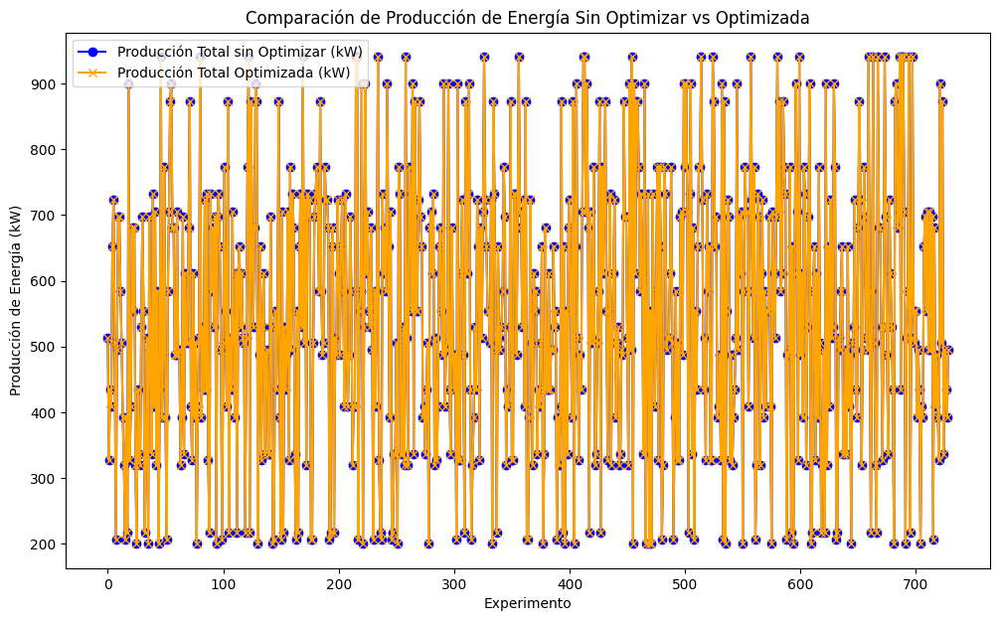

In [58]:
import numpy as np
import pandas as pd
from scipy.optimize import linprog
import matplotlib.pyplot as plt
import itertools

# Definir los niveles de los factores
niveles = ['Baja', 'Media', 'Alta']

# Variables (factores): Radiación solar, Temperatura, Humedad, Velocidad del viento, Dirección del viento y Presión
factores = ['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']

# Generar todas las combinaciones posibles de los niveles de los factores (diseño factorial completo)
combinaciones = list(itertools.product(niveles, repeat=len(factores)))

# Convertir la lista de combinaciones en un DataFrame
design_df = pd.DataFrame(combinaciones, columns=factores)

# Crear un diseño fraccional 1/4 (tomar el 25% de los experimentos)
frac_design = design_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Asignar valores numéricos a cada nivel para el cálculo
def asignar_valor_nivel(nivel, factor):
    if factor == 'Radiación solar':
        return {'Baja': 200, 'Media': 500, 'Alta': 800}[nivel]
    elif factor == 'Temperatura':
        return {'Baja': 10, 'Media': 25, 'Alta': 35}[nivel]
    elif factor == 'Humedad':
        return {'Baja': 0.3, 'Media': 0.6, 'Alta': 0.9}[nivel]
    elif factor == 'Velocidad del viento':
        return {'Baja': 3, 'Media': 8, 'Alta': 15}[nivel]
    elif factor == 'Dirección del viento':
        return {'Baja': 0, 'Media': 180, 'Alta': 360}[nivel]
    elif factor == 'Presión':
        return {'Baja': 1000, 'Media': 1013, 'Alta': 1025}[nivel]
    return 0

# Convertir los niveles a valores numéricos en el DataFrame
for factor in factores:
    frac_design[factor] = frac_design[factor].apply(lambda x: asignar_valor_nivel(x, factor))

# Parámetro de demanda
demanda = 500  # en kW

# Funciones de producción solar y eólica basadas en los valores asignados
def produccion_solar(row):
    # Producción en función de radiación y temperatura
    irradiancia = row['Radiación solar']
    temperatura = row['Temperatura']
    return irradiancia * max(0, (1 - 0.005 * (temperatura - 25))) * 540 / 800

def produccion_eolica(row):
    # Producción en función de velocidad del viento
    velocidad_viento = row['Velocidad del viento']
    if velocidad_viento < 3 or velocidad_viento > 25:
        return 0
    elif velocidad_viento <= 15:
        return velocidad_viento / 15 * 360
    else:
        return 360

# Calcular la producción sin optimizar para cada experimento
frac_design["produccion_solar"] = frac_design.apply(produccion_solar, axis=1)
frac_design["produccion_eolica"] = frac_design.apply(produccion_eolica, axis=1)
frac_design["produccion_total_sin_optimizar"] = frac_design["produccion_solar"] + frac_design["produccion_eolica"]

# Optimización para cada experimento
produccion_total_optimizada = []
cumple_demanda = 0
no_cumple_demanda = 0
mejora_optimizada = 0

for index, row in frac_design.iterrows():
    c = [-1, -1]  # Maximizar la producción total
    A = [
        [1, 0],       # Límite solar
        [0, 1],       # Límite eólico
        [-1, -1]      # La producción total no debe exceder la demanda
    ]
    b = [row["produccion_solar"], row["produccion_eolica"], -demanda]

    bounds = [(0, row["produccion_solar"]), (0, row["produccion_eolica"])]

    result = linprog(c, A_ub=A, b_ub=b, bounds=bounds, method='highs')
    if result.success:
        produccion_optimizada = result.x[0] + result.x[1]
        produccion_total_optimizada.append(produccion_optimizada)
        if produccion_optimizada >= demanda:
            cumple_demanda += 1
        else:
            no_cumple_demanda += 1

        # Ajuste de lógica para considerar una mejora marginal (>= en lugar de >)
        if produccion_optimizada >= row["produccion_total_sin_optimizar"]:
            mejora_optimizada += 1
    else:
        produccion_total_optimizada.append(row["produccion_total_sin_optimizar"])
        no_cumple_demanda += 1

# Añadir resultados de producción optimizada a la DataFrame
frac_design["produccion_total_optimizada"] = produccion_total_optimizada

# Imprimir resultados resumen
print(f"Cantidad de experimentos donde la optimización cumple la demanda: {cumple_demanda}")
print(f"Cantidad de experimentos donde la optimización no cumple la demanda: {no_cumple_demanda}")
print(f"Cantidad de experimentos donde la optimización es mejor que el valor real: {mejora_optimizada}")

# Graficar los resultados
plt.figure(figsize=(12, 7))
plt.plot(frac_design.index, frac_design["produccion_total_sin_optimizar"], 'o-', color='blue', label="Producción Total sin Optimizar (kW)")
plt.plot(frac_design.index, frac_design["produccion_total_optimizada"], 'x-', color='orange', label="Producción Total Optimizada (kW)")
plt.xlabel("Experimento")
plt.ylabel("Producción de Energía (kW)")
plt.legend()
plt.title("Comparación de Producción de Energía Sin Optimizar vs Optimizada")

plt.show()



                           sum_sq     df             F         PR(>F)
C(Radiacion_solar)   2.026257e+07    2.0  1.379336e+05   0.000000e+00
C(Temperatura)       2.191271e+05    2.0  1.491667e+03  4.684478e-256
C(Humedad)           8.922071e-25    2.0  6.073531e-27   1.000000e+00
C(Velocidad_viento)  1.017101e+07    2.0  6.923722e+04   0.000000e+00
C(Direccion_viento)  4.712149e-24    2.0  3.207706e-26   1.000000e+00
C(Presion)           1.104516e-25    2.0  7.518782e-28   1.000000e+00
Residual             5.259052e+04  716.0           NaN            NaN


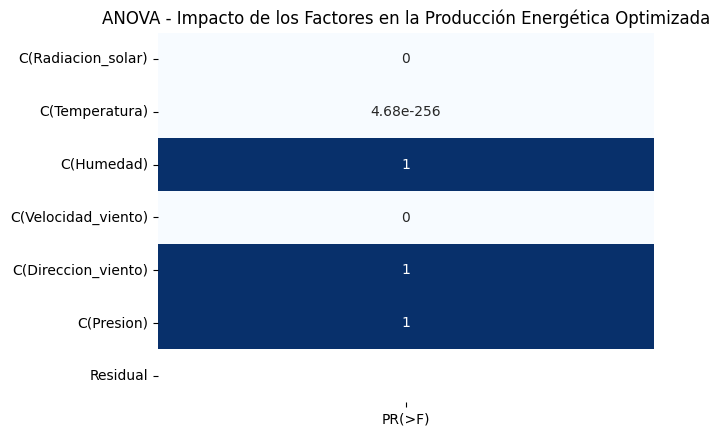

In [63]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns

# Asegúrate de que las columnas estén sin tildes ni caracteres especiales
frac_design.rename(columns={
    'Radiación solar': 'Radiacion_solar',
    'Temperatura': 'Temperatura',
    'Humedad': 'Humedad',
    'Velocidad del viento': 'Velocidad_viento',
    'Dirección del viento': 'Direccion_viento',
    'Presión': 'Presion'
}, inplace=True)

# Crear un DataFrame para ANOVA con las variables que influyen en la producción
frac_design['produccion_optimizada'] = frac_design['produccion_total_optimizada']

# Ajustar el modelo de ANOVA
modelo_anova = ols('produccion_optimizada ~ C(Radiacion_solar) + C(Temperatura) + C(Humedad) + C(Velocidad_viento) + C(Direccion_viento) + C(Presion)', data=frac_design).fit()

# Realizar el análisis de varianza
anova_table = sm.stats.anova_lm(modelo_anova, typ=2)
print(anova_table)

# Graficar los resultados de ANOVA
sns.heatmap(anova_table[['PR(>F)']], annot=True, cmap='Blues', fmt='.3g', cbar=False)
plt.title('ANOVA - Impacto de los Factores en la Producción Energética Optimizada')
plt.show()


                           sum_sq     df             F         PR(>F)
C(Radiacion_solar)   2.026257e+07    2.0  1.379336e+05   0.000000e+00
C(Temperatura)       2.191271e+05    2.0  1.491667e+03  4.684478e-256
C(Humedad)           8.922071e-25    2.0  6.073531e-27   1.000000e+00
C(Velocidad_viento)  1.017101e+07    2.0  6.923722e+04   0.000000e+00
C(Direccion_viento)  4.712149e-24    2.0  3.207706e-26   1.000000e+00
C(Presion)           1.104516e-25    2.0  7.518782e-28   1.000000e+00
Residual             5.259052e+04  716.0           NaN            NaN


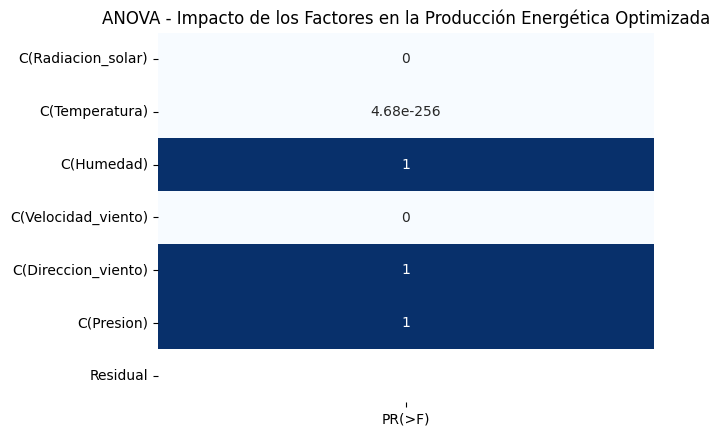


Análisis de los factores más significativos:
C(Radiacion_solar): 0.0000 (Significativo)
C(Velocidad_viento): 0.0000 (Significativo)
C(Temperatura): 0.0000 (Significativo)
C(Humedad): 1.0000 (No significativo)
C(Direccion_viento): 1.0000 (No significativo)
C(Presion): 1.0000 (No significativo)
Residual: nan (No significativo)

Conclusión:
Los factores con valores p menores a 0.05 tienen una influencia significativa en la producción energética optimizada.
Por lo tanto, estos factores deben ser considerados para optimizar la producción energética.


In [69]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import matplotlib.pyplot as plt

# Asegúrate de que las columnas estén sin tildes ni caracteres especiales
frac_design.rename(columns={
    'Radiación solar': 'Radiacion_solar',
    'Temperatura': 'Temperatura',
    'Humedad': 'Humedad',
    'Velocidad del viento': 'Velocidad_viento',
    'Dirección del viento': 'Direccion_viento',
    'Presión': 'Presion'
}, inplace=True)

# Crear un DataFrame para ANOVA con las variables que influyen en la producción
frac_design['produccion_optimizada'] = frac_design['produccion_total_optimizada']

# Ajustar el modelo de ANOVA
modelo_anova = ols('produccion_optimizada ~ C(Radiacion_solar) + C(Temperatura) + C(Humedad) + C(Velocidad_viento) + C(Direccion_viento) + C(Presion)', data=frac_design).fit()

# Realizar el análisis de varianza
anova_table = sm.stats.anova_lm(modelo_anova, typ=2)
print(anova_table)

# Graficar los resultados de ANOVA
sns.heatmap(anova_table[['PR(>F)']], annot=True, cmap='Blues', fmt='.3g', cbar=False)
plt.title('ANOVA - Impacto de los Factores en la Producción Energética Optimizada')
plt.show()

# Análisis de los resultados
# Filtramos los valores p y los ordenamos de menor a mayor
factores = anova_table['PR(>F)']
factores_ordenados = factores.sort_values()

# Mostrar los factores con menor valor p (más significativos)
print("\nAnálisis de los factores más significativos:")
for factor, p_value in factores_ordenados.items():
    if p_value < 0.05:
        print(f"{factor}: {p_value:.4f} (Significativo)")
    else:
        print(f"{factor}: {p_value:.4f} (No significativo)")

# Conclusión
print("\nConclusión:")
print("Los factores con valores p menores a 0.05 tienen una influencia significativa en la producción energética optimizada.")
print("Por lo tanto, estos factores deben ser considerados para optimizar la producción energética.")


Error cuadrático medio (MSE): 73.91206179454831


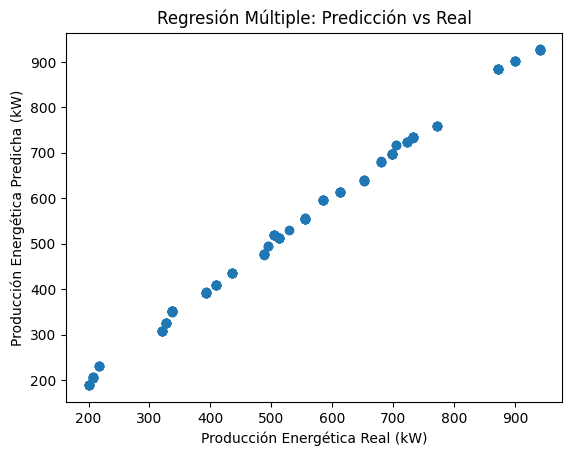

In [60]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Variables independientes (factores) y dependientes (producción optimizada)
X = frac_design[['Radiación solar', 'Temperatura', 'Humedad', 'Velocidad del viento', 'Dirección del viento', 'Presión']]
y = frac_design['produccion_optimizada']

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ajustar el modelo de regresión múltiple
modelo_regresion = LinearRegression()
modelo_regresion.fit(X_train, y_train)

# Predicciones
y_pred = modelo_regresion.predict(X_test)

# Evaluar el modelo
mse = mean_squared_error(y_test, y_pred)
print(f'Error cuadrático medio (MSE): {mse}')

# Graficar resultados
plt.scatter(y_test, y_pred)
plt.xlabel("Producción Energética Real (kW)")
plt.ylabel("Producción Energética Predicha (kW)")
plt.title("Regresión Múltiple: Predicción vs Real")
plt.show()


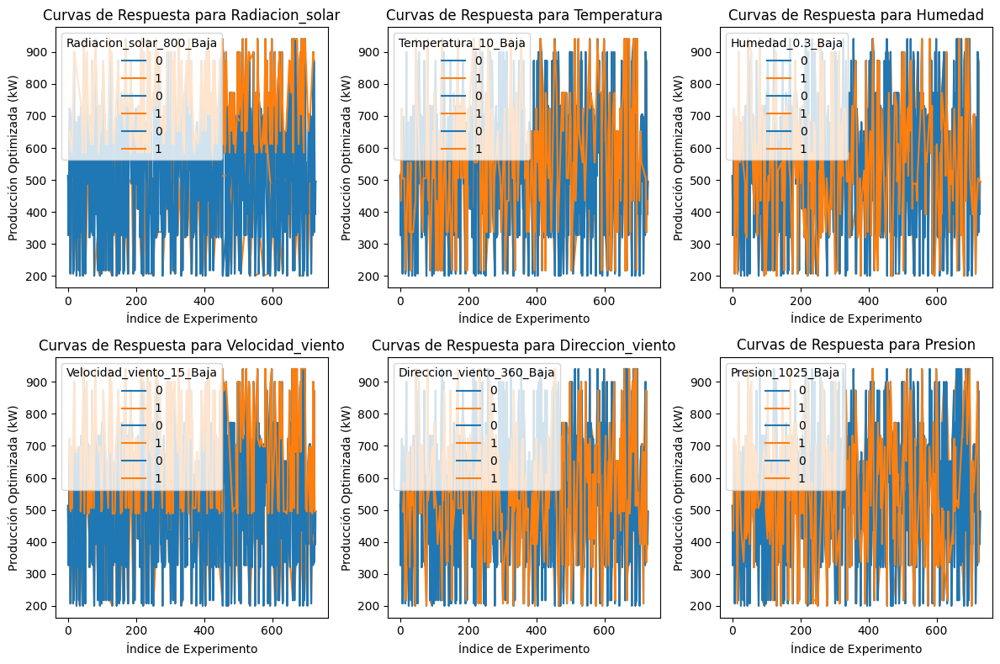

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una función que mapea los niveles de cada factor a su valor binario
def respuesta_factor(df, factor):
    # Asegúrate de que los factores estén en formato adecuado
    niveles = df[factor].unique()
    for nivel in niveles:
        df[f'{factor}_{nivel}_Baja'] = df[factor].apply(lambda x: 1 if x == nivel else 0)
    return df

# Graficar curvas de respuesta para cada factor
factores_analizar = ['Radiacion_solar', 'Temperatura', 'Humedad', 'Velocidad_viento', 'Direccion_viento', 'Presion']
plt.figure(figsize=(12, 8))

for i, factor in enumerate(factores_analizar, 1):
    df_curvas = respuesta_factor(frac_design.copy(), factor)

    # Graficar las curvas de respuesta para cada factor usando hue para cada nivel binarizado
    plt.subplot(2, 3, i)

    # Iteramos sobre cada nueva columna binarizada y la graficamos
    for col in df_curvas.filter(like=f'{factor}_').columns:
        sns.lineplot(x=df_curvas.index, y=df_curvas['produccion_optimizada'], hue=df_curvas[col])

    plt.title(f'Curvas de Respuesta para {factor}')
    plt.xlabel(f'Índice de Experimento')
    plt.ylabel('Producción Optimizada (kW)')

plt.tight_layout()
plt.show()





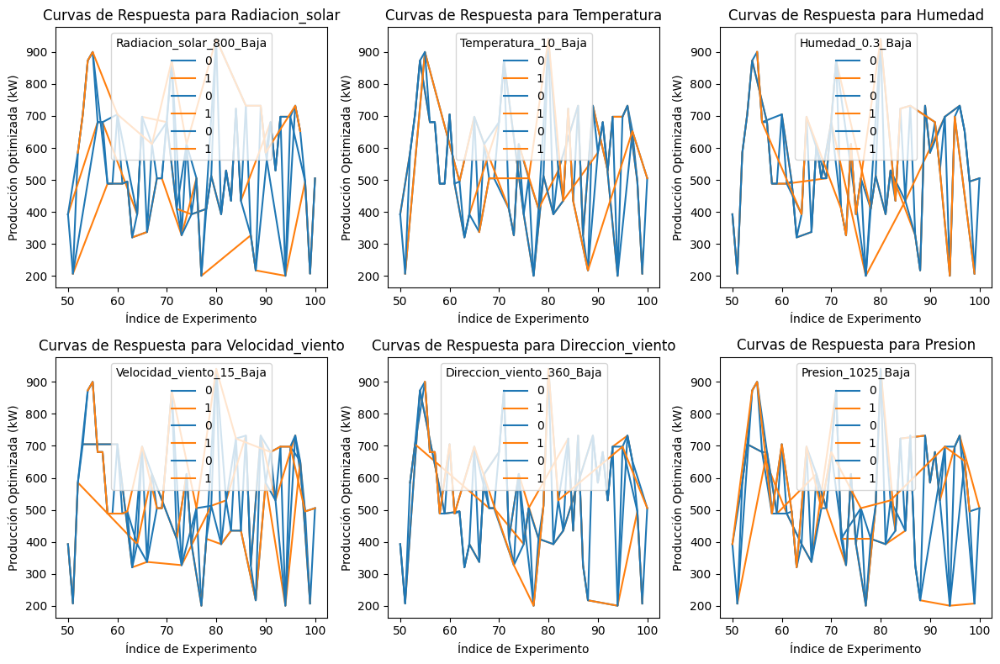

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una función que mapea los niveles de cada factor a su valor binario
def respuesta_factor(df, factor):
    # Asegúrate de que los factores estén en formato adecuado
    niveles = df[factor].unique()
    for nivel in niveles:
        df[f'{factor}_{nivel}_Baja'] = df[factor].apply(lambda x: 1 if x == nivel else 0)
    return df

# Graficar curvas de respuesta para cada factor
factores_analizar = ['Radiacion_solar', 'Temperatura', 'Humedad', 'Velocidad_viento', 'Direccion_viento', 'Presion']
plt.figure(figsize=(12, 8))

# Definir el rango de experimentos a graficar
rango_inicio = 50
rango_fin = 100

for i, factor in enumerate(factores_analizar, 1):
    df_curvas = respuesta_factor(frac_design.copy(), factor)

    # Seleccionar solo el rango de experimentos
    df_curvas_rango = df_curvas[(df_curvas.index >= rango_inicio) & (df_curvas.index <= rango_fin)]

    # Graficar las curvas de respuesta para cada factor usando hue para cada nivel binarizado
    plt.subplot(2, 3, i)

    # Iteramos sobre cada nueva columna binarizada y la graficamos
    for col in df_curvas_rango.filter(like=f'{factor}_').columns:
        sns.lineplot(x=df_curvas_rango.index, y=df_curvas_rango['produccion_optimizada'], hue=df_curvas_rango[col])

    plt.title(f'Curvas de Respuesta para {factor}')
    plt.xlabel(f'Índice de Experimento')
    plt.ylabel('Producción Optimizada (kW)')

plt.tight_layout()
plt.show()


Porcentaje de optimizaciones exitosas: 59.25925925925925%
Porcentaje de optimizaciones no exitosas: 40.74074074074074%


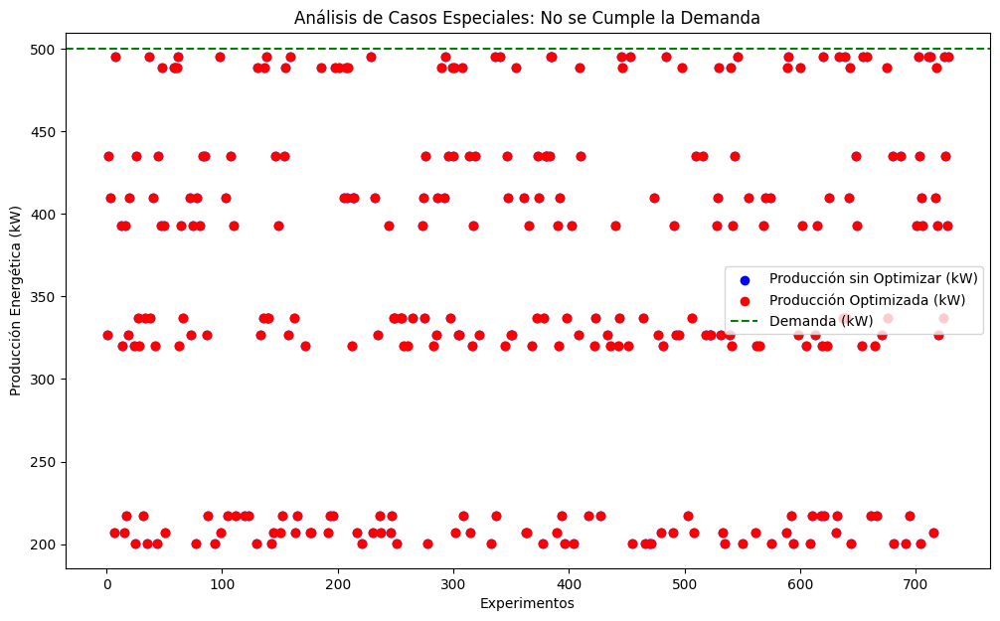

In [62]:
# Filtrar los experimentos donde la optimización no logró cumplir con la demanda
frac_design_no_cumple = frac_design[frac_design['produccion_total_optimizada'] < demanda]

# Calcular el porcentaje de optimizaciones exitosas vs no exitosas
exitosas = len(frac_design[frac_design['produccion_total_optimizada'] >= demanda])
no_exitosas = len(frac_design_no_cumple)
total = len(frac_design)

porcentaje_exitosas = (exitosas / total) * 100
porcentaje_no_exitosas = (no_exitosas / total) * 100

# Mostrar resultados
print(f'Porcentaje de optimizaciones exitosas: {porcentaje_exitosas}%')
print(f'Porcentaje de optimizaciones no exitosas: {porcentaje_no_exitosas}%')

# Graficar los experimentos donde no se cumplió la demanda
plt.figure(figsize=(12, 7))
plt.scatter(frac_design_no_cumple.index, frac_design_no_cumple['produccion_total_sin_optimizar'], label='Producción sin Optimizar (kW)', color='blue')
plt.scatter(frac_design_no_cumple.index, frac_design_no_cumple['produccion_total_optimizada'], label='Producción Optimizada (kW)', color='red')
plt.axhline(y=demanda, color='green', linestyle='--', label='Demanda (kW)')
plt.xlabel('Experimentos')
plt.ylabel('Producción Energética (kW)')
plt.title('Análisis de Casos Especiales: No se Cumple la Demanda')
plt.legend()
plt.show()


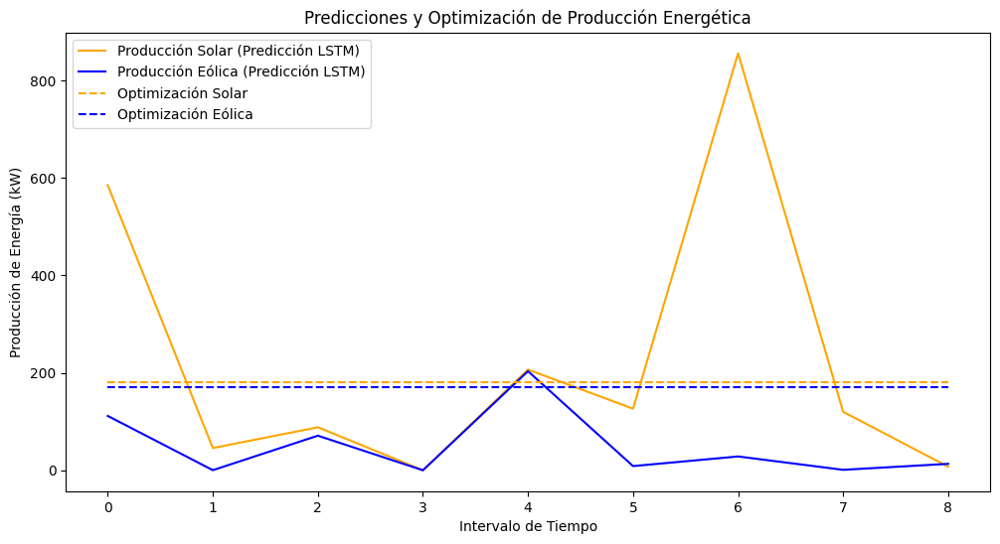

In [ ]:
import matplotlib.pyplot as plt

# Tiempo de intervalos de predicción
time_intervals = np.arange(len(P_solar))

plt.figure(figsize=(12, 6))
plt.plot(time_intervals, P_solar, label="Producción Solar (Predicción LSTM)", color='orange')
plt.plot(time_intervals, P_wind2, label="Producción Eólica (Predicción LSTM)", color='blue')

# Añadimos los resultados optimizados
optimized_solar_power = [result.x[1] for _ in time_intervals]
optimized_wind_power = [result.x[0] for _ in time_intervals]

plt.plot(time_intervals, optimized_solar_power, linestyle='--', label="Optimización Solar", color='orange')
plt.plot(time_intervals, optimized_wind_power, linestyle='--', label="Optimización Eólica", color='blue')

plt.xlabel("Intervalo de Tiempo")
plt.ylabel("Producción de Energía (kW)")
plt.legend()
plt.title("Predicciones y Optimización de Producción Energética")
plt.show()


**INdicadores claves de impacto**

In [ ]:
# Definición de funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    """Calcula la reducción de desperdicio de recursos."""
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_producida, emisiones_por_kwh):
    """Calcula las emisiones de CO2 evitadas."""
    return energia_producida * emisiones_por_kwh

# Ejemplo de uso
energia_util = 350  # kW, ejemplo de energía útil generada
energia_total = 500  # kW, ejemplo de energía total consumida
recursos_renovables = 300  # kW
recursos_no_renovables = 100  # kW
emisiones_por_kwh = 0.5  # kg CO2/kWh

eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

print(f"Eficiencia Energética: {eficiencia:.2f}%")
print(f"Reducción de Desperdicio: {reduccion:.2f}%")
print(f"Emisiones de CO2 Evitadas: {emisiones_ev:.2f} kg")


Eficiencia Energética: 70.00%
Reducción de Desperdicio: 75.00%
Emisiones de CO2 Evitadas: 175.00 kg


Eficiencia Energética: 70.00%
Reducción de Desperdicio: 75.00%
Emisiones de CO2 Evitadas: 175.00 kg


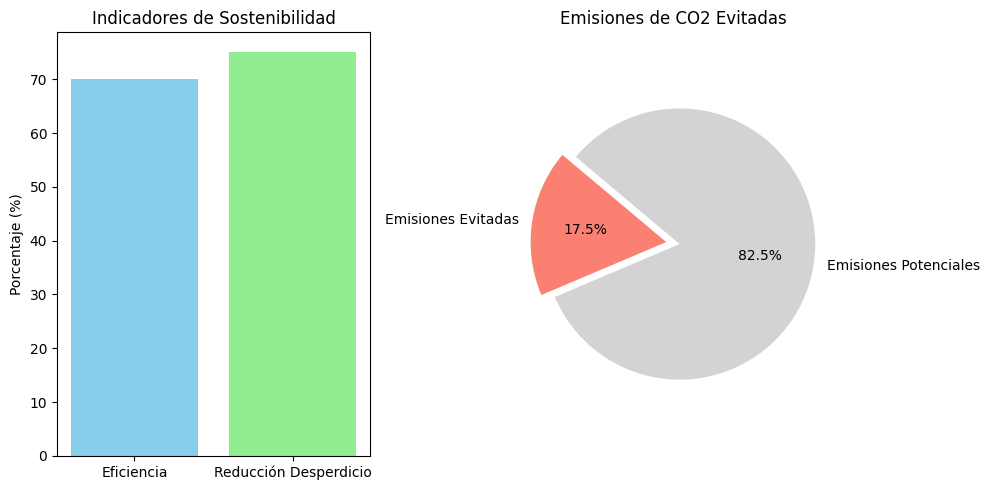

In [ ]:
import matplotlib.pyplot as plt

# Definición de funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    """Calcula la reducción de desperdicio de recursos."""
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_producida, emisiones_por_kwh):
    """Calcula las emisiones de CO2 evitadas."""
    return energia_producida * emisiones_por_kwh

# Ejemplo de uso
energia_util = 350  # kW, ejemplo de energía útil generada
energia_total = 500  # kW, ejemplo de energía total consumida
recursos_renovables = 300  # kW
recursos_no_renovables = 100  # kW
emisiones_por_kwh = 0.5  # kg CO2/kWh

# Cálculos de indicadores
eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

# Imprimir resultados en consola
print(f"Eficiencia Energética: {eficiencia:.2f}%")
print(f"Reducción de Desperdicio: {reduccion:.2f}%")
print(f"Emisiones de CO2 Evitadas: {emisiones_ev:.2f} kg")

# Visualización de resultados
# Gráfico de barras para eficiencia y reducción de desperdicio
indicators = ['Eficiencia', 'Reducción Desperdicio']
values = [eficiencia, reduccion]

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.bar(indicators, values, color=['skyblue', 'lightgreen'])
plt.ylabel('Porcentaje (%)')
plt.title('Indicadores de Sostenibilidad')

# Gráfico circular para emisiones evitadas
plt.subplot(1, 2, 2)
labels = ['Emisiones Evitadas', 'Emisiones Potenciales']
sizes = [emisiones_ev, 1000 - emisiones_ev]  # Suponiendo un total de 1000 kg como ejemplo
colors = ['salmon', 'lightgray']
explode = (0.1, 0)  # "explota" la primera sección del pastel

plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico sea un círculo perfecto
plt.title('Emisiones de CO2 Evitadas')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


Eficiencia Energética: 70.00%
Reducción de Desperdicio: 75.00%
Emisiones de CO2 Evitadas: 175.00 kg


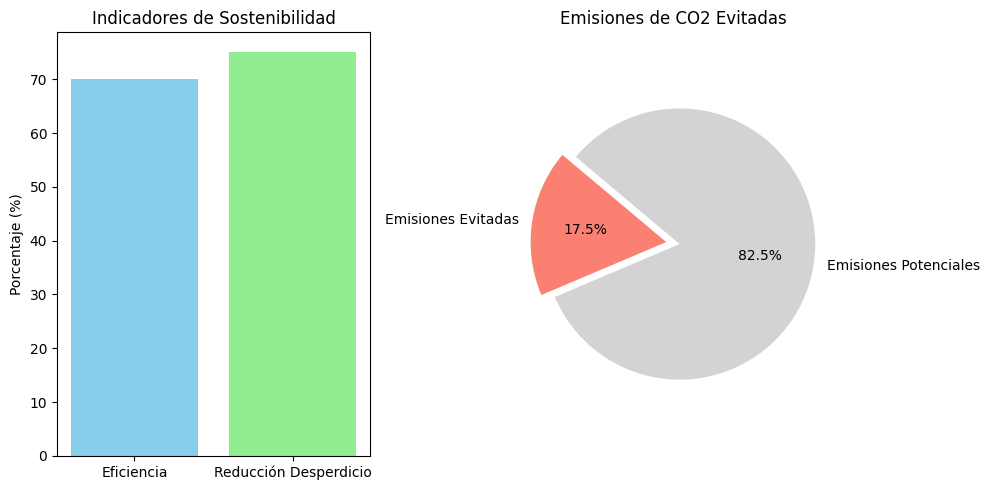

In [71]:
import matplotlib.pyplot as plt

# Definición de funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    """Calcula la reducción de desperdicio de recursos."""
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_producida, emisiones_por_kwh):
    """Calcula las emisiones de CO2 evitadas."""
    return energia_producida * emisiones_por_kwh

# Ejemplo de uso
energia_util = 350  # kW, ejemplo de energía útil generada
energia_total = 500  # kW, ejemplo de energía total consumida
recursos_renovables = 300  # kW
recursos_no_renovables = 100  # kW
emisiones_por_kwh = 0.5  # kg CO2/kWh

# Cálculos de indicadores
eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

# Imprimir resultados en consola
print(f"Eficiencia Energética: {eficiencia:.2f}%")
print(f"Reducción de Desperdicio: {reduccion:.2f}%")
print(f"Emisiones de CO2 Evitadas: {emisiones_ev:.2f} kg")

# Validar que las emisiones evitadas no excedan las emisiones potenciales
emisiones_totales = 1000  # kg CO2 totales (valor de ejemplo)
emisiones_ev = min(emisiones_ev, emisiones_totales)  # Asegurarse de que no exceda

# Visualización de resultados
# Gráfico de barras para eficiencia y reducción de desperdicio
indicators = ['Eficiencia', 'Reducción Desperdicio']
values = [eficiencia, reduccion]

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.bar(indicators, values, color=['skyblue', 'lightgreen'])
plt.ylabel('Porcentaje (%)')
plt.title('Indicadores de Sostenibilidad')

# Gráfico circular para emisiones evitadas
plt.subplot(1, 2, 2)
sizes = [emisiones_ev, emisiones_totales - emisiones_ev]  # Suponiendo un total de 1000 kg como ejemplo
colors = ['salmon', 'lightgray']
explode = (0.1, 0)  # "explota" la primera sección del pastel

plt.pie(sizes, explode=explode, labels=['Emisiones Evitadas', 'Emisiones Potenciales'], colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico sea un círculo perfecto
plt.title('Emisiones de CO2 Evitadas')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


Promedio de Eficiencia Energética: 59.96%
Promedio de Reducción de Desperdicio: 73.56%
Promedio de Emisiones Evitadas: 148.16 kg CO2


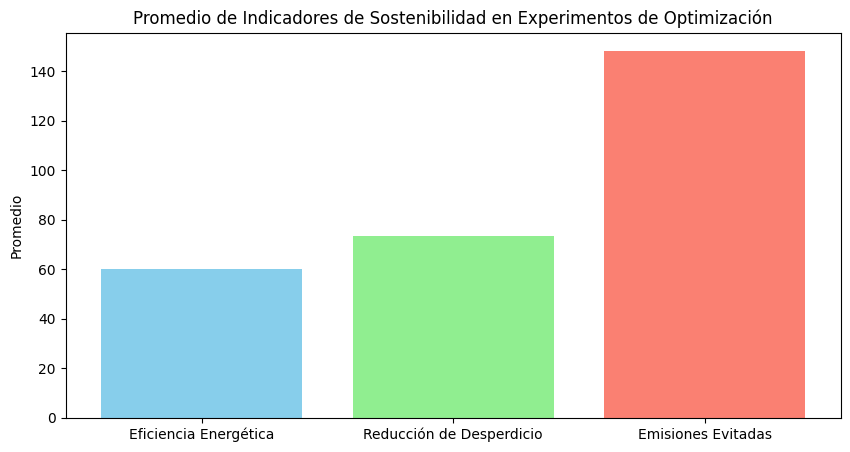

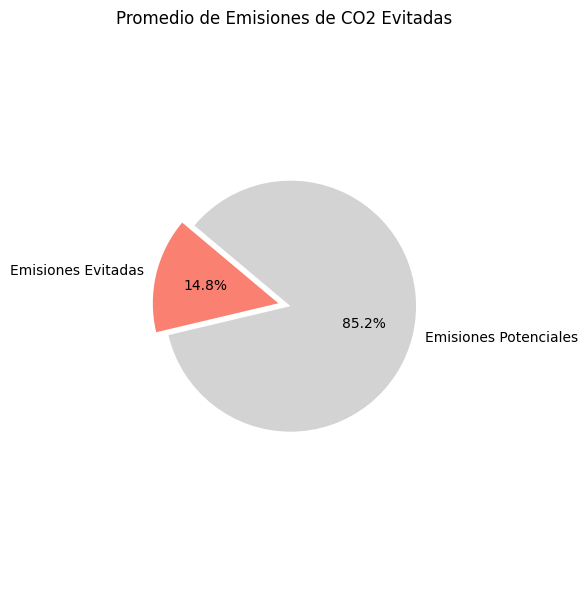

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Simulamos 729 experimentos con datos aleatorios
num_experimentos = 729

# Simulación de datos para cada experimento (en la práctica, estos datos vendrán de un archivo o base de datos)
energia_util = np.random.randint(200, 400, num_experimentos)  # kWh (energía útil generada)
energia_total = np.random.randint(400, 600, num_experimentos)  # kWh (energía total consumida)
recursos_renovables = np.random.randint(200, 350, num_experimentos)  # kWh (recursos renovables utilizados)
recursos_no_renovables = np.random.randint(50, 150, num_experimentos)  # kWh (recursos no renovables)
emisiones_por_kwh = 0.5  # kg CO2 por kWh (suponiendo una constante de emisión)

# Funciones de cálculo de los indicadores
def eficiencia_energetica(energia_util, energia_total):
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_util, emisiones_por_kwh):
    return energia_util * emisiones_por_kwh

# Calculamos los indicadores para cada uno de los 729 experimentos
eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

# Calculamos los promedios de cada indicador
eficiencia_promedio = np.mean(eficiencia)
reduccion_promedio = np.mean(reduccion)
emisiones_ev_promedio = np.mean(emisiones_ev)

# Imprimir promedios
print(f"Promedio de Eficiencia Energética: {eficiencia_promedio:.2f}%")
print(f"Promedio de Reducción de Desperdicio: {reduccion_promedio:.2f}%")
print(f"Promedio de Emisiones Evitadas: {emisiones_ev_promedio:.2f} kg CO2")

# Graficamos los resultados

# Gráfico de barras para los promedios de los indicadores
indicators = ['Eficiencia Energética', 'Reducción de Desperdicio', 'Emisiones Evitadas']
values = [eficiencia_promedio, reduccion_promedio, emisiones_ev_promedio]

plt.figure(figsize=(10, 5))
plt.bar(indicators, values, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylabel('Promedio')
plt.title('Promedio de Indicadores de Sostenibilidad en Experimentos de Optimización')

# Gráfico circular para emisiones evitadas
sizes = [emisiones_ev_promedio, 1000 - emisiones_ev_promedio]  # 1000 kg CO2 es el total
colors = ['salmon', 'lightgray']
explode = (0.1, 0)  # "Explota" la primera sección

plt.figure(figsize=(6, 6))
plt.pie(sizes, explode=explode, labels=['Emisiones Evitadas', 'Emisiones Potenciales'], colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico sea un círculo perfecto
plt.title('Promedio de Emisiones de CO2 Evitadas')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Simulamos resultados de 10 experimentos de optimización
# Los valores en cada experimento son ejemplos de cómo se pueden almacenar los datos
num_experimentos = 10

# Datos simulados por experimento
energia_util = np.random.randint(200, 400, num_experimentos)  # kW
energia_total = np.random.randint(400, 600, num_experimentos)  # kW
recursos_renovables = np.random.randint(200, 350, num_experimentos)  # kW
recursos_no_renovables = np.random.randint(50, 150, num_experimentos)  # kW
emisiones_por_kwh = 0.5  # kg CO2/kWh, valor constante para simplificación

# Funciones de cálculo de indicadores
def eficiencia_energetica(energia_util, energia_total):
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_util, emisiones_por_kwh):
    return energia_util * emisiones_por_kwh

# Calculamos los indicadores para cada experimento
eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

# Calculamos los promedios de cada indicador
eficiencia_promedio = np.mean(eficiencia)
reduccion_promedio = np.mean(reduccion)
emisiones_ev_promedio = np.mean(emisiones_ev)

# Imprimir promedios
print(f"Promedio de Eficiencia Energética: {eficiencia_promedio:.2f}%")
print(f"Promedio de Reducción de Desperdicio: {reduccion_promedio:.2f}%")
print(f"Promedio de Emisiones Evitadas: {emisiones_ev_promedio:.2f} kg CO2")

# Graficamos los resultados
indicators = ['Eficiencia Energética', 'Reducción de Desperdicio', 'Emisiones Evitadas']
values = [eficiencia_promedio, reduccion_promedio, emisiones_ev_promedio]

plt.figure(figsize=(10, 5))

# Gráfico de barras para los promedios de los indicadores
plt.bar(indicators, values, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylabel('Promedio')
plt.title('Promedio de Indicadores de Sostenibilidad en Experimentos de Optimización')

# Gráfico circular para emisiones evitadas
sizes = [emisiones_ev_promedio, 1000 - emisiones_ev_promedio]  # 1000 kg CO2 es el total
colors = ['salmon', 'lightgray']
explode = (0.1, 0)  # "Explota" la primera sección

plt.figure(figsize=(6, 6))
plt.pie(sizes, explode=explode, labels=['Emisiones Evitadas', 'Emisiones Potenciales'], colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Para que el gráfico sea un círculo perfecto
plt.title('Promedio de Emisiones de CO2 Evitadas')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go

# Definición de funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

def reduccion_desperdicio(recursos_renovables, recursos_no_renovables):
    """Calcula la reducción de desperdicio de recursos."""
    return (recursos_renovables / (recursos_renovables + recursos_no_renovables)) * 100

def emisiones_evitar(energia_producida, emisiones_por_kwh):
    """Calcula las emisiones de CO2 evitadas."""
    return energia_producida * emisiones_por_kwh

# Ejemplo de uso
energia_util = 350  # kW, ejemplo de energía útil generada
energia_total = 500  # kW, ejemplo de energía total consumida
recursos_renovables = 300  # kW
recursos_no_renovables = 100  # kW
emisiones_por_kwh = 0.5  # kg CO2/kWh

# Cálculos de indicadores
eficiencia = eficiencia_energetica(energia_util, energia_total)
reduccion = reduccion_desperdicio(recursos_renovables, recursos_no_renovables)
emisiones_ev = emisiones_evitar(energia_util, emisiones_por_kwh)

# Imprimir resultados en consola
print(f"Eficiencia Energética: {eficiencia:.2f}%")
print(f"Reducción de Desperdicio: {reduccion:.2f}%")
print(f"Emisiones de CO2 Evitadas: {emisiones_ev:.2f} kg")

# Visualización de resultados con Plotly
# Gráfico de barras para eficiencia y reducción de desperdicio
fig1 = go.Figure()
indicators = ['Eficiencia Energética', 'Reducción de Desperdicio']
values = [eficiencia, reduccion]

fig1.add_trace(go.Bar(
    x=indicators,
    y=values,
    marker_color=['#1f77b4', '#ff7f0e']
))

fig1.update_layout(
    title='Indicadores de Sostenibilidad',
    yaxis_title='Porcentaje (%)',
    template='plotly_white',
    showlegend=False
)

# Gráfico circular para emisiones evitadas
labels = ['Emisiones Evitadas', 'Emisiones Potenciales']
sizes = [emisiones_ev, 1000 - emisiones_ev]  # Suponiendo un total de 1000 kg como ejemplo

fig2 = go.Figure(data=[go.Pie(labels=labels, values=sizes, hole=.3,
                                marker=dict(colors=['#d62728', '#7f7f7f']))])

fig2.update_layout(
    title='Emisiones de CO2 Evitadas',
    template='plotly_white'
)

# Mostrar los gráficos
fig1.show()
fig2.show()


Eficiencia Energética: 70.00%
Reducción de Desperdicio: 75.00%
Emisiones de CO2 Evitadas: 175.00 kg


**analizar resultado**

In [ ]:
import numpy as np

# Simulaciones de diferentes escenarios
def simular_escenarios(num_escenarios):
    resultados = []
    for i in range(num_escenarios):
        # Ejemplo de variaciones en producción energética
        energia_eolica = np.random.uniform(150, 200)  # kW
        energia_solar = np.random.uniform(150, 200)   # kW
        energia_total = energia_eolica + energia_solar

        eficiencia = eficiencia_energetica(energia_total, 500)  # 500 kW como energía total consumida
        resultados.append((energia_eolica, energia_solar, energia_total, eficiencia))
    return resultados

# Ejecutar simulaciones
resultados = simular_escenarios(10)

# Analizar resultados
for i, (eolica, solar, total, eficiencia) in enumerate(resultados):
    print(f"Escenario {i+1}: Eólica: {eolica:.2f} kW, Solar: {solar:.2f} kW, Total: {total:.2f} kW, Eficiencia: {eficiencia:.2f}%")


Escenario 1: Eólica: 169.47 kW, Solar: 170.73 kW, Total: 340.20 kW, Eficiencia: 68.04%
Escenario 2: Eólica: 184.95 kW, Solar: 193.75 kW, Total: 378.70 kW, Eficiencia: 75.74%
Escenario 3: Eólica: 198.78 kW, Solar: 161.52 kW, Total: 360.30 kW, Eficiencia: 72.06%
Escenario 4: Eólica: 195.79 kW, Solar: 160.90 kW, Total: 356.68 kW, Eficiencia: 71.34%
Escenario 5: Eólica: 180.29 kW, Solar: 172.18 kW, Total: 352.47 kW, Eficiencia: 70.49%
Escenario 6: Eólica: 161.60 kW, Solar: 173.55 kW, Total: 335.15 kW, Eficiencia: 67.03%
Escenario 7: Eólica: 190.05 kW, Solar: 172.65 kW, Total: 362.70 kW, Eficiencia: 72.54%
Escenario 8: Eólica: 185.03 kW, Solar: 172.01 kW, Total: 357.04 kW, Eficiencia: 71.41%
Escenario 9: Eólica: 182.80 kW, Solar: 179.06 kW, Total: 361.86 kW, Eficiencia: 72.37%
Escenario 10: Eólica: 186.87 kW, Solar: 156.33 kW, Total: 343.19 kW, Eficiencia: 68.64%


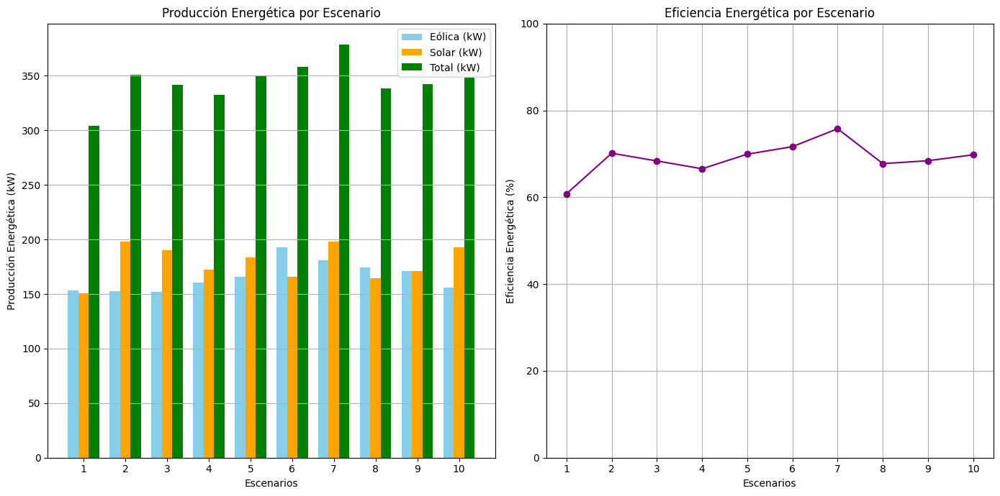

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

# Simulaciones de diferentes escenarios
def simular_escenarios(num_escenarios):
    resultados = []
    for i in range(num_escenarios):
        # Ejemplo de variaciones en producción energética
        energia_eolica = np.random.uniform(150, 200)  # kW
        energia_solar = np.random.uniform(150, 200)   # kW
        energia_total = energia_eolica + energia_solar

        eficiencia = eficiencia_energetica(energia_total, 500)  # 500 kW como energía total consumida
        resultados.append((energia_eolica, energia_solar, energia_total, eficiencia))
    return resultados

# Ejecutar simulaciones
num_escenarios = 10
resultados = simular_escenarios(num_escenarios)

# Separar los resultados para graficar
eolica = [resultado[0] for resultado in resultados]
solar = [resultado[1] for resultado in resultados]
total = [resultado[2] for resultado in resultados]
eficiencia = [resultado[3] for resultado in resultados]

# Configuración de los gráficos
plt.figure(figsize=(14, 7))

# Gráfico de barras para la producción energética
plt.subplot(1, 2, 1)
bar_width = 0.25
indices = np.arange(num_escenarios)

plt.bar(indices, eolica, width=bar_width, label='Eólica (kW)', color='skyblue')
plt.bar(indices + bar_width, solar, width=bar_width, label='Solar (kW)', color='orange')
plt.bar(indices + 2 * bar_width, total, width=bar_width, label='Total (kW)', color='green')

plt.xlabel('Escenarios')
plt.ylabel('Producción Energética (kW)')
plt.title('Producción Energética por Escenario')
plt.xticks(indices + bar_width, [f'{i + 1}' for i in range(num_escenarios)])
plt.legend()
plt.grid(axis='y')

# Gráfico de líneas para la eficiencia
plt.subplot(1, 2, 2)
plt.plot(range(1, num_escenarios + 1), eficiencia, marker='o', color='purple', linestyle='-')
plt.xlabel('Escenarios')
plt.ylabel('Eficiencia Energética (%)')
plt.title('Eficiencia Energética por Escenario')
plt.xticks(range(1, num_escenarios + 1))
plt.ylim(0, 100)
plt.grid()

# Mostrar los gráficos
plt.tight_layout()
plt.show()


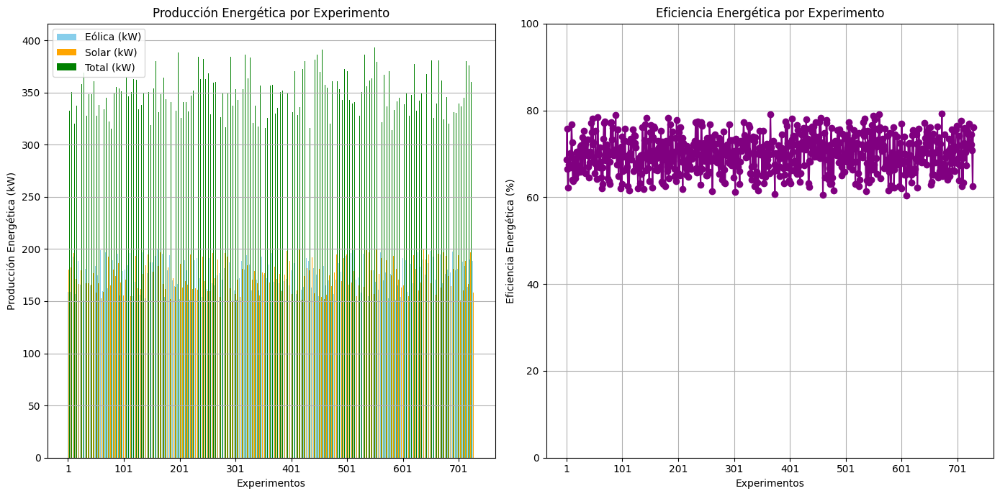

In [73]:
import numpy as np
import matplotlib.pyplot as plt

# Funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

# Supongamos que ya tienes los 729 experimentos como listas de energía eólica, solar y total.
# Reemplaza estos con tus datos reales.
energia_eolica = np.random.uniform(150, 200, 729)  # kW (ejemplo de datos reales)
energia_solar = np.random.uniform(150, 200, 729)   # kW (ejemplo de datos reales)
energia_total = energia_eolica + energia_solar

# Calculamos la eficiencia energética para cada experimento
energia_consumida = 500  # Asumimos 500 kW como la energía total consumida
eficiencia = eficiencia_energetica(energia_total, energia_consumida)

# Configuración de los gráficos
plt.figure(figsize=(14, 7))

# Gráfico de barras para la producción energética
plt.subplot(1, 2, 1)
bar_width = 0.25
indices = np.arange(729)

# Gráfico de barras con la producción energética
plt.bar(indices, energia_eolica, width=bar_width, label='Eólica (kW)', color='skyblue')
plt.bar(indices + bar_width, energia_solar, width=bar_width, label='Solar (kW)', color='orange')
plt.bar(indices + 2 * bar_width, energia_total, width=bar_width, label='Total (kW)', color='green')

plt.xlabel('Experimentos')
plt.ylabel('Producción Energética (kW)')
plt.title('Producción Energética por Experimento')
plt.xticks(indices[::100], [f'{i+1}' for i in range(0, 729, 100)])  # Mostrar menos ticks
plt.legend()
plt.grid(axis='y')

# Gráfico de líneas para la eficiencia
plt.subplot(1, 2, 2)
plt.plot(range(1, 730), eficiencia, marker='o', color='purple', linestyle='-')
plt.xlabel('Experimentos')
plt.ylabel('Eficiencia Energética (%)')
plt.title('Eficiencia Energética por Experimento')
plt.xticks(range(1, 730, 100))  # Mostrar menos ticks
plt.ylim(0, 100)
plt.grid()

# Mostrar los gráficos
plt.tight_layout()
plt.show()


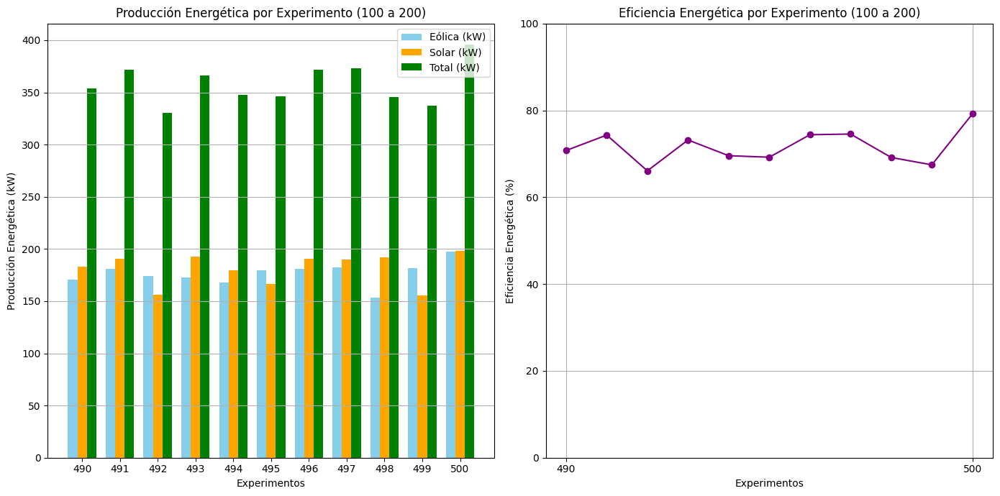

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# Funciones para calcular indicadores de sostenibilidad
def eficiencia_energetica(energia_util, energia_total):
    """Calcula la eficiencia energética."""
    return (energia_util / energia_total) * 100

# Supongamos que ya tienes los 729 experimentos como listas de energía eólica, solar y total.
# Reemplaza estos con tus datos reales.
energia_eolica = np.random.uniform(150, 200, 729)  # kW (ejemplo de datos reales)
energia_solar = np.random.uniform(150, 200, 729)   # kW (ejemplo de datos reales)
energia_total = energia_eolica + energia_solar

# Calculamos la eficiencia energética para cada experimento
energia_consumida = 500  # Asumimos 500 kW como la energía total consumida
eficiencia = eficiencia_energetica(energia_total, energia_consumida)

# Definir el rango de experimentos a graficar
inicio = 490  # Índice de inicio (100)
fin = 500     # Índice de fin (200)

# Seleccionar los datos para el rango específico
energia_eolica_rango = energia_eolica[inicio-1:fin]  # De 100 a 200 (ajustado para índice 0)
energia_solar_rango = energia_solar[inicio-1:fin]     # De 100 a 200
energia_total_rango = energia_total[inicio-1:fin]     # De 100 a 200
eficiencia_rango = eficiencia[inicio-1:fin]           # De 100 a 200

# Configuración de los gráficos
plt.figure(figsize=(14, 7))

# Gráfico de barras para la producción energética
plt.subplot(1, 2, 1)
bar_width = 0.25
indices = np.arange(fin - inicio + 1)

# Gráfico de barras con la producción energética
plt.bar(indices, energia_eolica_rango, width=bar_width, label='Eólica (kW)', color='skyblue')
plt.bar(indices + bar_width, energia_solar_rango, width=bar_width, label='Solar (kW)', color='orange')
plt.bar(indices + 2 * bar_width, energia_total_rango, width=bar_width, label='Total (kW)', color='green')

plt.xlabel('Experimentos')
plt.ylabel('Producción Energética (kW)')
plt.title('Producción Energética por Experimento (100 a 200)')
plt.xticks(indices + bar_width, [f'{i + inicio}' for i in range(fin - inicio + 1)])  # Etiquetas para los experimentos
plt.legend()
plt.grid(axis='y')

# Gráfico de líneas para la eficiencia
plt.subplot(1, 2, 2)
plt.plot(range(inicio, fin + 1), eficiencia_rango, marker='o', color='purple', linestyle='-')
plt.xlabel('Experimentos')
plt.ylabel('Eficiencia Energética (%)')
plt.title('Eficiencia Energética por Experimento (100 a 200)')
plt.xticks(range(inicio, fin + 1, 10))  # Mostrar menos ticks
plt.ylim(0, 100)
plt.grid()

# Mostrar los gráficos
plt.tight_layout()
plt.show()


# **CÓDIGO DEL 3ER OBJETIVO: IMPLEMENTACIÓN SISTEMA DE EVALUACIÓN**

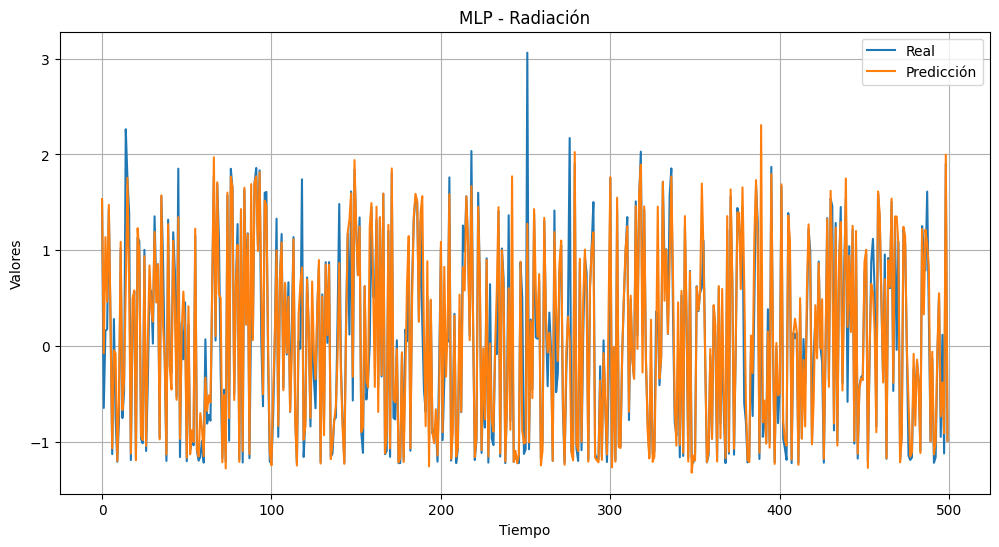

In [ ]:
import matplotlib.pyplot as plt

# Función mejorada para graficar predicciones
def plot_predictions(y_true, y_pred, title, num_points=None):
    plt.figure(figsize=(12, 6))
    if num_points:
        plt.plot(y_true.flatten()[:num_points], label='Real')
        plt.plot(y_pred.flatten()[:num_points], label='Predicción')
    else:
        plt.plot(y_true.flatten(), label='Real')
        plt.plot(y_pred.flatten(), label='Predicción')
    plt.title(title)
    plt.xlabel('Tiempo')
    plt.ylabel('Valores')
    plt.legend()
    plt.grid(True)
    plt.show()

# Ejemplo de uso
plot_predictions(y_test_rad, y_pred_mlp_rad, 'MLP - Radiación', num_points=500)


In [ ]:
# Función para graficar predicciones interactivas
def plot_predictions_interactive(y_true, y_pred, title, num_points=None):
    fig = go.Figure()

    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred = y_pred.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred = y_pred.flatten()

    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real'))
    fig.add_trace(go.Scatter(y=y_pred, mode='lines', name='Predicción'))

    fig.update_layout(title=title, xaxis_title='Tiempo', yaxis_title='Valores', template='plotly_dark')
    fig.show()

# Ejemplo de uso
plot_predictions_interactive(y_test_rad, y_pred_mlp_rad, 'MLP - Radiación', num_points=50)


In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas
def plot_predictions_analysis(y_true, y_pred_mlp, y_pred_lstm, y_pred_cnn, title, num_points=None):
    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred_mlp = y_pred_mlp.flatten()[:num_points]
        y_pred_lstm = y_pred_lstm.flatten()[:num_points]
        y_pred_cnn = y_pred_cnn.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred_mlp = y_pred_mlp.flatten()
        y_pred_lstm = y_pred_lstm.flatten()
        y_pred_cnn = y_pred_cnn.flatten()

    # Cálculo de métricas
    mse_mlp, mae_mlp = calculate_metrics(y_true, y_pred_mlp)
    mse_lstm, mae_lstm = calculate_metrics(y_true, y_pred_lstm)
    mse_cnn, mae_cnn = calculate_metrics(y_true, y_pred_cnn)

    # Crear subplots
    fig = sp.make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.05,
                           subplot_titles=(f"MLP - {title} (MSE: {mse_mlp:.4f}, MAE: {mae_mlp:.4f})",
                                           f"LSTM - {title} (MSE: {mse_lstm:.4f}, MAE: {mae_lstm:.4f})",
                                           f"CNN - {title} (MSE: {mse_cnn:.4f}, MAE: {mae_cnn:.4f})"))

    # Agregar trazas para MLP
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=1, col=1)
    fig.add_trace(go.Scatter(y=y_pred_mlp, mode='lines', name='Predicción MLP', line=dict(color='orange')), row=1, col=1)

    # Agregar trazas para LSTM
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=2, col=1)
    fig.add_trace(go.Scatter(y=y_pred_lstm, mode='lines', name='Predicción LSTM', line=dict(color='green')), row=2, col=1)

    # Agregar trazas para CNN
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=3, col=1)
    fig.add_trace(go.Scatter(y=y_pred_cnn, mode='lines', name='Predicción CNN', line=dict(color='red')), row=3, col=1)

    # Actualizar diseño
    fig.update_layout(height=900, width=1000, title_text=f"Análisis de Predicciones - {title}",
                      template='plotly_dark', showlegend=False)

    fig.update_xaxes(title_text="Tiempo", row=3, col=1)
    fig.update_yaxes(title_text="Valor", row=1, col=1)

    fig.show()

# Ejemplo de uso con tus datos
plot_predictions_analysis(y_test_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad, 'Radiación', num_points=50)
plot_predictions_analysis(y_test_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, 'Speed', num_points=50)


In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas
def plot_predictions_analysis(y_true, y_pred_mlp, y_pred_lstm, y_pred_cnn, title, num_points=None):
    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred_mlp = y_pred_mlp.flatten()[:num_points]
        y_pred_lstm = y_pred_lstm.flatten()[:num_points]
        y_pred_cnn = y_pred_cnn.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred_mlp = y_pred_mlp.flatten()
        y_pred_lstm = y_pred_lstm.flatten()
        y_pred_cnn = y_pred_cnn.flatten()

    # Cálculo de métricas
    mse_mlp, mae_mlp = calculate_metrics(y_true, y_pred_mlp)
    mse_lstm, mae_lstm = calculate_metrics(y_true, y_pred_lstm)
    mse_cnn, mae_cnn = calculate_metrics(y_true, y_pred_cnn)

    # Crear subplots
    fig = sp.make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.05,
                           subplot_titles=(f"MLP - {title} (MSE: {mse_mlp:.4f}, MAE: {mae_mlp:.4f})",
                                           f"LSTM - {title} (MSE: {mse_lstm:.4f}, MAE: {mae_lstm:.4f})",
                                           f"CNN - {title} (MSE: {mse_cnn:.4f}, MAE: {mae_cnn:.4f})"))

    # Agregar trazas para MLP
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=1, col=1)
    fig.add_trace(go.Scatter(y=y_pred_mlp, mode='lines', name='Predicción MLP', line=dict(color='orange')), row=1, col=1)

    # Agregar trazas para LSTM
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=2, col=1)
    fig.add_trace(go.Scatter(y=y_pred_lstm, mode='lines', name='Predicción LSTM', line=dict(color='green')), row=2, col=1)

    # Agregar trazas para CNN
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='blue')), row=3, col=1)
    fig.add_trace(go.Scatter(y=y_pred_cnn, mode='lines', name='Predicción CNN', line=dict(color='red')), row=3, col=1)

    # Actualizar diseño
    fig.update_layout(height=900, width=1000, title_text=f"Análisis de Predicciones - {title}",
                      template='plotly_dark', showlegend=False)

    fig.update_xaxes(title_text="Tiempo", row=3, col=1)
    fig.update_yaxes(title_text="Valor", row=1, col=1)

    fig.show()

# Ejemplo de uso con tus datos
variables_atmosfericas = ['Radiación', 'Speed', 'Temperatura', 'Humedad', 'Presión']  # Agrega las variables que necesites

# función para cada variable
for var in variables_atmosfericas:
    if var == 'Radiación':
        plot_predictions_analysis(y_test_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad, var, num_points=50)
    elif var == 'Speed':
        plot_predictions_analysis(y_test_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, var, num_points=50)
    elif var == 'Temperatura':
        #  predicciones y valores reales para la temperatura
        plot_predictions_analysis(y_test_temp, y_pred_mlp_temp, y_pred_lstm_temp, y_pred_cnn_temp, var, num_points=50)
    elif var == 'Humedad':
        # predicciones y valores reales para la humedad
        plot_predictions_analysis(y_test_hum, y_pred_mlp_hum, y_pred_lstm_hum, y_pred_cnn_hum, var, num_points=50)
    elif var == 'Presión':
        # predicciones y valores reales para la presión
        plot_predictions_analysis(y_test_press, y_pred_mlp_press, y_pred_lstm_press, y_pred_cnn_press, var, num_points=50)


In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas
def plot_predictions_analysis(y_true, y_pred_mlp, y_pred_lstm, y_pred_cnn, title, num_points=None):
    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred_mlp = y_pred_mlp.flatten()[:num_points]
        y_pred_lstm = y_pred_lstm.flatten()[:num_points]
        y_pred_cnn = y_pred_cnn.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred_mlp = y_pred_mlp.flatten()
        y_pred_lstm = y_pred_lstm.flatten()
        y_pred_cnn = y_pred_cnn.flatten()

    # Cálculo de métricas
    mse_mlp, mae_mlp = calculate_metrics(y_true, y_pred_mlp)
    mse_lstm, mae_lstm = calculate_metrics(y_true, y_pred_lstm)
    mse_cnn, mae_cnn = calculate_metrics(y_true, y_pred_cnn)

    # Crear subplots
    fig = sp.make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.05,
                           subplot_titles=(f"MLP - {title} (MSE: {mse_mlp:.4f}, MAE: {mae_mlp:.4f})",
                                           f"LSTM - {title} (MSE: {mse_lstm:.4f}, MAE: {mae_lstm:.4f})",
                                           f"CNN - {title} (MSE: {mse_cnn:.4f}, MAE: {mae_cnn:.4f})"))

    # Agregar trazas para MLP
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=1, col=1)
    fig.add_trace(go.Scatter(y=y_pred_mlp, mode='lines', name='Predicción MLP', line=dict(color='#1f77b4')), row=1, col=1)

    # Agregar trazas para LSTM
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=2, col=1)
    fig.add_trace(go.Scatter(y=y_pred_lstm, mode='lines', name='Predicción LSTM', line=dict(color='#ff7f0e')), row=2, col=1)

    # Agregar trazas para CNN
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=3, col=1)
    fig.add_trace(go.Scatter(y=y_pred_cnn, mode='lines', name='Predicción CNN', line=dict(color='#2ca02c')), row=3, col=1)

    # Actualizar diseño
    fig.update_layout(height=900, width=1000, title_text=f"Análisis de Predicciones - {title}",
                      template='plotly_white', showlegend=False)

    fig.update_xaxes(title_text="Tiempo", row=3, col=1)
    fig.update_yaxes(title_text="Valor", row=1, col=1)

    fig.show()

# Ejemplo de uso con tus datos para varias variables atmosféricas
# Asegúrate de que tienes las variables adecuadas para cada métrica
plot_predictions_analysis(y_test_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad, 'Radiación', num_points=50)
plot_predictions_analysis(y_test_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, 'Velocidad', num_points=50)
plot_predictions_analysis(y_test_temp, y_pred_mlp_temp, y_pred_lstm_temp, y_pred_cnn_temp, 'Temperatura', num_points=50)
plot_predictions_analysis(y_test_hum, y_pred_mlp_hum, y_pred_lstm_hum, y_pred_cnn_hum, 'Humedad', num_points=50)
plot_predictions_analysis(y_test_press, y_pred_mlp_press, y_pred_lstm_press, y_pred_cnn_press, 'Presión', num_points=50)
plot_predictions_analysis(y_test_wind, y_pred_mlp_wind, y_pred_lstm_wind, y_pred_cnn_wind, 'Dirección', num_points=50)


In [ ]:
import numpy as np
import plotly.graph_objects as go
import plotly.subplots as sp

# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas con fondo gris suave y más análisis
def plot_predictions_analysis(y_true, y_pred_mlp, y_pred_lstm, y_pred_cnn, title, num_points=None):
    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred_mlp = y_pred_mlp.flatten()[:num_points]
        y_pred_lstm = y_pred_lstm.flatten()[:num_points]
        y_pred_cnn = y_pred_cnn.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred_mlp = y_pred_mlp.flatten()
        y_pred_lstm = y_pred_lstm.flatten()
        y_pred_cnn = y_pred_cnn.flatten()

    # Cálculo de métricas
    mse_mlp, mae_mlp = calculate_metrics(y_true, y_pred_mlp)
    mse_lstm, mae_lstm = calculate_metrics(y_true, y_pred_lstm)
    mse_cnn, mae_cnn = calculate_metrics(y_true, y_pred_cnn)

    # Crear subplots
    fig = sp.make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                           subplot_titles=(f"MLP - {title} (MSE: {mse_mlp:.4f}, MAE: {mae_mlp:.4f})",
                                           f"LSTM - {title} (MSE: {mse_lstm:.4f}, MAE: {mae_lstm:.4f})",
                                           f"CNN - {title} (MSE: {mse_cnn:.4f}, MAE: {mae_cnn:.4f})",
                                           f"Análisis de Errores - {title}"))

    # Agregar trazas para MLP
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=1, col=1)
    fig.add_trace(go.Scatter(y=y_pred_mlp, mode='lines', name='Predicción MLP', line=dict(color='#1f77b4')), row=1, col=1)

    # Agregar línea de tendencia MLP
    fig.add_trace(go.Scatter(y=np.poly1d(np.polyfit(np.arange(len(y_pred_mlp)), y_pred_mlp, 1))(np.arange(len(y_pred_mlp))),
                             mode='lines', name='Tendencia MLP', line=dict(color='#1f77b4', dash='dash')), row=1, col=1)

    # Agregar trazas para LSTM
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=2, col=1)
    fig.add_trace(go.Scatter(y=y_pred_lstm, mode='lines', name='Predicción LSTM', line=dict(color='#ff7f0e')), row=2, col=1)

    # Agregar línea de tendencia LSTM
    fig.add_trace(go.Scatter(y=np.poly1d(np.polyfit(np.arange(len(y_pred_lstm)), y_pred_lstm, 1))(np.arange(len(y_pred_lstm))),
                             mode='lines', name='Tendencia LSTM', line=dict(color='#ff7f0e', dash='dash')), row=2, col=1)

    # Agregar trazas para CNN
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=3, col=1)
    fig.add_trace(go.Scatter(y=y_pred_cnn, mode='lines', name='Predicción CNN', line=dict(color='#2ca02c')), row=3, col=1)

    # Agregar línea de tendencia CNN
    fig.add_trace(go.Scatter(y=np.poly1d(np.polyfit(np.arange(len(y_pred_cnn)), y_pred_cnn, 1))(np.arange(len(y_pred_cnn))),
                             mode='lines', name='Tendencia CNN', line=dict(color='#2ca02c', dash='dash')), row=3, col=1)

    # Gráfico de errores
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_mlp, mode='markers', name='Error MLP',
                             marker=dict(color='#1f77b4')), row=4, col=1)
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_lstm, mode='markers', name='Error LSTM',
                             marker=dict(color='#ff7f0e')), row=4, col=1)
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_cnn, mode='markers', name='Error CNN',
                             marker=dict(color='#2ca02c')), row=4, col=1)

    # Actualizar diseño con fondo gris suave
    fig.update_layout(height=1200, width=1000, title_text=f"Análisis de Predicciones - {title}",
                      plot_bgcolor='rgb(240,240,240)', paper_bgcolor='rgb(240,240,240)',
                      showlegend=False, template=None)

    fig.update_xaxes(title_text="Tiempo", row=4, col=1)
    fig.update_yaxes(title_text="Valor", row=1, col=1)

    fig.show()

# datos para múltiples variables
plot_predictions_analysis(y_test_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad, 'Radiación', num_points=50)
plot_predictions_analysis(y_test_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, 'Speed', num_points=50)
plot_predictions_analysis(y_test_temp, y_pred_mlp_temp, y_pred_lstm_temp, y_pred_cnn_temp, 'Temperatura', num_points=50)
plot_predictions_analysis(y_test_hum, y_pred_mlp_hum, y_pred_lstm_hum, y_pred_cnn_hum, 'Humedad', num_points=50)
plot_predictions_analysis(y_test_press, y_pred_mlp_press, y_pred_lstm_press, y_pred_cnn_press, 'Presión', num_points=50)
plot_predictions_analysis(y_test_wind, y_pred_mlp_wind, y_pred_lstm_wind, y_pred_cnn_wind, 'Dirección', num_points=50)



In [ ]:
import numpy as np


# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas con fondo gris suave y botones para líneas de tendencia
def plot_predictions_analysis(y_true, y_pred_mlp, y_pred_lstm, y_pred_cnn, title, num_points=None):
    if num_points:
        y_true = y_true.flatten()[:num_points]
        y_pred_mlp = y_pred_mlp.flatten()[:num_points]
        y_pred_lstm = y_pred_lstm.flatten()[:num_points]
        y_pred_cnn = y_pred_cnn.flatten()[:num_points]
    else:
        y_true = y_true.flatten()
        y_pred_mlp = y_pred_mlp.flatten()
        y_pred_lstm = y_pred_lstm.flatten()
        y_pred_cnn = y_pred_cnn.flatten()

    # Cálculo de métricas
    mse_mlp, mae_mlp = calculate_metrics(y_true, y_pred_mlp)
    mse_lstm, mae_lstm = calculate_metrics(y_true, y_pred_lstm)
    mse_cnn, mae_cnn = calculate_metrics(y_true, y_pred_cnn)

    # Crear subplots
    fig = sp.make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                           subplot_titles=(f"MLP - {title} (MSE: {mse_mlp:.4f}, MAE: {mae_mlp:.4f})",
                                           f"LSTM - {title} (MSE: {mse_lstm:.4f}, MAE: {mae_lstm:.4f})",
                                           f"CNN - {title} (MSE: {mse_cnn:.4f}, MAE: {mae_cnn:.4f})",
                                           f"Análisis de Errores - {title}"))

    # Agregar trazas para MLP
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=1, col=1)
    fig.add_trace(go.Scatter(y=y_pred_mlp, mode='lines', name='Predicción MLP', line=dict(color='#1f77b4')), row=1, col=1)

    # Agregar línea de tendencia MLP
    trend_mlp = np.poly1d(np.polyfit(np.arange(len(y_pred_mlp)), y_pred_mlp, 1))(np.arange(len(y_pred_mlp)))
    fig.add_trace(go.Scatter(y=trend_mlp, mode='lines', name='Tendencia MLP', line=dict(color='#1f77b4', dash='dash'), visible=False), row=1, col=1)

    # Agregar trazas para LSTM
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=2, col=1)
    fig.add_trace(go.Scatter(y=y_pred_lstm, mode='lines', name='Predicción LSTM', line=dict(color='#ff7f0e')), row=2, col=1)

    # Agregar línea de tendencia LSTM
    trend_lstm = np.poly1d(np.polyfit(np.arange(len(y_pred_lstm)), y_pred_lstm, 1))(np.arange(len(y_pred_lstm)))
    fig.add_trace(go.Scatter(y=trend_lstm, mode='lines', name='Tendencia LSTM', line=dict(color='#ff7f0e', dash='dash'), visible=False), row=2, col=1)

    # Agregar trazas para CNN
    fig.add_trace(go.Scatter(y=y_true, mode='lines', name='Real', line=dict(color='black')), row=3, col=1)
    fig.add_trace(go.Scatter(y=y_pred_cnn, mode='lines', name='Predicción CNN', line=dict(color='#2ca02c')), row=3, col=1)

    # Agregar línea de tendencia CNN
    trend_cnn = np.poly1d(np.polyfit(np.arange(len(y_pred_cnn)), y_pred_cnn, 1))(np.arange(len(y_pred_cnn)))
    fig.add_trace(go.Scatter(y=trend_cnn, mode='lines', name='Tendencia CNN', line=dict(color='#2ca02c', dash='dash'), visible=False), row=3, col=1)

    # Gráfico de errores
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_mlp, mode='markers', name='Error MLP',
                             marker=dict(color='#1f77b4')), row=4, col=1)
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_lstm, mode='markers', name='Error LSTM',
                             marker=dict(color='#ff7f0e')), row=4, col=1)
    fig.add_trace(go.Scatter(x=np.arange(len(y_true)), y=y_true - y_pred_cnn, mode='markers', name='Error CNN',
                             marker=dict(color='#2ca02c')), row=4, col=1)

    # Botones para mostrar/ocultar las líneas de tendencia
    fig.update_layout(
        updatemenus=[
            dict(
                type="buttons",
                direction="right",
                x=0.7,
                y=1.2,
                buttons=[
                    dict(
                        label="Mostrar Tendencias",
                        method="update",
                        args=[{"visible": [True, True, True, False, False, False, True, True, True, True, True, True]}]
                    ),
                    dict(
                        label="Ocultar Tendencias",
                        method="update",
                        args=[{"visible": [True, True, False, True, False, True, True, True, True, True, True, True]}]
                    )
                ]
            )
        ]
    )

    # Actualizar diseño con fondo gris suave
    fig.update_layout(height=1200, width=1000, title_text=f"Análisis de Predicciones - {title}",
                      plot_bgcolor='rgb(240,240,240)', paper_bgcolor='rgb(240,240,240)',
                      showlegend=False, template=None)

    fig.update_xaxes(title_text="Tiempo", row=4, col=1)
    fig.update_yaxes(title_text="Valor", row=1, col=1)

    fig.show()

# Ejemplo de uso con tus datos
plot_predictions_analysis(y_test_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad, 'Radiación', num_points=50)
plot_predictions_analysis(y_test_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, 'Speed', num_points=50)
plot_predictions_analysis(y_test_temp, y_pred_mlp_temp, y_pred_lstm_temp, y_pred_cnn_temp, 'Temperatura', num_points=50)
plot_predictions_analysis(y_test_hum, y_pred_mlp_hum, y_pred_lstm_hum, y_pred_cnn_hum, 'Humedad', num_points=50)
plot_predictions_analysis(y_test_press, y_pred_mlp_press, y_pred_lstm_press, y_pred_cnn_press, 'Presión', num_points=50)
plot_predictions_analysis(y_test_wind, y_pred_mlp_wind, y_pred_lstm_wind, y_pred_cnn_wind, 'Dirección', num_points=50)



In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas con fondo gris suave y botones/pestañas
def plot_predictions_analysis(y_true_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad,
                              y_true_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, num_points=None):
    # Selección de puntos
    if num_points:
        y_true_rad = y_true_rad.flatten()[:num_points]
        y_pred_mlp_rad = y_pred_mlp_rad.flatten()[:num_points]
        y_pred_lstm_rad = y_pred_lstm_rad.flatten()[:num_points]
        y_pred_cnn_rad = y_pred_cnn_rad.flatten()[:num_points]
        y_true_spd = y_true_spd.flatten()[:num_points]
        y_pred_mlp_spd = y_pred_mlp_spd.flatten()[:num_points]
        y_pred_lstm_spd = y_pred_lstm_spd.flatten()[:num_points]
        y_pred_cnn_spd = y_pred_cnn_spd.flatten()[:num_points]

    # Cálculo de métricas
    mse_mlp_rad, mae_mlp_rad = calculate_metrics(y_true_rad, y_pred_mlp_rad)
    mse_lstm_rad, mae_lstm_rad = calculate_metrics(y_true_rad, y_pred_lstm_rad)
    mse_cnn_rad, mae_cnn_rad = calculate_metrics(y_true_rad, y_pred_cnn_rad)

    mse_mlp_spd, mae_mlp_spd = calculate_metrics(y_true_spd, y_pred_mlp_spd)
    mse_lstm_spd, mae_lstm_spd = calculate_metrics(y_true_spd, y_pred_lstm_spd)
    mse_cnn_spd, mae_cnn_spd = calculate_metrics(y_true_spd, y_pred_cnn_spd)

    # Crear figura principal
    fig = go.Figure()

    # Añadir trazas para Radiación - MLP
    fig.add_trace(go.Scatter(visible=True, y=y_true_rad, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=True, y=y_pred_mlp_rad, mode='lines', name='Predicción MLP', line=dict(color='#1f77b4')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_mlp_rad)), y_pred_mlp_rad, 1))(np.arange(len(y_pred_mlp_rad))),
                             mode='lines', name='Tendencia MLP', line=dict(color='#1f77b4', dash='dash')))

    # Añadir trazas para Radiación - LSTM
    fig.add_trace(go.Scatter(visible=False, y=y_true_rad, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_lstm_rad, mode='lines', name='Predicción LSTM', line=dict(color='#ff7f0e')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_lstm_rad)), y_pred_lstm_rad, 1))(np.arange(len(y_pred_lstm_rad))),
                             mode='lines', name='Tendencia LSTM', line=dict(color='#ff7f0e', dash='dash')))

    # Añadir trazas para Radiación - CNN
    fig.add_trace(go.Scatter(visible=False, y=y_true_rad, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_cnn_rad, mode='lines', name='Predicción CNN', line=dict(color='#2ca02c')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_cnn_rad)), y_pred_cnn_rad, 1))(np.arange(len(y_pred_cnn_rad))),
                             mode='lines', name='Tendencia CNN', line=dict(color='#2ca02c', dash='dash')))

    # Añadir trazas para Velocidad de Viento - MLP
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_mlp_spd, mode='lines', name='Predicción MLP', line=dict(color='#1f77b4')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_mlp_spd)), y_pred_mlp_spd, 1))(np.arange(len(y_pred_mlp_spd))),
                             mode='lines', name='Tendencia MLP', line=dict(color='#1f77b4', dash='dash')))

    # Añadir trazas para Velocidad de Viento - LSTM
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_lstm_spd, mode='lines', name='Predicción LSTM', line=dict(color='#ff7f0e')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_lstm_spd)), y_pred_lstm_spd, 1))(np.arange(len(y_pred_lstm_spd))),
                             mode='lines', name='Tendencia LSTM', line=dict(color='#ff7f0e', dash='dash')))

    # Añadir trazas para Velocidad de Viento - CNN
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_cnn_spd, mode='lines', name='Predicción CNN', line=dict(color='#2ca02c')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_cnn_spd)), y_pred_cnn_spd, 1))(np.arange(len(y_pred_cnn_spd))),
                             mode='lines', name='Tendencia CNN', line=dict(color='#2ca02c', dash='dash')))

    # Actualizar diseño de la gráfica con botones para mostrar diferentes modelos y datos
    fig.update_layout(
        updatemenus=[
            dict(
                type="dropdown",
                active=0,
                buttons=list([
                    dict(label="Radiación - MLP",
                         method="update",
                         args=[{"visible": [True, True, False, False, False, False, False, False, False, False, False, False]},
                               {"title": "Radiación - MLP", "annotations": []}]),
                    dict(label="Radiación - LSTM",
                         method="update",
                         args=[{"visible": [False, False, False, True, True, False, False, False, False, False, False, False]},
                               {"title": "Radiación - LSTM", "annotations": []}]),
                    dict(label="Radiación - CNN",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, True, True, False, False, False, False]},
                               {"title": "Radiación - CNN", "annotations": []}]),
                    dict(label="Velocidad de Viento - MLP",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, True, True, False, False]},
                               {"title": "Velocidad de Viento - MLP", "annotations": []}]),
                    dict(label="Velocidad de Viento - LSTM",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, False, False, True, True]},
                               {"title": "Velocidad de Viento - LSTM", "annotations": []}]),
                    dict(label="Velocidad de Viento - CNN",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, False, False, False, False]},
                               {"title": "Velocidad de Viento - CNN", "annotations": []}])
                ]),
                x=0.15,
                xanchor="left",
                y=1.15,
                yanchor="top"
            ),
            dict(
                type="buttons",
                direction="right",
                x=0.7,
                y=1.15,
                buttons=[
                    dict(
                        label="Mostrar Tendencias",
                        method="update",
                        args=[{"visible": [True, True, True] + [False] * 9}]
                    ),
                    dict(
                        label="Ocultar Tendencias",
                        method="update",
                        args=[{"visible": [True, True, False] + [False] * 9}]
                    )
                ]
            )
        ],
        title_text="Predicciones de Modelos",
        xaxis_title="Tiempo",
        yaxis_title="Valor",
        plot_bgcolor='#e5ecf6'
    )

    # Mostrar figura
    fig.show()

# Ejemplo de uso de la función
y_true_rad = np.random.rand(100)
y_pred_mlp_rad = np.random.rand(100)
y_pred_lstm_rad = np.random.rand(100)
y_pred_cnn_rad = np.random.rand(100)
y_true_spd = np.random.rand(100)
y_pred_mlp_spd = np.random.rand(100)
y_pred_lstm_spd = np.random.rand(100)
y_pred_cnn_spd = np.random.rand(100)

plot_predictions_analysis(y_true_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad,
                          y_true_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd)


In [ ]:
# Función para calcular métricas de rendimiento
def calculate_metrics(y_true, y_pred):
    mse = np.mean(np.square(y_true - y_pred))
    mae = np.mean(np.abs(y_true - y_pred))
    return mse, mae

# Función para graficar predicciones y métricas con fondo gris suave y botones/pestañas
def plot_predictions_analysis(y_true_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad,
                              y_true_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd, num_points=None):
    # Selección de puntos
    if num_points:
        y_true_rad = y_true_rad.flatten()[:num_points]
        y_pred_mlp_rad = y_pred_mlp_rad.flatten()[:num_points]
        y_pred_lstm_rad = y_pred_lstm_rad.flatten()[:num_points]
        y_pred_cnn_rad = y_pred_cnn_rad.flatten()[:num_points]
        y_true_spd = y_true_spd.flatten()[:num_points]
        y_pred_mlp_spd = y_pred_mlp_spd.flatten()[:num_points]
        y_pred_lstm_spd = y_pred_lstm_spd.flatten()[:num_points]
        y_pred_cnn_spd = y_pred_cnn_spd.flatten()[:num_points]

    # Crear figura principal
    fig = go.Figure()

    # Añadir trazas para Radiación - MLP
    fig.add_trace(go.Scatter(visible=True, y=y_true_rad, mode='lines', name='Real (Radiación)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=True, y=y_pred_mlp_rad, mode='lines', name='Predicción MLP (Radiación)', line=dict(color='#1f77b4')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_mlp_rad)), y_pred_mlp_rad, 1))(np.arange(len(y_pred_mlp_rad))),
                             mode='lines', name='Tendencia MLP (Radiación)', line=dict(color='#1f77b4', dash='dash')))

    # Añadir trazas para Radiación - LSTM
    fig.add_trace(go.Scatter(visible=False, y=y_true_rad, mode='lines', name='Real (Radiación)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_lstm_rad, mode='lines', name='Predicción LSTM (Radiación)', line=dict(color='#ff7f0e')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_lstm_rad)), y_pred_lstm_rad, 1))(np.arange(len(y_pred_lstm_rad))),
                             mode='lines', name='Tendencia LSTM (Radiación)', line=dict(color='#ff7f0e', dash='dash')))

    # Añadir trazas para Radiación - CNN
    fig.add_trace(go.Scatter(visible=False, y=y_true_rad, mode='lines', name='Real (Radiación)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_cnn_rad, mode='lines', name='Predicción CNN (Radiación)', line=dict(color='#2ca02c')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_cnn_rad)), y_pred_cnn_rad, 1))(np.arange(len(y_pred_cnn_rad))),
                             mode='lines', name='Tendencia CNN (Radiación)', line=dict(color='#2ca02c', dash='dash')))

    # Añadir trazas para Velocidad de Viento - MLP
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real (Vel. Viento)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_mlp_spd, mode='lines', name='Predicción MLP (Vel. Viento)', line=dict(color='#1f77b4')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_mlp_spd)), y_pred_mlp_spd, 1))(np.arange(len(y_pred_mlp_spd))),
                             mode='lines', name='Tendencia MLP (Vel. Viento)', line=dict(color='#1f77b4', dash='dash')))

    # Añadir trazas para Velocidad de Viento - LSTM
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real (Vel. Viento)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_lstm_spd, mode='lines', name='Predicción LSTM (Vel. Viento)', line=dict(color='#ff7f0e')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_lstm_spd)), y_pred_lstm_spd, 1))(np.arange(len(y_pred_lstm_spd))),
                             mode='lines', name='Tendencia LSTM (Vel. Viento)', line=dict(color='#ff7f0e', dash='dash')))

    # Añadir trazas para Velocidad de Viento - CNN
    fig.add_trace(go.Scatter(visible=False, y=y_true_spd, mode='lines', name='Real (Vel. Viento)', line=dict(color='black')))
    fig.add_trace(go.Scatter(visible=False, y=y_pred_cnn_spd, mode='lines', name='Predicción CNN (Vel. Viento)', line=dict(color='#2ca02c')))
    fig.add_trace(go.Scatter(visible=False, y=np.poly1d(np.polyfit(np.arange(len(y_pred_cnn_spd)), y_pred_cnn_spd, 1))(np.arange(len(y_pred_cnn_spd))),
                             mode='lines', name='Tendencia CNN (Vel. Viento)', line=dict(color='#2ca02c', dash='dash')))

    # Actualizar diseño de la gráfica con botones para mostrar diferentes modelos y datos
    fig.update_layout(
        updatemenus=[
            dict(
                type="dropdown",
                active=0,
                buttons=list([
                    dict(label="Radiación - MLP",
                         method="update",
                         args=[{"visible": [True, True, False, False, False, False, False, False, False, False, False, False]},
                               {"title": "Radiación - MLP"}]),
                    dict(label="Radiación - LSTM",
                         method="update",
                         args=[{"visible": [False, False, False, True, True, False, False, False, False, False, False, False]},
                               {"title": "Radiación - LSTM"}]),
                    dict(label="Radiación - CNN",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, True, True, False, False, False, False]},
                               {"title": "Radiación - CNN"}]),
                    dict(label="Velocidad de Viento - MLP",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, True, True, False, False]},
                               {"title": "Velocidad de Viento - MLP"}]),
                    dict(label="Velocidad de Viento - LSTM",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, False, False, True, True]},
                               {"title": "Velocidad de Viento - LSTM"}]),
                    dict(label="Velocidad de Viento - CNN",
                         method="update",
                         args=[{"visible": [False, False, False, False, False, False, False, False, False, False, False, False]},
                               {"title": "Velocidad de Viento - CNN"}])
                ]),
                x=0.15,
                xanchor="left",
                y=1.15,
                yanchor="top"
            ),
            dict(
                type="buttons",
                direction="right",
                x=0.7,
                y=1.15,
                buttons=[
                    dict(
                        label="Mostrar Tendencias",
                        method="update",
                        args=[{"visible": [False, False, True] + [False] * 9}]
                    ),
                    dict(
                        label="Ocultar Tendencias",
                        method="update",
                        args=[{"visible": [True, True, False] + [False] * 9}]
                    )
                ]
            )
        ],
        title_text="Predicciones de Modelos",
        xaxis_title="Tiempo",
        yaxis_title="Valor",
        plot_bgcolor='#e5ecf6'
    )

    # Mostrar figura
    fig.show()

# Ejemplo de uso de la función
y_true_rad = np.random.rand(100)
y_pred_mlp_rad = np.random.rand(100)
y_pred_lstm_rad = np.random.rand(100)
y_pred_cnn_rad = np.random.rand(100)
y_true_spd = np.random.rand(100)
y_pred_mlp_spd = np.random.rand(100)
y_pred_lstm_spd = np.random.rand(100)
y_pred_cnn_spd = np.random.rand(100)

plot_predictions_analysis(y_true_rad, y_pred_mlp_rad, y_pred_lstm_rad, y_pred_cnn_rad,
                          y_true_spd, y_pred_mlp_spd, y_pred_lstm_spd, y_pred_cnn_spd)


# **Optimización**

In [ ]:
import pulp

# 1. Definición del problema
problem = pulp.LpProblem("Maximizar_Produccion_Energia_Renovable", pulp.LpMaximize)

# 2. Definición de variables de decisión
solar_generation = pulp.LpVariable('Produccion_Solar', lowBound=0)  # Capacidad de producción solar
wind_generation = pulp.LpVariable('Produccion_Eolica', lowBound=0)  # Capacidad de producción eólica
storage_capacity = pulp.LpVariable('Capacidad_Almacenamiento', lowBound=0)  # Almacenamiento de energía

# 3. Definición de la función objetivo
# Maximizar la producción total de energía
problem += solar_generation + wind_generation, "Produccion_Total"

# 4. Definición de restricciones
# Restricción de capacidad de generación solar (ejemplo: 1000 MW)
problem += solar_generation <= 1000, "Capacidad_Maxima_Solar"

# Restricción de capacidad de generación eólica (ejemplo: 800 MW)
problem += wind_generation <= 800, "Capacidad_Maxima_Eolica"

# Restricción de almacenamiento (ejemplo: 500 MW)
problem += storage_capacity <= 500, "Capacidad_Maxima_Almacenamiento"

# Restricciones adicionales pueden incluir:
# - Límites regulatorios o normativos
# - Condiciones climáticas (ejemplo: producción solar máxima durante el día)
# - Otras restricciones específicas de operación

# 5. Resolviendo el problema
problem.solve()

# 6. Resultados
print("Estado de la solución:", pulp.LpStatus[problem.status])
print("Producción Solar:", solar_generation.varValue, "MW")
print("Producción Eólica:", wind_generation.varValue, "MW")
print("Capacidad de Almacenamiento:", storage_capacity.varValue, "MW")
print("Producción Total:", pulp.value(problem.objective), "MW")

# **Integrar**

In [ ]:

def modelo_predictivo():
    solar_prediction = np.random.uniform(0, 1000)  # Predicción de energía solar
    wind_prediction = np.random.uniform(0, 800)    # Predicción de energía eólica
    return solar_prediction, wind_prediction

# Función para construir el sistema de optimización
def construir_sistema_optimizacion(solar_gen, wind_gen):
    # 1. Definición del problema
    problem = pulp.LpProblem("Maximizar_Produccion_Energia_Renovable", pulp.LpMaximize)

    # 2. Definición de variables de decisión
    solar_generation = pulp.LpVariable('Produccion_Solar', lowBound=0)
    wind_generation = pulp.LpVariable('Produccion_Eolica', lowBound=0)

    # 3. Definición de la función objetivo
    problem += solar_generation + wind_generation, "Produccion_Total"

    # 4. Definición de restricciones
    problem += solar_generation <= solar_gen, "Capacidad_Maxima_Solar"
    problem += wind_generation <= wind_gen, "Capacidad_Maxima_Eolica"

    # 5. Resolviendo el problema
    problem.solve()

    # 6. Resultados
    print("Estado de la solución:", pulp.LpStatus[problem.status])
    print("Producción Solar:", solar_generation.varValue, "MW")
    print("Producción Eólica:", wind_generation.varValue, "MW")
    print("Producción Total:", pulp.value(problem.objective), "MW")

# Función para actualizar parámetros dinámicamente
def actualizar_parametros():
    # Obtener nuevas predicciones del modelo
    solar_pred, wind_pred = modelo_predictivo()
    print(f"Nuevas Predicciones -> Solar: {solar_pred:.2f} MW, Eólica: {wind_pred:.2f} MW")

    # Llamar a la función para construir y resolver el sistema de optimización
    construir_sistema_optimizacion(solar_pred, wind_pred)

# Simular la actualización de parámetros en intervalos de tiempo
for _ in range(5):  # Simulamos 5 actualizaciones
    actualizar_parametros()

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import pandas as pd
import numpy as np

# Simulación de datos para las predicciones de producción de energía
def generar_datos_predicciones():
    np.random.seed(42)
    dias = pd.date_range(start="2024-01-01", periods=30, freq='D')
    solar_pred = np.random.uniform(800, 1000, size=(30,))
    wind_pred = np.random.uniform(600, 800, size=(30,))
    return pd.DataFrame({'Fecha': dias, 'Producción Solar (MW)': solar_pred, 'Producción Eólica (MW)': wind_pred})

# Datos de predicción
df = generar_datos_predicciones()

# Inicializar la aplicación Dash
app = dash.Dash(__name__)

# Diseño de la interfaz
app.layout = html.Div([
    html.H1("Visual Analytics de Producción de Energía Renovable"),
    dcc.Graph(id='grafico-produccion'),
    html.Label("Seleccione la fuente de energía:"),
    dcc.Dropdown(
        id='dropdown-fuente',
        options=[
            {'label': 'Producción Solar (MW)', 'value': 'Producción Solar (MW)'},
            {'label': 'Producción Eólica (MW)', 'value': 'Producción Eólica (MW)'}
        ],
        value='Producción Solar (MW)',  # Valor predeterminado
        clearable=False
    ),
    html.Div(id='resultado-optimizacion')
])

# Callback para actualizar el gráfico según la fuente seleccionada
@app.callback(
    Output('grafico-produccion', 'figure'),
    Output('resultado-optimizacion', 'children'),
    Input('dropdown-fuente', 'value')
)
def actualizar_grafico(fuente):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['Fecha'], y=df[fuente], mode='lines+markers', name=fuente))
    fig.update_layout(title='Predicción de Producción de Energía',
                      xaxis_title='Fecha',
                      yaxis_title='Producción (MW)')

    # Simulando un resultado de optimización
    resultado_optimizacion = f"Resultado de optimización para {fuente}: {df[fuente].mean():.2f} MW"

    return fig, resultado_optimizacion

# Ejecutar la aplicación
if __name__ == '__main__':
    app.run_server(debug=True)